In [ ]:
#                                                                    PGE

In [24]:
#Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys

In [25]:
#Load company financial dataset
data = pd.read_excel("C:/Users/kmate/Desktop/Praca licencjacka/dane/Europa/PGE_dataset.xlsx")

#Wkradła mi sie niepotrzena kopia jednej kolumny, usuwam ją
data['Rok'] = data['Kwartał'].str[-4:].astype(int)  # Extract last 4 characters as year
data['Q'] = data['Kwartał'].str[1:2].astype(int)  # Extract 2nd character as quarter

import datetime

def quarter_end_date(row):
    year = row['Rok']
    quarter = row['Q']
    month = 3 * quarter
    
    # Calculate the last day of the quarter
    if month == 12:
        quarter_end = datetime.date(year, month, 31)
    else:
        next_month = month + 1
        next_month_start = datetime.date(year, next_month, 1)
        quarter_end = next_month_start - datetime.timedelta(days=1)
    
    return quarter_end
    
data["Date"] = data[["Rok", "Q"]].apply(quarter_end_date, axis=1) 
data = data.set_index('Date')
data = data.fillna(0)

#Show dataset information
print("PGE")
print(data.info())

PGE
<class 'pandas.core.frame.DataFrame'>
Index: 52 entries, 2011-03-31 to 2023-12-31
Data columns (total 19 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Indeks                              52 non-null     int64 
 1   Kwartał                             52 non-null     object
 2   Przychody ogółem                    52 non-null     int64 
 3   Zysk brutto ze sprzedaży            52 non-null     int64 
 4   Zysk z działalności operacyjnej     52 non-null     int64 
 5   EBITDA                              52 non-null     int64 
 6   Przychody finansowe                 52 non-null     int64 
 7   Wydatki finansowe                   52 non-null     int64 
 8   Zysk brutto                         52 non-null     int64 
 9   Aktywa trwałe                       52 non-null     int64 
 10  Aktywa obrotowe                     52 non-null     int64 
 11  Kapitał własny ogółem               52 non-n

In [3]:
describe = data.corr(numeric_only=True)
#describe.to_excel("corr_PGE.xlsx")
describe

,Indeks,Przychody ogółem,Zysk brutto ze sprzedaży,Zysk z działalności operacyjnej,EBITDA,Przychody finansowe,Wydatki finansowe,Zysk brutto,Aktywa trwałe,Aktywa obrotowe,Kapitał własny ogółem,Kapitał własny spółki dominującej,Zobowiązania długoterminowe,Długoterminowe kredyty i pożyczki,Zobowiązania krótkoterminowe,Pożyczki krótkoterminowe,Rok,Q
Indeks,1.000000,-0.100633,-0.061384,0.054295,0.173208,0.061088,0.088063,0.100781,-0.150677,-0.090850,-0.166876,-0.167602,-0.137372,-0.120295,-0.091857,-0.084792,-9.972214e-01,-7.449423e-02
Przychody ogółem,-0.100633,1.000000,0.978021,0.145210,-0.040001,0.875711,-0.993008,-0.130969,0.947194,0.997649,0.821202,0.822264,0.960882,0.987952,0.997696,0.942279,1.051672e-01,-5.694083e-02
Zysk brutto ze sprzedaży,-0.061384,0.978021,1.000000,0.241413,0.159321,0.899499,-0.977915,-0.026676,0.959338,0.973190,0.876915,0.877420,0.952601,0.967813,0.970998,0.919025,6.335020e-02,-2.402503e-02
Zysk z działalności operacyjnej,0.054295,0.145210,0.241413,1.000000,0.408793,0.243830,-0.195727,0.954139,0.200481,0.139293,0.337996,0.336665,0.087796,0.111768,0.133805,0.287807,-5.778471e-02,4.468428e-02
EBITDA,0.173208,-0.040001,0.159321,0.408793,1.000000,0.153048,0.004420,0.422199,0.129129,-0.052914,0.332339,0.329767,0.036137,-0.026666,-0.064314,-0.061997,-1.829582e-01,1.240665e-01
Przychody finansowe,0.061088,0.875711,0.899499,0.243830,0.153048,1.000000,-0.882277,0.044624,0.853999,0.873414,0.777766,0.778150,0.848659,0.861510,0.871353,0.816404,-6.251753e-02,1.686023e-02
Wydatki finansowe,0.088063,-0.993008,-0.977915,-0.195727,0.004420,-0.882277,1.000000,0.082420,-0.938484,-0.988340,-0.828625,-0.829599,-0.938264,-0.973073,-0.987987,-0.965892,-9.192442e-02,4.840501e-02
Zysk brutto,0.100781,-0.130969,-0.026676,0.954139,0.422199,0.044624,0.082420,1.000000,-0.054755,-0.134170,0.116802,0.115133,-0.168403,-0.156775,-0.139836,0.014433,-1.048648e-01,5.090841e-02
Aktywa trwałe,-0.150677,0.947194,0.959338,0.200481,0.129129,0.853999,-0.938484,-0.054755,1.000000,0.954323,0.951370,0.951995,0.983849,0.973867,0.951027,0.875526,1.630220e-01,-1.596352e-01
Aktywa obrotowe,-0.090850,0.997649,0.973190,0.139293,-0.052914,0.873414,-0.988340,-0.134170,0.954323,1.000000,0.830447,0.831561,0.967888,0.992816,0.999883,0.940979,9.860993e-02,-1.004852e-01


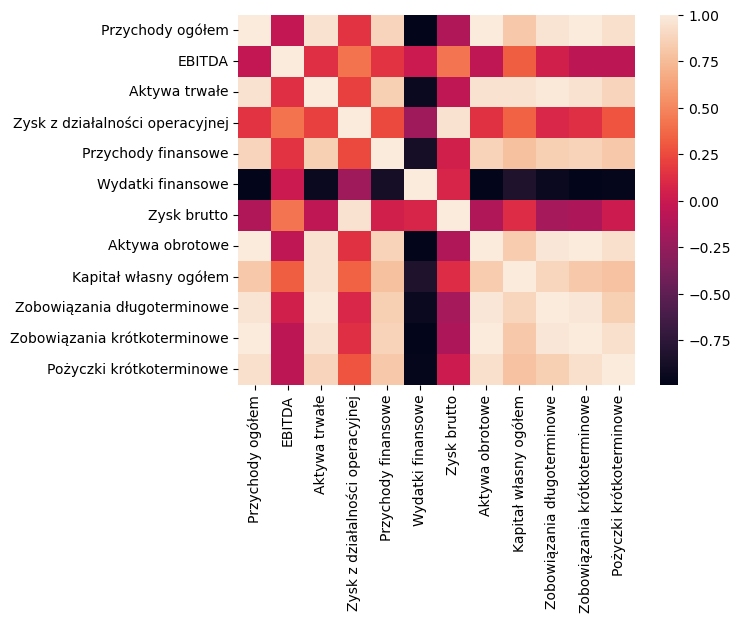

In [4]:
import pandas as pd
corr = data[["Przychody ogółem", "EBITDA", "Aktywa trwałe", "Zysk z działalności operacyjnej", "Przychody finansowe", "Wydatki finansowe",
                  "Zysk brutto", "Aktywa obrotowe", "Kapitał własny ogółem", "Zobowiązania długoterminowe", "Zobowiązania krótkoterminowe", "Pożyczki krótkoterminowe"]]
# Assuming you have a DataFrame called 'df' with relevant columns
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


matrix = corr.corr().round(2)
s = sns.heatmap(matrix)
plt.show()

#s.savefig(f"heathmap_PGE.png")

<Figure size 700x1200 with 0 Axes>

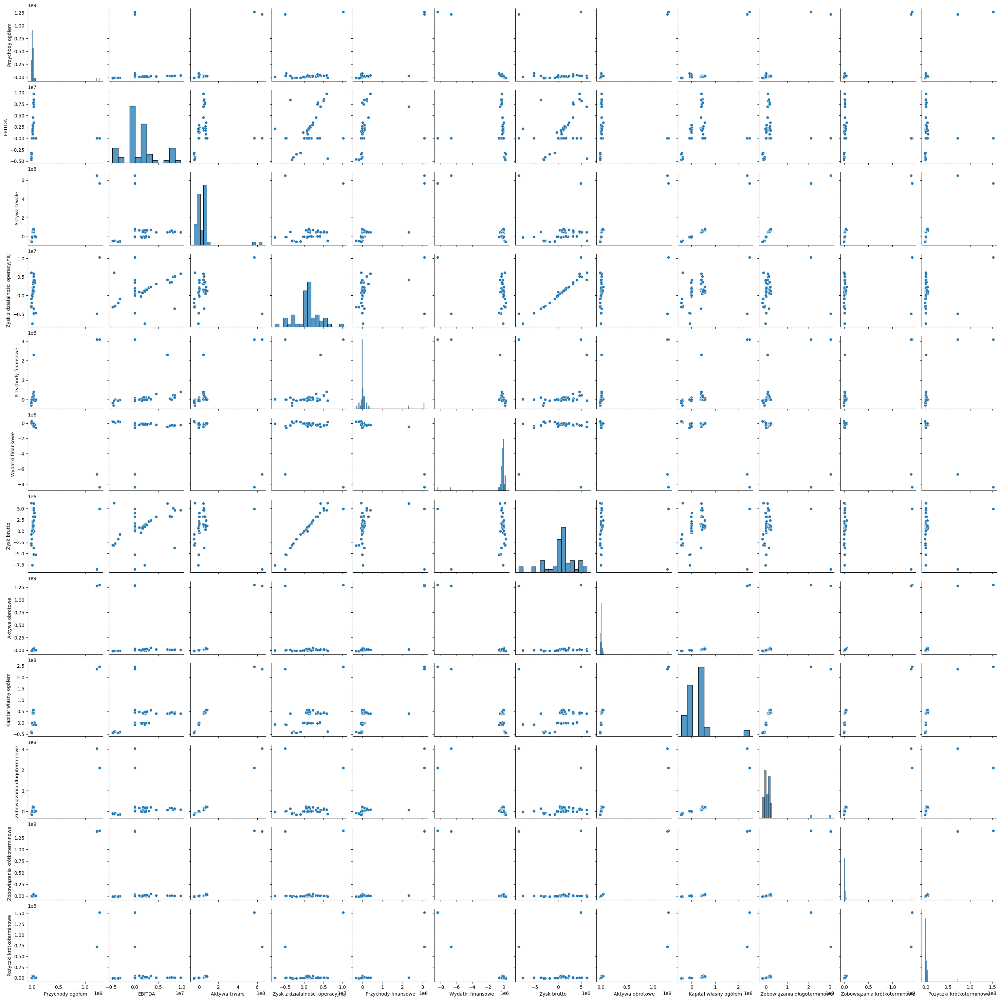

In [5]:
#Żadna ze zmiennych nie posiada wartości pustych. Jest to spowodowane tym, że jeżeli były jakieś braki danych w zbiorze
#Zdecydowałem je zastąpić średnią dla danego okresu, lub zostawić 0 jeżeli żaden z kwartałów nie miał danych
import warnings
warnings.filterwarnings("ignore")

#Zobaczmy sobie wykresy trzech dowolnych zmiennych wexmy na przykład Przychody ogółem, EBITDA oraz Aktywa trwałe. Sprawdźmy czy ich histogramy będą 
#przypominały rozkład normalny.

fig = plt.figure(figsize=(7,12))
pp = sns.pairplot(data[["Przychody ogółem", "EBITDA", "Aktywa trwałe", "Zysk z działalności operacyjnej", "Przychody finansowe", "Wydatki finansowe",
                  "Zysk brutto", "Aktywa obrotowe", "Kapitał własny ogółem", "Zobowiązania długoterminowe", "Zobowiązania krótkoterminowe", "Pożyczki krótkoterminowe"]])
#pp.savefig(f"pp_PGE.png")

In [26]:
def replace_outliers_with_mean(df, columns=None, threshold=3):
    """
    Identify outliers in the DataFrame using Z-score and replace them with the mean.

    Parameters:
    df : pandas DataFrame
        Input DataFrame.
    columns : list or None, optional
        List of columns to check for outliers. If None, all numeric columns will be checked. Default is None.
    threshold : float, optional
        Z-score threshold for identifying outliers. Default is 3.

    Returns:
    cleaned_df : pandas DataFrame
        DataFrame with outliers replaced by the mean.
    """
    # Select columns to check for outliers
    if columns is None:
        columns = df.select_dtypes(include=[np.number]).columns.tolist()

    # Create a copy of the DataFrame
    cleaned_df = df.copy()

    # Iterate over selected columns
    for column in columns:
        # Calculate Z-scores for each data point in the column
        z_scores = np.abs((df[column] - df[column].mean()) / df[column].std())

        # Find indices of outliers
        outlier_indices = z_scores > threshold

        # Replace outliers with the mean
        cleaned_df.loc[outlier_indices, column] = df[column].mean()

    return cleaned_df


data_ = replace_outliers_with_mean(data)


In [27]:
#Widać, że rozkłady tych zmiennych nie przypominają rozkłady Gaussowskie. Upewnijmy sie jeszcze wykonując test na tych zbiorach
#W celu sprawdzenia pochodzenia próby skorzystamy z testu Shapiro-Wilka z biblioteki scipy
data = data_

def ShaprioWilk(column):
    import scipy.stats as stats
    
    statistic, p_value = stats.shapiro(data[column].to_numpy())
    
    print("Statistic: ", statistic)
    print("P value: ", p_value)
    
    alpha = 0.05
    if p_value > alpha:
        return print(f"The data follow a normal distribution (p-value = {p_value:.4f})")
    else:
        return print(f"The data does not follows a normal distribution (p-value = {p_value:.4f})")




columns = list(data.columns)
columns.remove("Kwartał") #Dane jakosciowe
columns.remove("Indeks") #Nieistotne
columns.remove("Zysk brutto ze sprzedaży")
#columns.remove("Wynik finansowy (zysk / strata)")
columns.remove("Długoterminowe kredyty i pożyczki")
columns.remove("Rok")
columns.remove("Q")
for i in list(columns):
    print()
    print(i)
    print("-------------")
    ShaprioWilk(i)

    
#Zgodnie z wynikiem test próby nie pochodzą z rozkładu normalnego (Gaussa)

#Dla części kolumn policzenie testu było niemozliwe, sprawdźmy dlaczego i poprawmy dane tak, aby nie było żadnego problemu w dalszych krokach analizy


Przychody ogółem
-------------
Statistic:  0.9217094779014587
P value:  0.0021700174547731876
The data does not follows a normal distribution (p-value = 0.0022)

Zysk z działalności operacyjnej
-------------
Statistic:  0.9426261782646179
P value:  0.014338718727231026
The data does not follows a normal distribution (p-value = 0.0143)

EBITDA
-------------
Statistic:  0.8965847492218018
P value:  0.0002831455203704536
The data does not follows a normal distribution (p-value = 0.0003)

Przychody finansowe
-------------
Statistic:  0.8660963773727417
P value:  3.173246295773424e-05
The data does not follows a normal distribution (p-value = 0.0000)

Wydatki finansowe
-------------
Statistic:  0.9799942374229431
P value:  0.5255821943283081
The data follow a normal distribution (p-value = 0.5256)

Zysk brutto
-------------
Statistic:  0.9313821792602539
P value:  0.005078470334410667
The data does not follows a normal distribution (p-value = 0.0051)

Aktywa trwałe
-------------
Statistic:

C:\Users\kmate\AppData\Local\Temp\ipykernel_29240\2120783607.py:14: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  res.show()


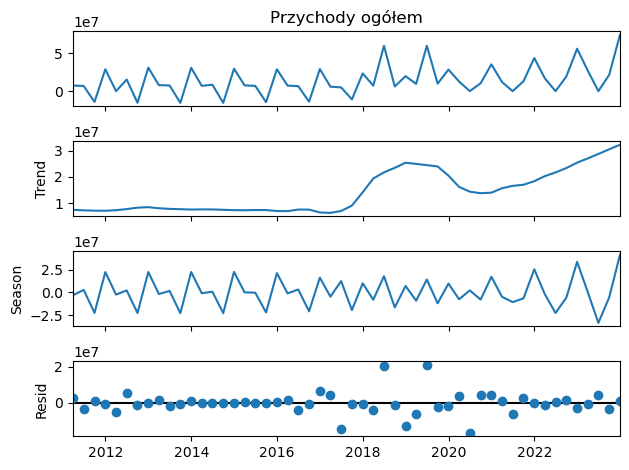

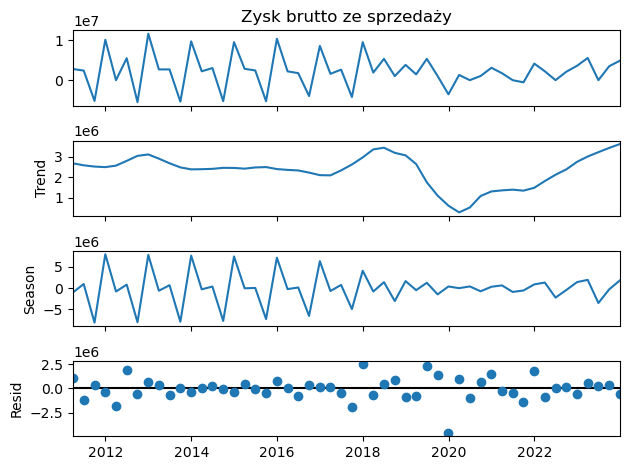

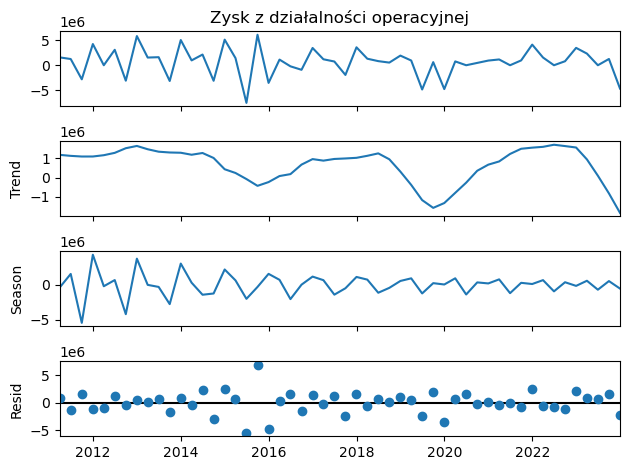

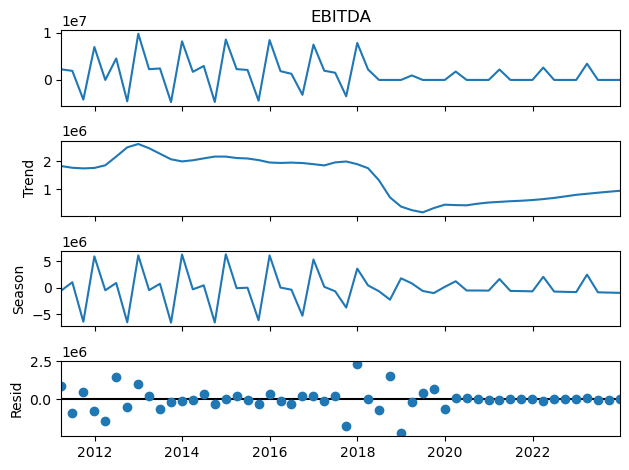

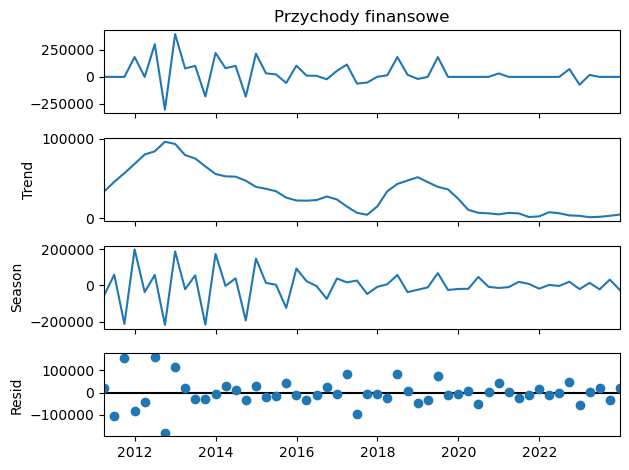

...

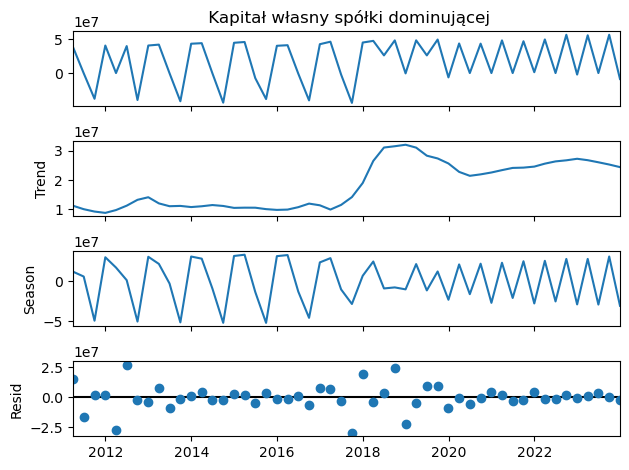

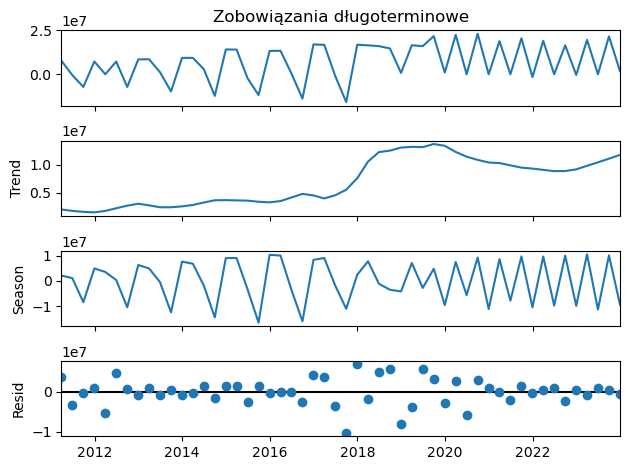

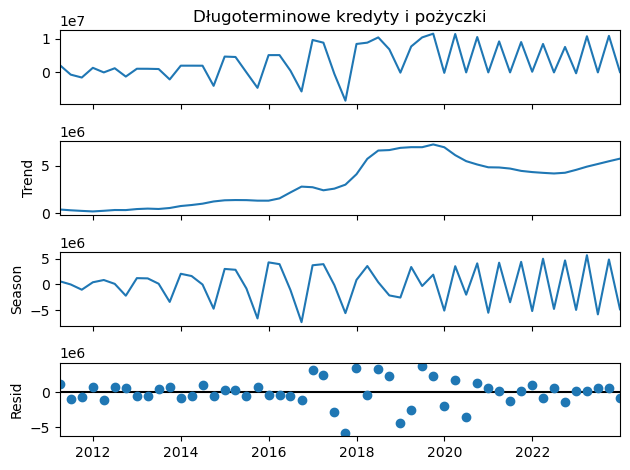

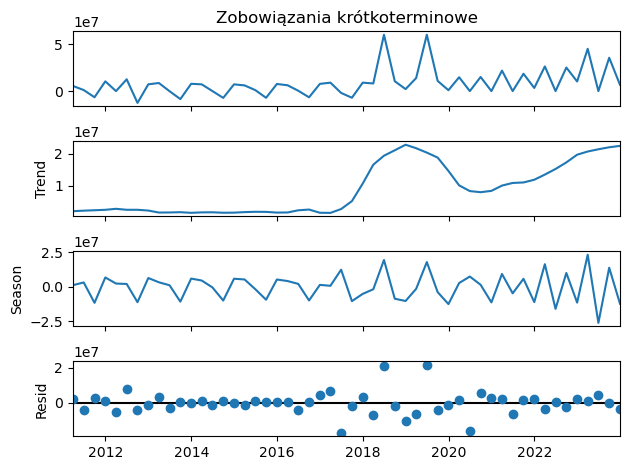

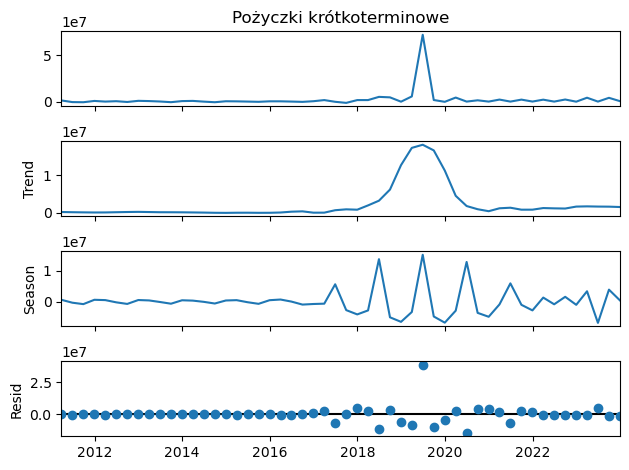

In [7]:
#Rozłózmy wszystkie szeregi na części pierwsze aby sprawdzić czy wystepuje sezonowość
temporary_ = data.copy()
temporary_ = data.drop(columns=["Indeks","Kwartał","Rok","Q"])

for i in list(temporary_.columns):
    
    from statsmodels.tsa.seasonal import STL
    
    season = data[f"{i}"]
    res = STL(endog=season, period=4).fit()
    res = res.plot()
    #res.savefig(f"{i}_PGE.png")
    
res.show()

In [19]:
#Ostatecznie po usunięciu zbędnych i wadliwych zmiennych zostało nam ich 12. Jest to wystarczająca liczba aby spróbować wytrenować
# czy dopasować model do tego szeregu. Sprawdźmy teraz jak wygladają te szeregi, czy są stacjonarne, czy wystepuje autokorelacja.
#W pierwszym kroku sprawidzmy działanie regresji liniowej. Następnie wypróbujemy model SARIMAX.
#Po dopasowaniu klasycznych metod ekonometrycznych sprawdzimy efektywność modeli uczenia maszynowego (Random Forest, XGB), a juz na sam koniec zobaczymy
#jak z prognozami radzą sobie sieci neuronowe.

#Z racji, że mam dostęp do wielu zmiennych pozwole sobie na możliwość edycji powyższych planów i czasa

In [ ]:
#Autoregresja

In [28]:
#Sprawdzam stacjonarnosć każdej ze zmiennych

import pandas as pd
from statsmodels.tsa.stattools import adfuller


def adf_test(timeseries):
    # Perform Dickey-Fuller test
    result = adfuller(timeseries)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')
    if result[1] > 0.05:
        print("Time series is not stationary")
    else:
        print("Time series is stationary")


for i in list(columns):
    print()
    print(i)
    print("-------------")
    adf_test(data[i])



#Żaden z szeregów nie jest stacjonarny według testu ADF, potwierdźmy to testem KPSS


Przychody ogółem
-------------
ADF Statistic: -0.6844495208425178
p-value: 0.8507364505592732
Critical Values:
	1%: -3.5745892596209488
	5%: -2.9239543084490744
	10%: -2.6000391840277777
Time series is not stationary

Zysk z działalności operacyjnej
-------------
ADF Statistic: -10.570206309523872
p-value: 7.338571592674411e-19
Critical Values:
	1%: -3.5656240522121956
	5%: -2.920142229157715
	10%: -2.598014675124952
Time series is stationary

EBITDA
-------------
ADF Statistic: -1.1358453236965214
p-value: 0.7005676483660324
Critical Values:
	1%: -3.5778480370438146
	5%: -2.925338105429433
	10%: -2.6007735310095064
Time series is not stationary

Przychody finansowe
-------------
ADF Statistic: -2.726597966182157
p-value: 0.06954766090588207
Critical Values:
	1%: -3.5745892596209488
	5%: -2.9239543084490744
	10%: -2.6000391840277777
Time series is not stationary

Wydatki finansowe
-------------
ADF Statistic: -1.84276618398618
p-value: 0.3594455366308902
Critical Values:
	1%: -3.57458

In [29]:
import pandas as pd
from statsmodels.tsa.stattools import kpss
import warnings
warnings.filterwarnings("ignore")

def kpss_test(timeseries):
    # Perform KPSS test
    result = kpss(timeseries)
    print('KPSS Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[3].items():
        print(f'\t{key}: {value}')
    if result[1] > 0.05:
        print("Time series is stationary")
    else:
        print("Time series is not stationary")


for i in list(columns):
    print()
    print(i)
    print("-------------")
    kpss_test(data[i])


#Obydwa testy wykazały brak stacjoanrności zmiennych, zróżnicujmy je i sprawdzmy założenie jeszcze raz


Przychody ogółem
-------------
KPSS Statistic: 0.8339841819557448
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is not stationary

Zysk z działalności operacyjnej
-------------
KPSS Statistic: 0.10515807030230694
p-value: 0.1
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

EBITDA
-------------
KPSS Statistic: 0.4631106068124501
p-value: 0.04997508855575449
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is not stationary

Przychody finansowe
-------------
KPSS Statistic: 0.3886531785539433
p-value: 0.08204604372674856
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

Wydatki finansowe
-------------
KPSS Statistic: 0.29828464896074275
p-value: 0.1
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

Zysk brutto
-------------
KPSS Statistic: 0.12830012796857493
p-value: 0.1
Critical Values:
	10%:

In [30]:
#Zróżnicowany dataframe
import warnings
warnings.filterwarnings("ignore")

mol = data.drop(columns=["Kwartał", "Indeks", "Zysk brutto ze sprzedaży", "Długoterminowe kredyty i pożyczki",  "Rok", "Q"])
mol_diff = mol.diff()
mol_diff = mol_diff.dropna()

#Sprawdzmy stacjonarnosc

#ADF i KPSS
for i in list(columns):
    print()
    print(i)
    print("-------------")
    adf_test(mol_diff[i])
    kpss_test(mol_diff[i])



#Po róznicowaniu wszystkie szeregi wykazują stacjoanrnosć będąc badanym zarówno testem ADF jak i KPSS,
#Teraz przejdę do badania stopnia autokorelacji


Przychody ogółem
-------------
ADF Statistic: -16.457566162958248
p-value: 2.346657143411792e-29
Critical Values:
	1%: -3.5745892596209488
	5%: -2.9239543084490744
	10%: -2.6000391840277777
Time series is stationary
KPSS Statistic: 0.16608296199830325
p-value: 0.1
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

Zysk z działalności operacyjnej
-------------
ADF Statistic: -6.348948304998822
p-value: 2.640004631661038e-08
Critical Values:
	1%: -3.5778480370438146
	5%: -2.925338105429433
	10%: -2.6007735310095064
Time series is stationary
KPSS Statistic: 0.08345813939417487
p-value: 0.1
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

EBITDA
-------------
ADF Statistic: -8.26916217106102
p-value: 4.84573285668358e-13
Critical Values:
	1%: -3.5778480370438146
	5%: -2.925338105429433
	10%: -2.6007735310095064
Time series is stationary
KPSS Statistic: 0.021600111918862196
p-value: 0.1
Critical Values:
	10%:

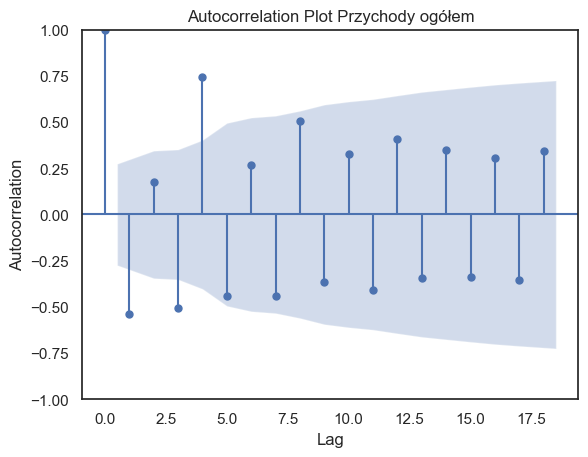

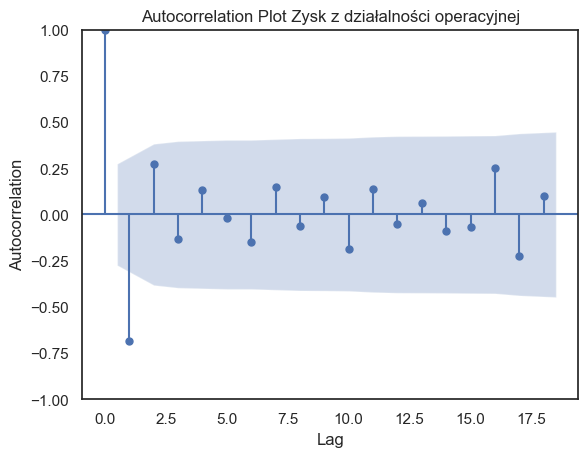

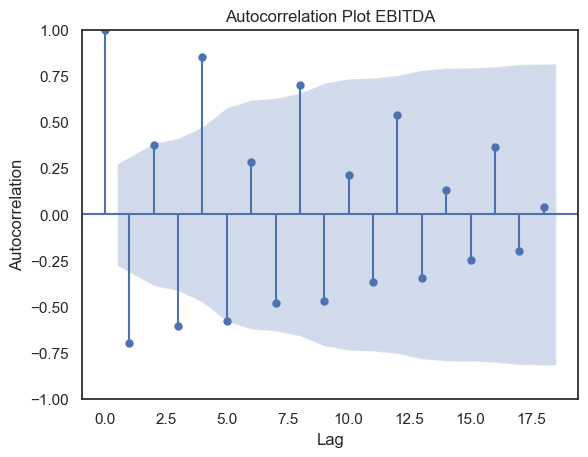

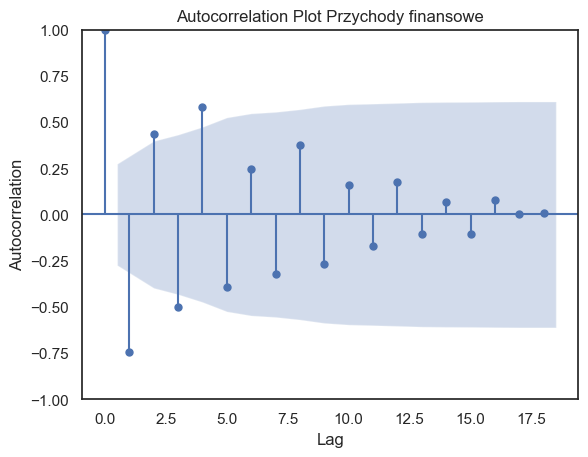

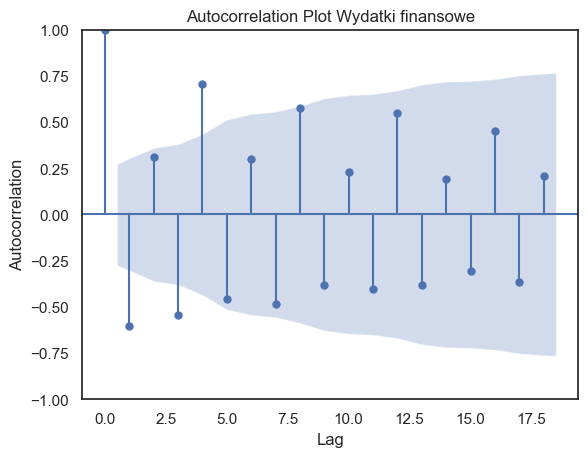

...

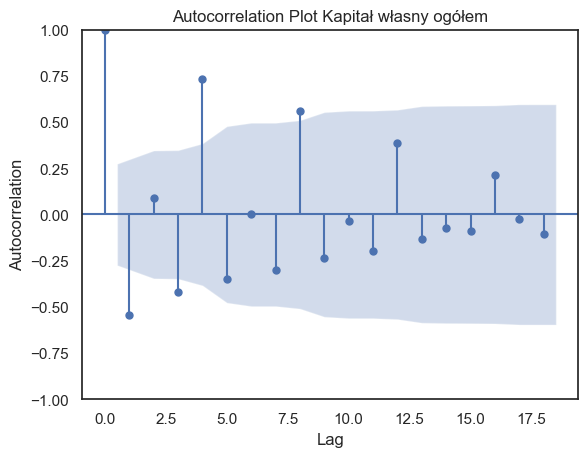

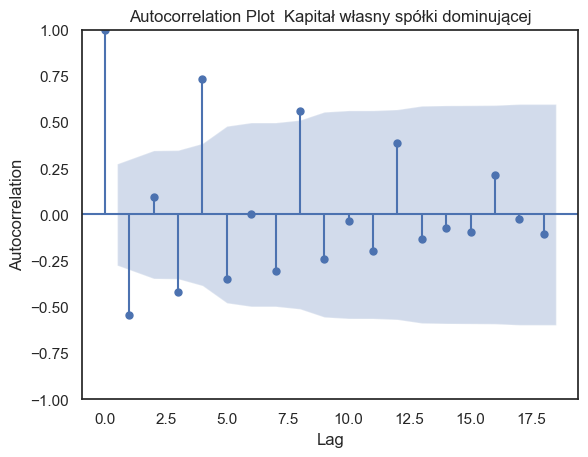

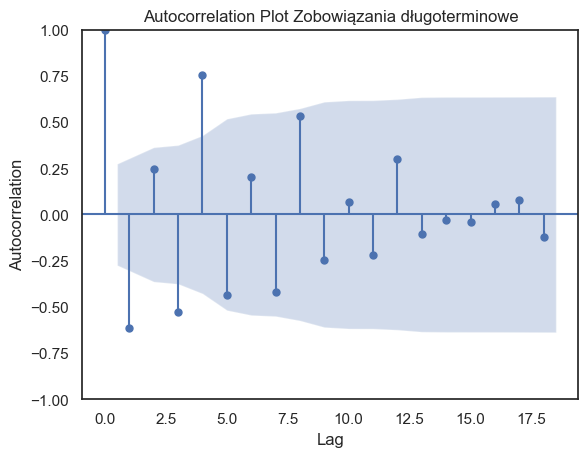

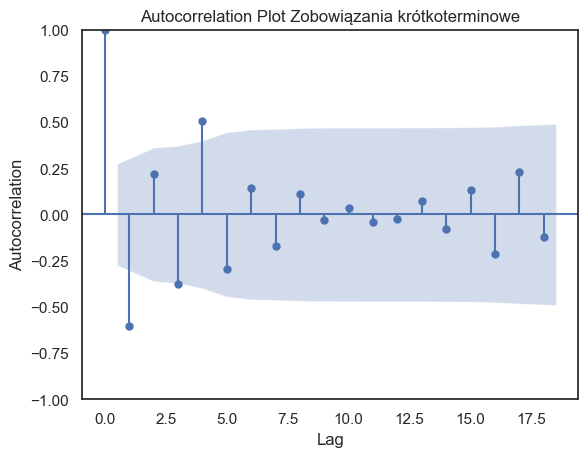

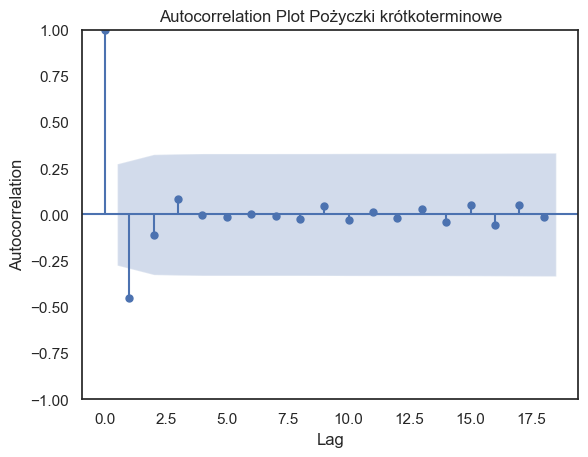

In [31]:
#Sprawdzam autokorelacje każdej ze zmiennych
import warnings
warnings.filterwarnings("ignore")


#ACF
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf


for i in list(columns):
    acf = plot_acf(mol_diff[i])
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation Plot {i}')
    #acf.savefig(f"{i}_acf_PGE.png")


    
plt.show()



#Zróbmy liste opóźnien dla każdej ze zmiennych:

#Przychody ogółem: 1,3,5,7,9,11,13,15,17
#Zysk z działalności operacyjnej: 1,3,5,7,9,11,13,15,17
#EBITDA: 1,3,5,7,9,11,13,15,17
#Przychody finansowe: 1,2,3
#Wydatki finansowe: 1,2,3,7,11
#Zysk brutto: 1,3,5
#Aktywa trwałe: 1,5,8
#Aktywa obrotowe: 1,5
#Kapitał własny ogółem: 1,2,3,4,5
#Zobowiązania długoterminowe: 1
#Zobowiązania krótkoterminowe:1
#Pożyczki krótkoterminowe: 1

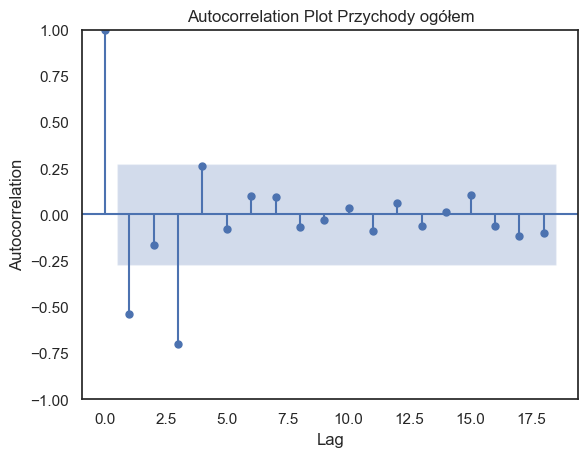

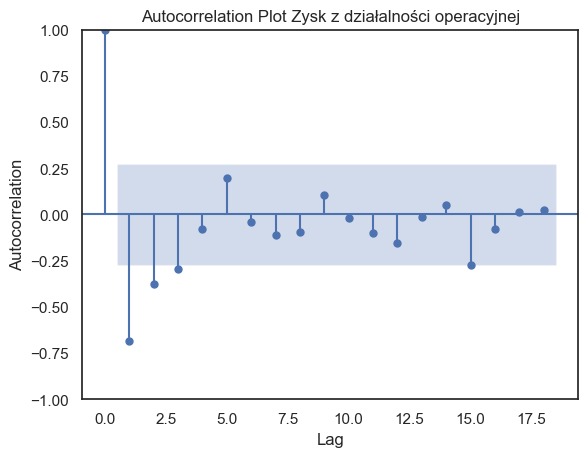

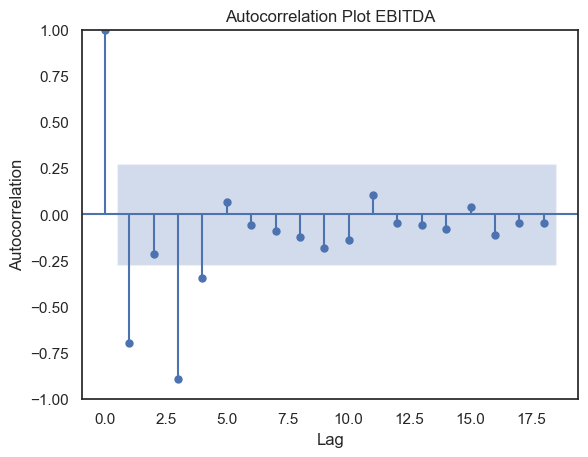

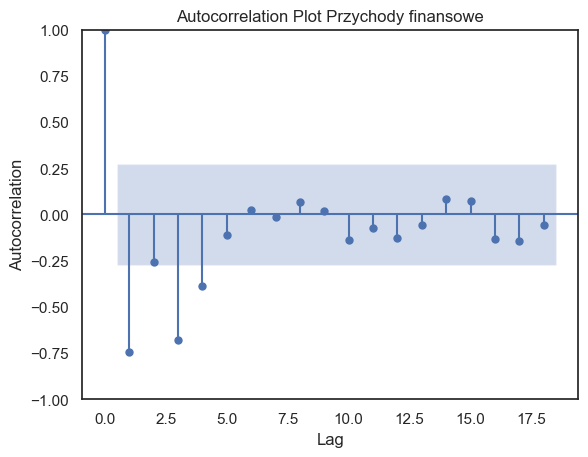

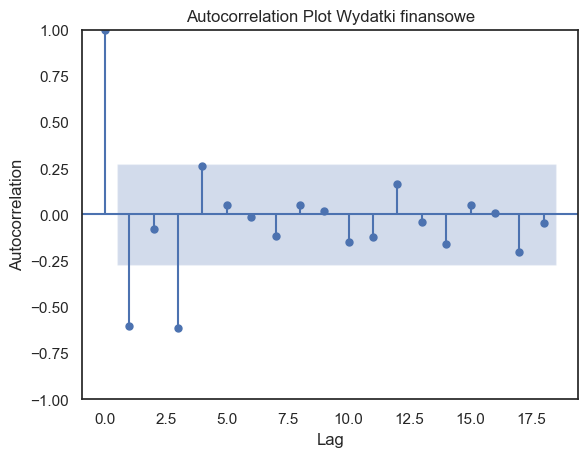

...

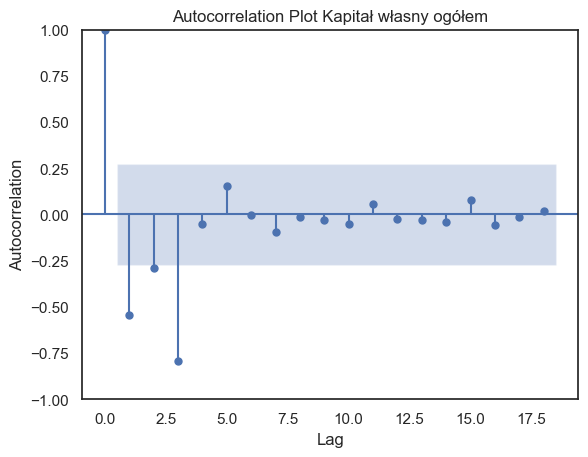

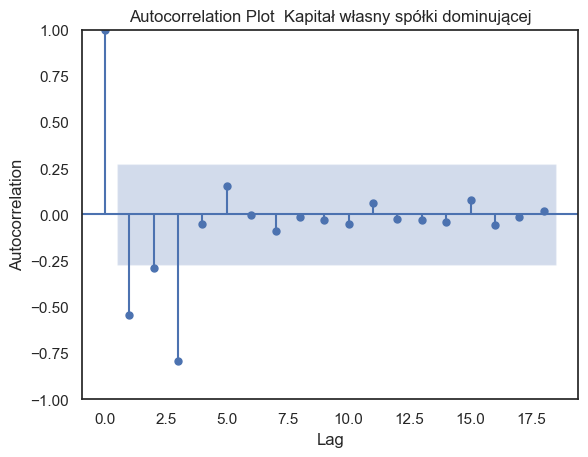

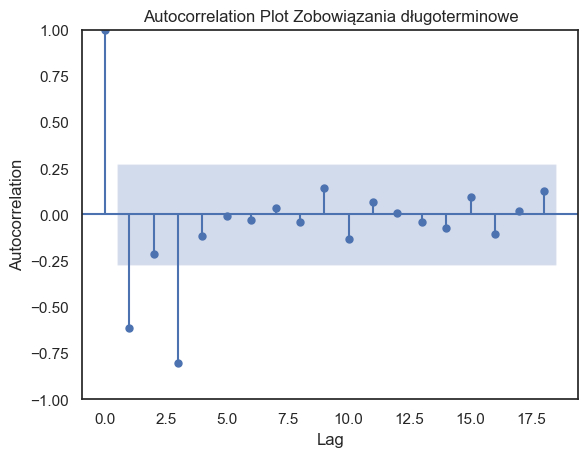

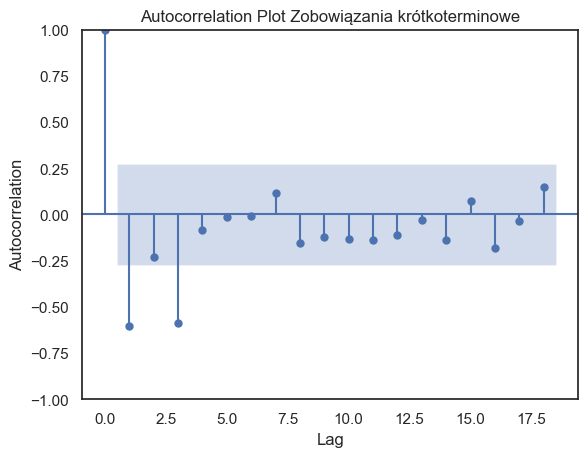

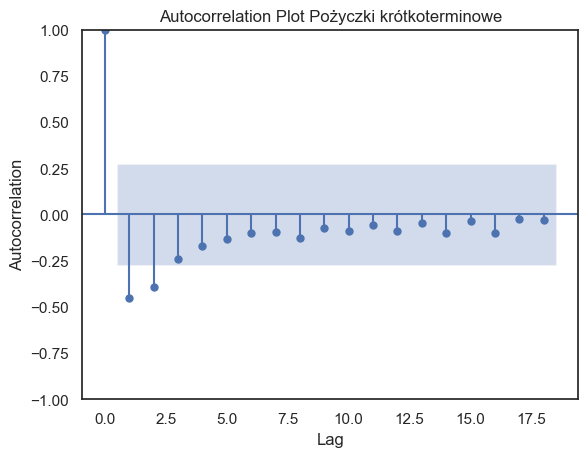

In [32]:
#PACF
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf


for i in list(columns):
    pacf = plot_pacf(mol_diff[i])
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation Plot {i}')
    pacf.savefig(f"{i}_pacf_PGE.png")

    
plt.show()

#Zróbmy liste opóźnien dla każdej ze zmiennych:

#Przychody ogółem: 4
#Zysk z działalności operacyjnej: 2,3
#EBITDA: 2,3
#Przychody finansowe: 1
#Wydatki finansowe: 1,3
#Zysk brutto: 1,3,4
#Aktywa trwałe: 2
#Aktywa obrotowe: 1
#Kapitał własny ogółem: 1
#Zobowiązania długoterminowe: 1,2
#Zobowiązania krótkoterminowe:1
#Pożyczki krótkoterminowe: 1,2,3,5

<Axes: >

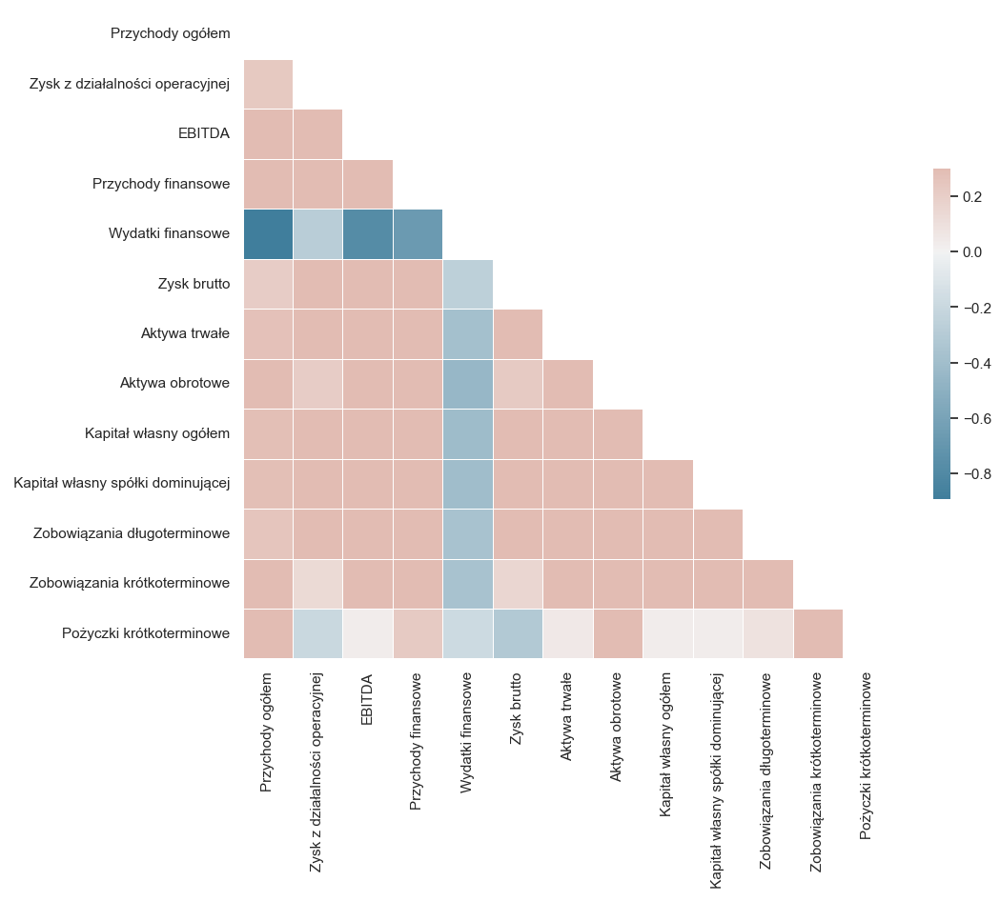

In [33]:
#Correlation
corr = mol_diff.corr()

from string import ascii_letters
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="white")

# Generate a large random dataset
rs = np.random.RandomState(33)

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 27, May, 2024
Time:                     23:23:55
---------------------------------------------------------------------
No. of Equations:         13.0000    BIC:                    -399.095
Nobs:                     21.0000    HQIC:                   -419.346
Log likelihood:           4594.70    FPE:               -3.31336e-200
AIC:                     -424.959    Det(Omega_mle):    -3.16105e-206
---------------------------------------------------------------------
Results for equation Przychody ogółem
                                           coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------------------------
const                                        -0.000057              NAN              NAN             NAN
L1.Przychody ogółem                          -0.0734

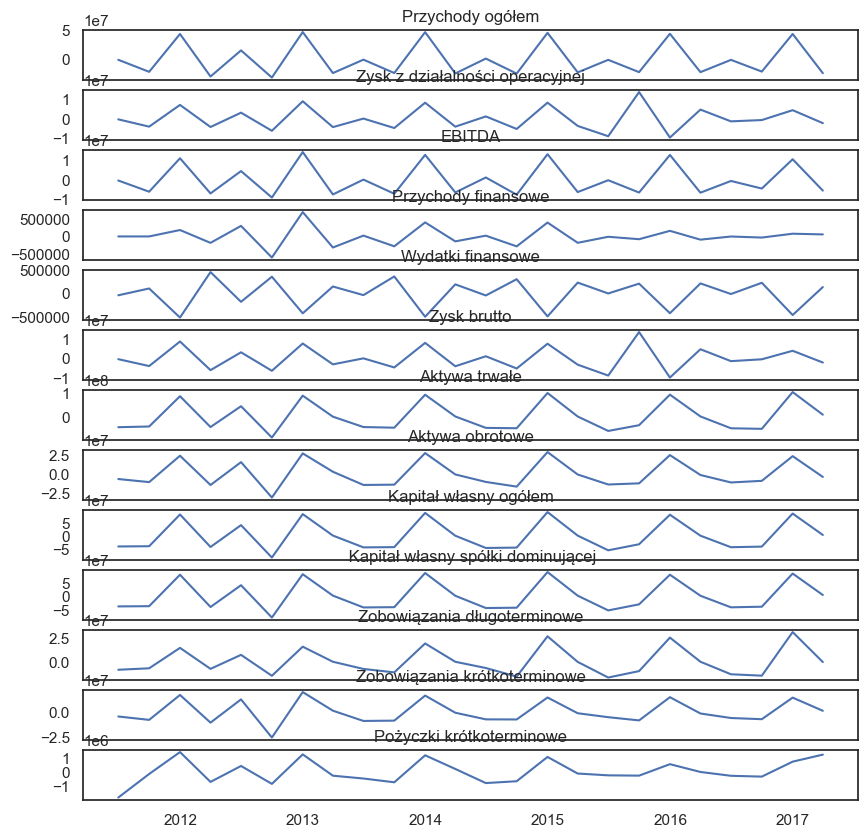

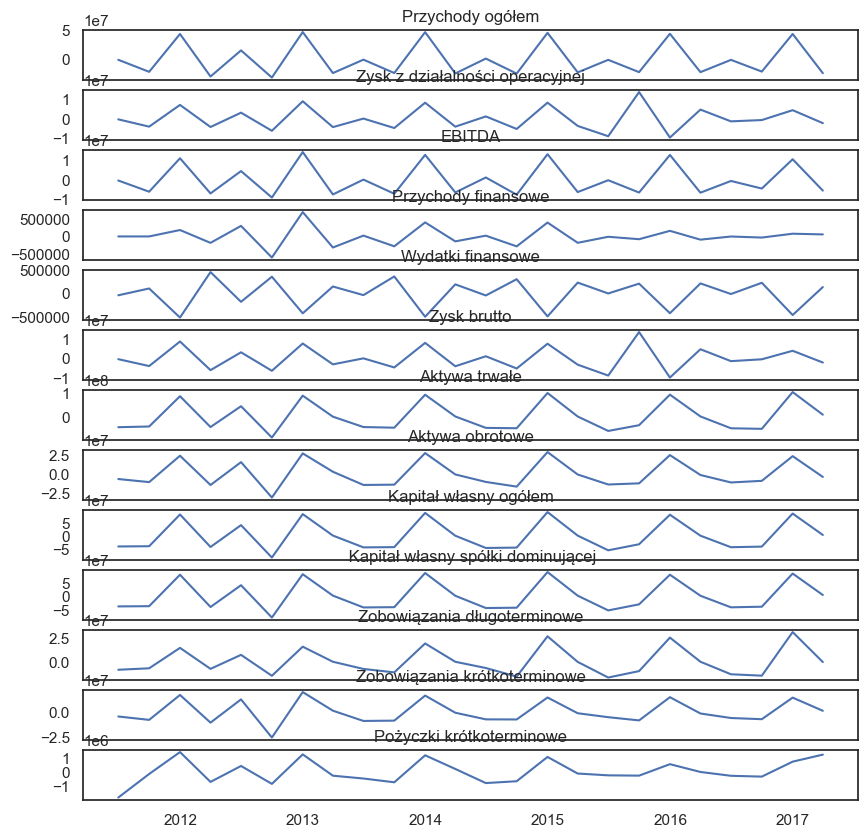

In [34]:
#VAR

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
from statsmodels.tsa.api import VAR
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tools.eval_measures import rmse


#Dziele zbiór danych za część treningową i testową
train = mol_diff[:24]
test = mol_diff[25:]

#Dopasujmy model VAR i wybierzmy ten, który ma najlepszy AIC 

model = VAR(train)
results = model.fit(maxlags=3)

#Sprawdzam podsumowanie
print(results.summary())

results.plot()

Przychody ogółem


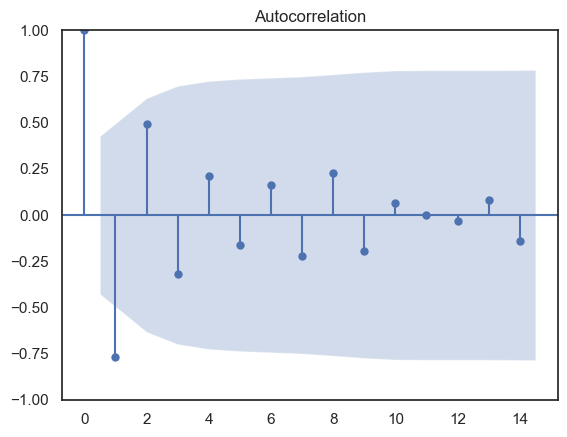

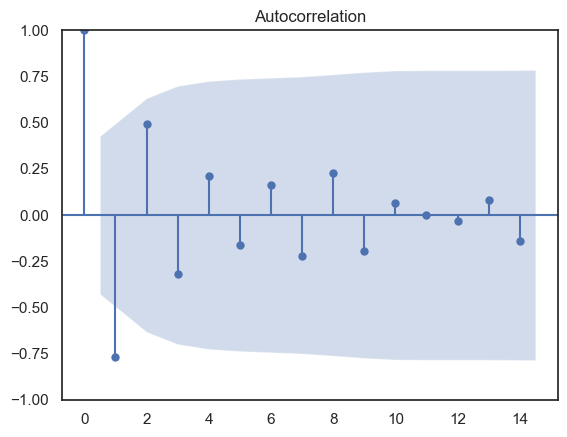

Zysk z działalności operacyjnej


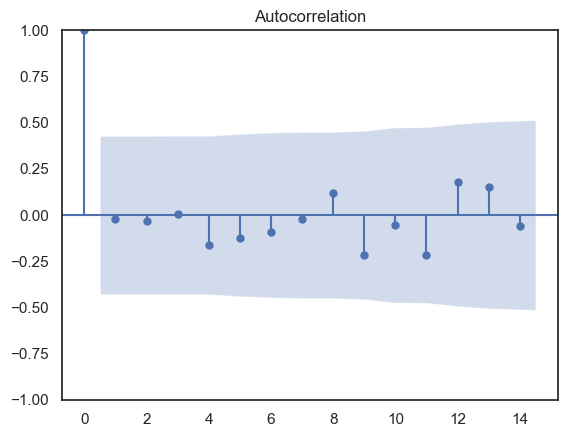

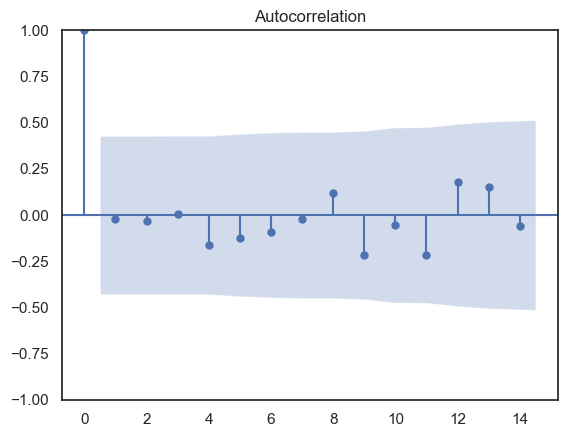

EBITDA


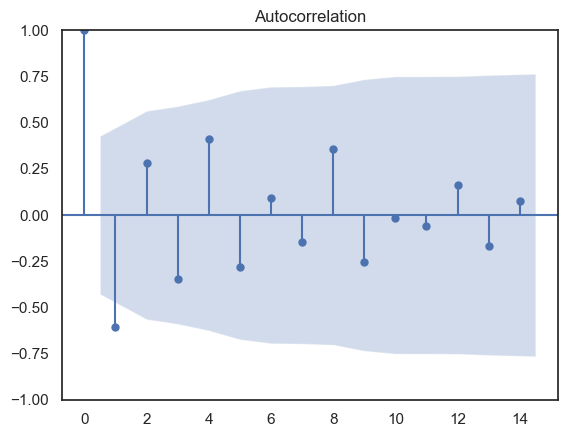

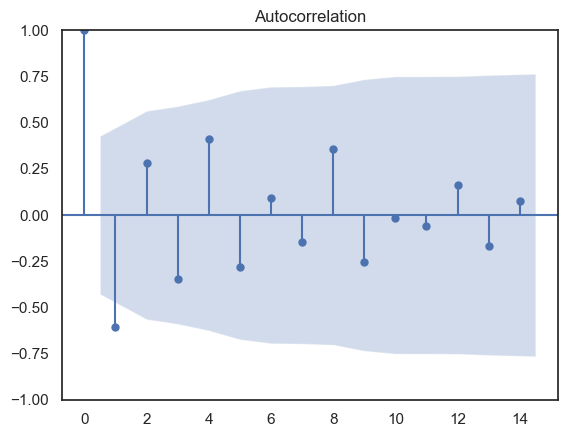

Przychody finansowe


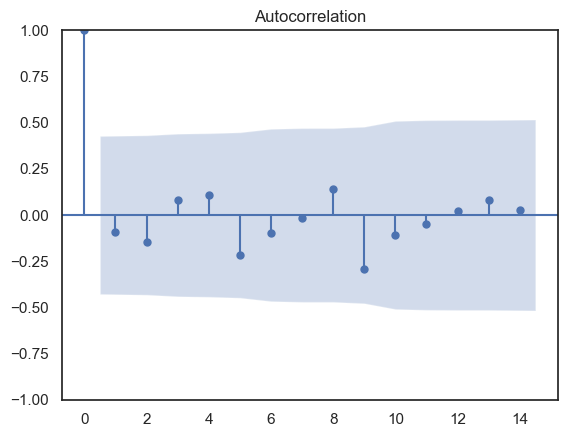

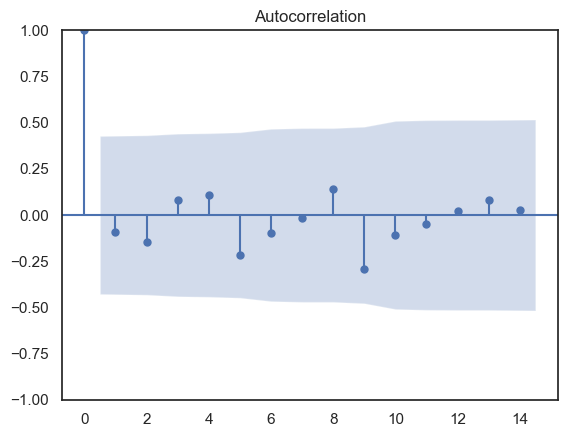

Wydatki finansowe


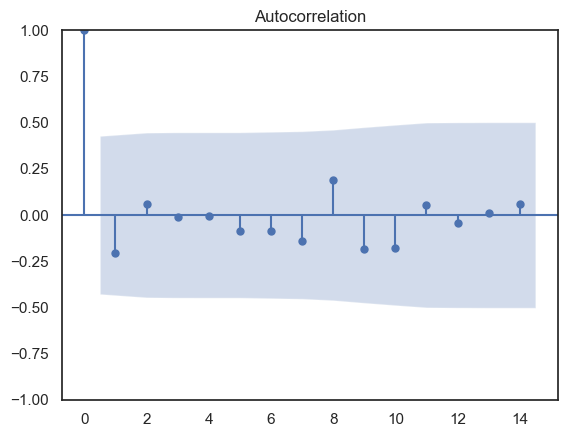

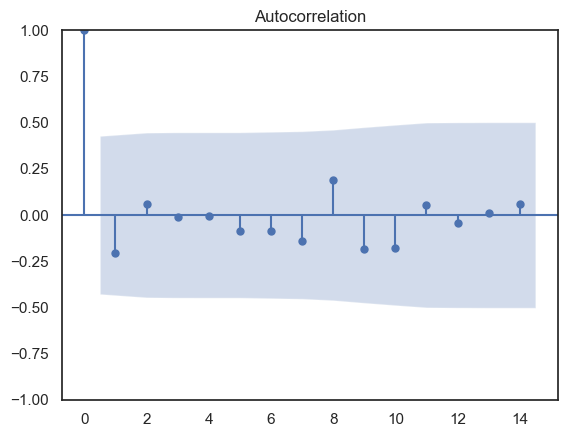

Zysk brutto


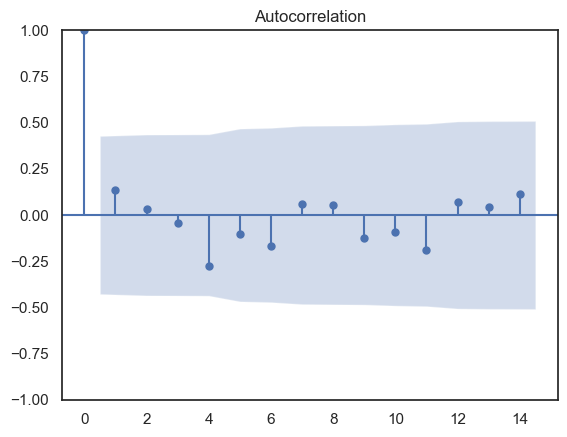

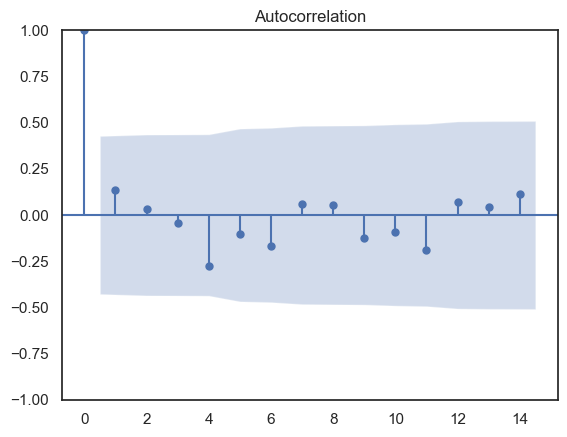

Aktywa trwałe


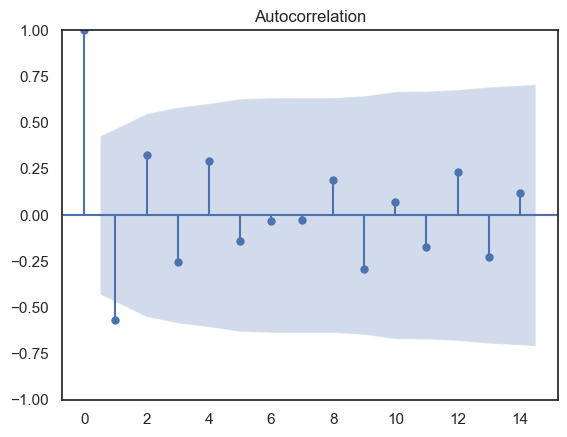

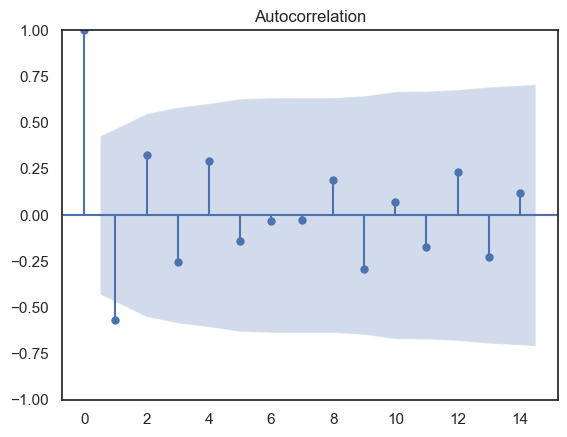

Aktywa obrotowe


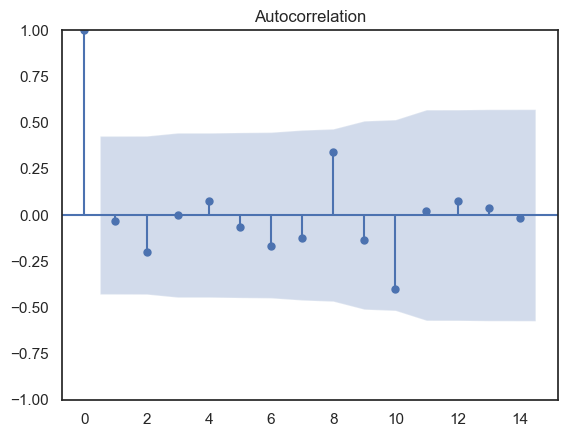

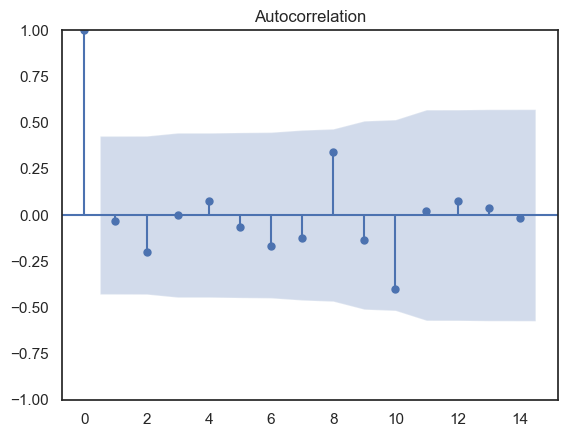

Kapitał własny ogółem


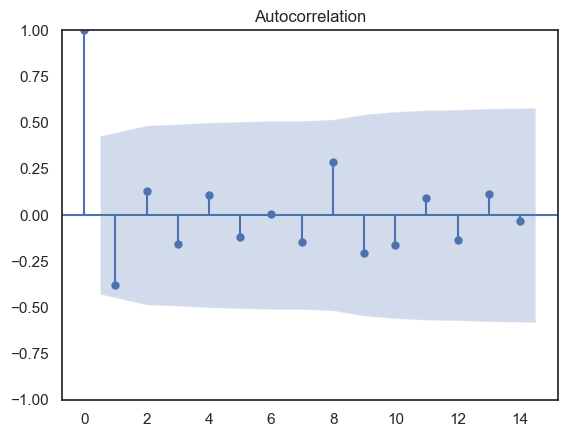

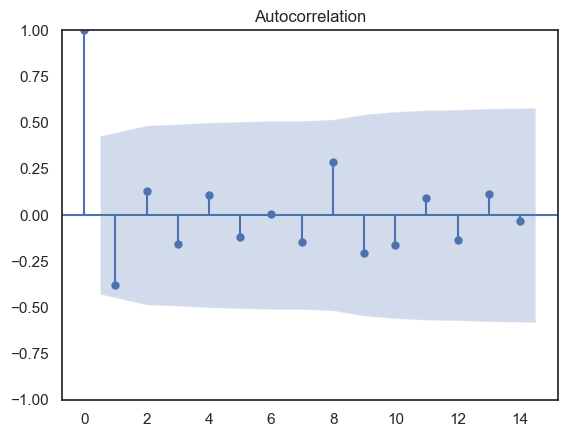

 Kapitał własny spółki dominującej


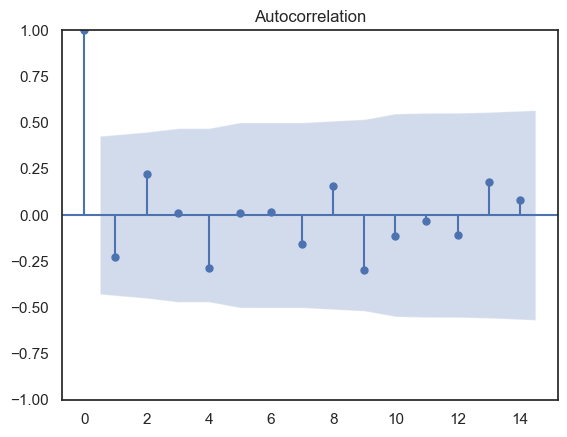

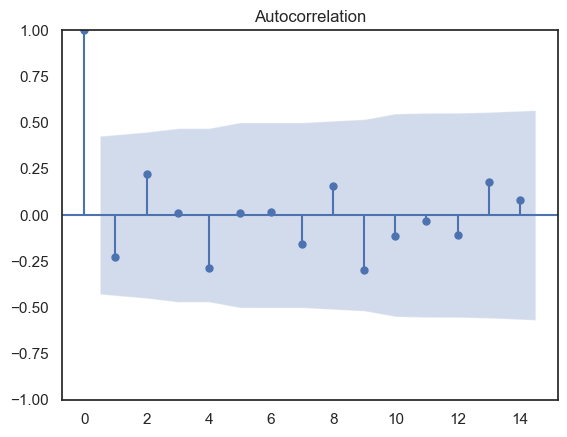

Zobowiązania długoterminowe


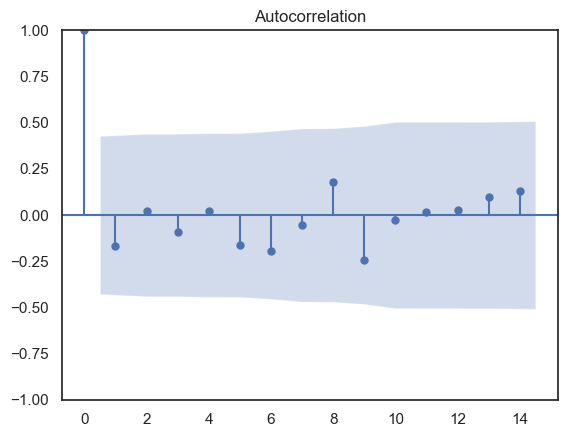

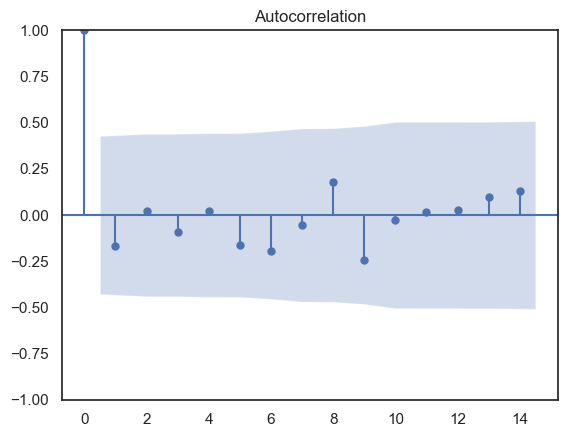

Zobowiązania krótkoterminowe


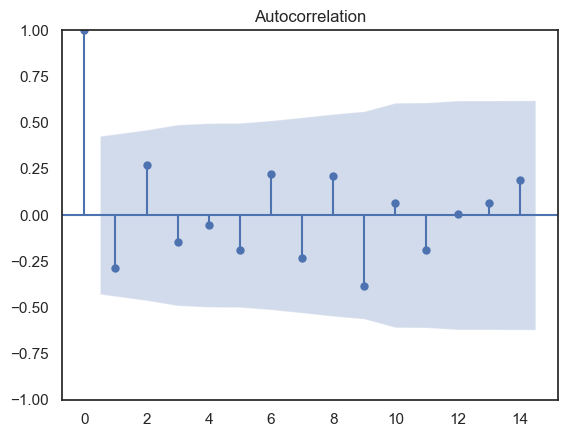

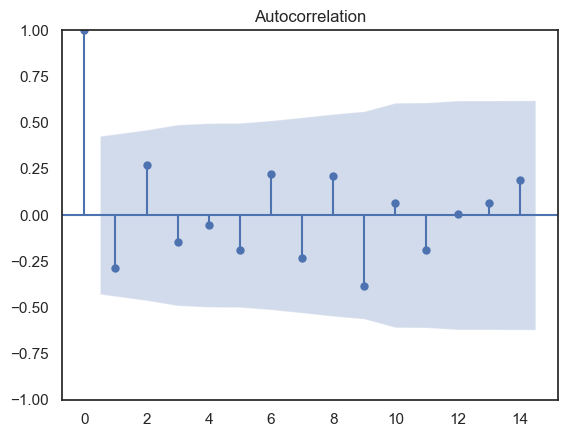

Pożyczki krótkoterminowe


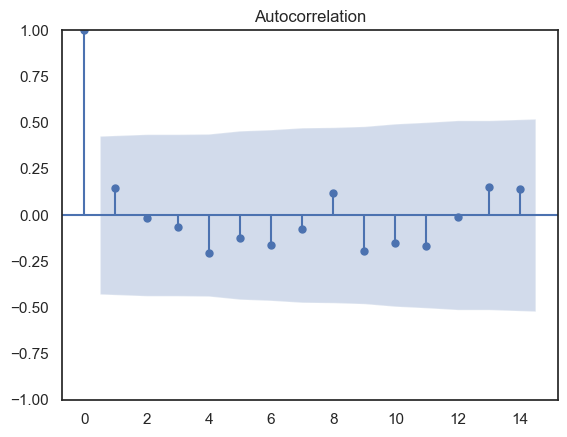

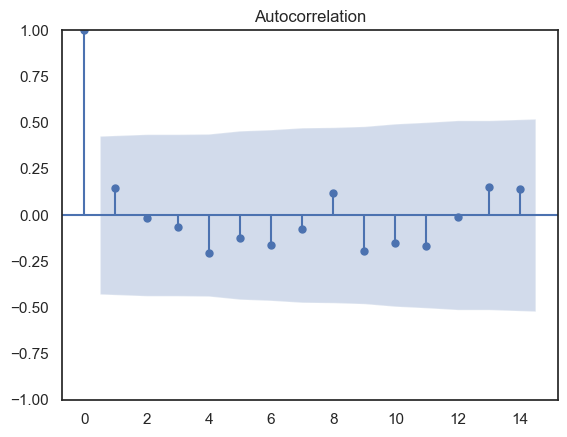

In [16]:
#Sprawdzmy czy reszty modelu wykazują autokroelacje

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


for i in list(results.resid.columns):
# Plot ACF and PACF of residuals
    print(f"{i}")
    plot_acf(results.resid[f"{i}"])
    plot_acf(results.resid[f"{i}"])
    plt.show()


#Na podstawie poniższych wykresów mozna stwierdzić, że nie występuje autokorelacja reszt, a zatem wszystkie zleżności liniowe zostały wyjąsnione

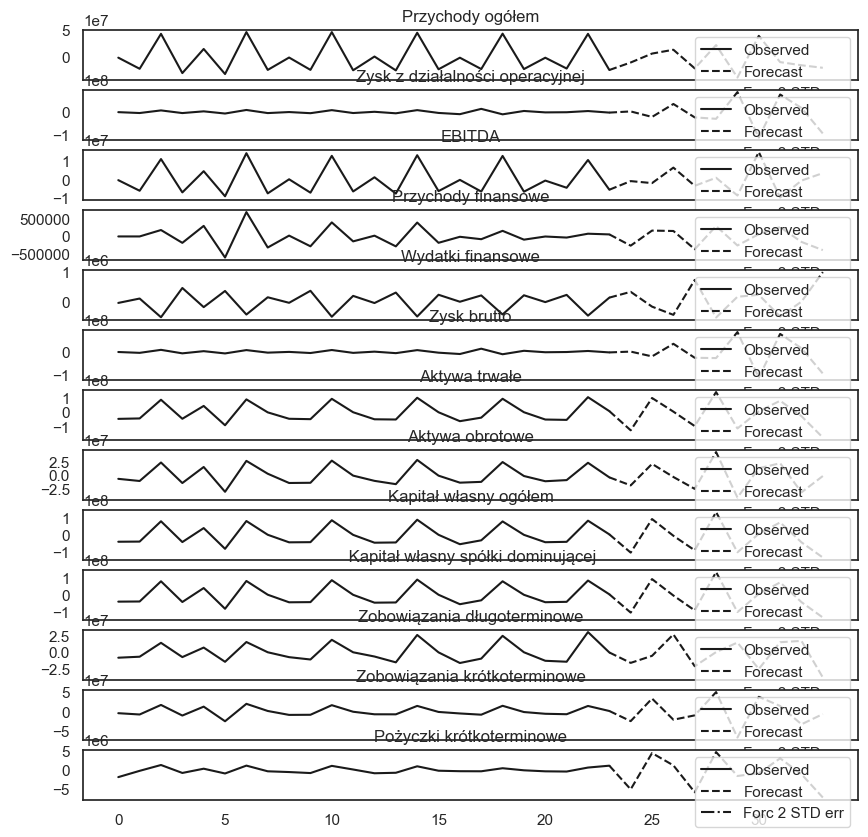

In [35]:
#Prognozy in sample

lag_order = results.k_ar
forc = results.forecast(train.values[-lag_order:], 5)
results.plot_forecast(10)

columns = list(train.columns)
index = [62,63,64,65,66]

forecast = pd.DataFrame(data = forc)
forecast.columns = train.columns
forecast.index = index
test_5 = test[:5]

In [36]:
# Make predictions on the test data
forecast = results.forecast(results.endog, steps=len(test))

# Convert the forecast array to a DataFrame for easier manipulation
forecast_df = pd.DataFrame(forecast, index=test.index, columns=test.columns)

# Calculate residuals
residuals = test - forecast_df

# Calculate RMSE for each variable
rmse_values = rmse(test, residuals, axis=0)

# Calculate PMSE for each variable
pmse_values = (residuals ** 2).mean()

# Print RMSE and PMSE for each variable
print("RMSE:")
print(rmse_values)
print("\nPMSE:")
print(pmse_values)

def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


for i in list(test.columns):
    print(f"{i} ", round(mean_absolute_percentage_error(test[f"{i}"],forecast_df[f"{i}"]),2),"%")


#Oceniając model na podstawie błędów prognoz można stwierdzić, że model słabo stawia prognozy,
#ponieważ odchylenia wartości rzeczywistych od modelowych są bardzo duże


RMSE:
[2.33858287e+08 4.42140313e+08 3.17365464e+07 4.37474727e+06
 7.31688808e+06 4.49765312e+08 1.84630223e+09 3.24622715e+08
 1.57265052e+09 1.56000181e+09 2.28401416e+08 4.30134296e+08
 8.11542607e+07]

PMSE:
Przychody ogółem                      5.250279e+16
Zysk z działalności operacyjnej       1.954580e+17
EBITDA                                1.030792e+15
Przychody finansowe                   1.912428e+13
Wydatki finansowe                     5.262773e+13
Zysk brutto                           2.022409e+17
Aktywa trwałe                         3.448695e+18
Aktywa obrotowe                       1.062367e+17
Kapitał własny ogółem                 2.495818e+18
 Kapitał własny spółki dominującej    2.456148e+18
Zobowiązania długoterminowe           5.311753e+16
Zobowiązania krótkoterminowe          1.871429e+17
Pożyczki krótkoterminowe              7.035208e+15
dtype: float64
Przychody ogółem  582.0 %
Zysk z działalności operacyjnej  19848.67 %
EBITDA  inf %
Przychody finansowe  inf 

In [37]:
#Random Forest

random_forest_mol = data

#Dostosowanie danych
#random_forest_mol['Rok'] = random_forest_mol['Kwartał'].str[-4:]  # Extract last 4 characters as year
#random_forest_mol['Q'] = random_forest_mol['Kwartał'].str[1:2]  # Extract 2nd character as quarter
#random_forest_mol['Q'] = pd.to_numeric(random_forest_mol['Kwartał'], errors='coerce').fillna(0).astype(int)
#random_forest_mol = random_forest_mol["Rok"].astype(int)

random_forest_mol = random_forest_mol.drop(columns=["Zysk brutto ze sprzedaży", "Indeks", "Kwartał", "Długoterminowe kredyty i pożyczki", "Q", "Rok"])
random_forest_mol.info()

<class 'pandas.core.frame.DataFrame'>
Index: 52 entries, 2011-03-31 to 2023-12-31
Data columns (total 13 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Przychody ogółem                    52 non-null     float64
 1   Zysk z działalności operacyjnej     52 non-null     float64
 2   EBITDA                              52 non-null     float64
 3   Przychody finansowe                 52 non-null     float64
 4   Wydatki finansowe                   52 non-null     float64
 5   Zysk brutto                         52 non-null     float64
 6   Aktywa trwałe                       52 non-null     float64
 7   Aktywa obrotowe                     52 non-null     float64
 8   Kapitał własny ogółem               52 non-null     float64
 9    Kapitał własny spółki dominującej  52 non-null     float64
 10  Zobowiązania długoterminowe         52 non-null     float64
 11  Zobowiązania krótkoterminowe       

In [20]:
#Ustalmy benchmark do którego będziemy mogli póxniej odnieść nasz model.
#Do tego wykorzystam model ARIMA, ponieważ mam już gotowe dane i sprawdzone założenia, pozostało je tylko dopasować
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

#Na podstawie wczesniej przeprowadzonych testów 

train_t = train["Przychody ogółem"]
model = SARIMAX(train_t, order=(3, 1, 2), seasonal_order=(1, 0, 0, 4))
results = model.fit()

# Wyświetlenie podsumowania modelu
print(results.summary())

                                     SARIMAX Results                                      
Dep. Variable:                   Przychody ogółem   No. Observations:                   24
Model:             SARIMAX(3, 1, 2)x(1, 0, [], 4)   Log Likelihood                -413.435
Date:                            Mon, 27 May 2024   AIC                            840.869
Time:                                    20:21:30   BIC                            848.818
Sample:                                06-30-2011   HQIC                           842.868
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0098      0.047    -21.493      0.000      -1.102      -0.918
ar.L2         -0.0829      0.040   

                                     SARIMAX Results                                      
Dep. Variable:                   Przychody ogółem   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -465.692
Date:                            Mon, 27 May 2024   AIC                            947.383
Time:                                    20:22:54   BIC                            956.808
Sample:                                06-30-2011   HQIC                           949.884
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -2.3721      0.018   -135.075      0.000      -2.407      -2.338
ar.L2         -2.3659      0.023   

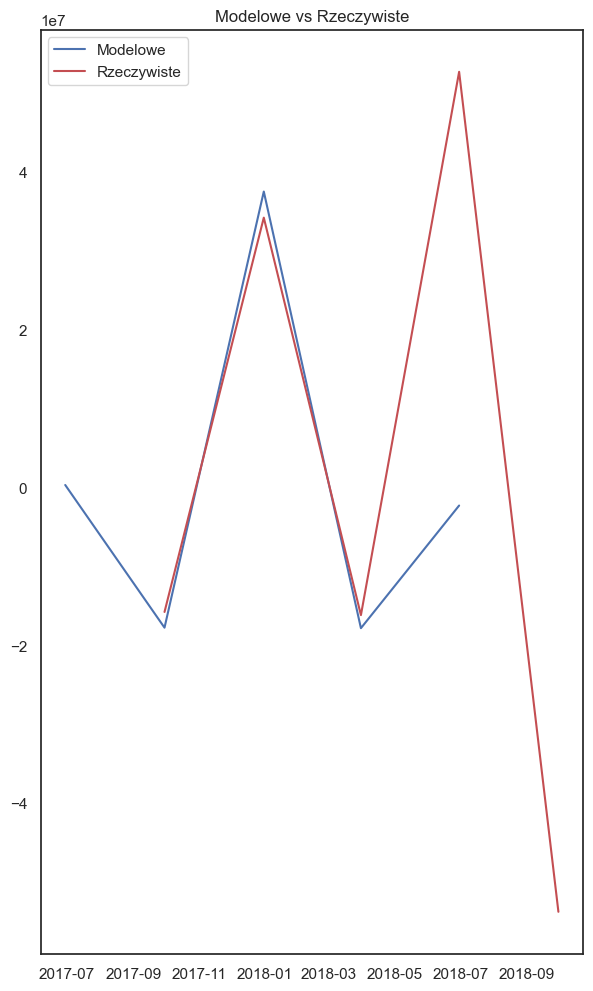

Błąd średniokwadratowy (MSE):  2691690372248400.0
MAPE:  163.13 %
                                      SARIMAX Results                                      
Dep. Variable:     Zysk z działalności operacyjnej   No. Observations:                   24
Model:              SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -388.922
Date:                             Mon, 27 May 2024   AIC                            793.844
Time:                                     20:22:55   BIC                            803.268
Sample:                                 06-30-2011   HQIC                           796.344
                                      - 03-31-2017                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7285      1.928     -0.

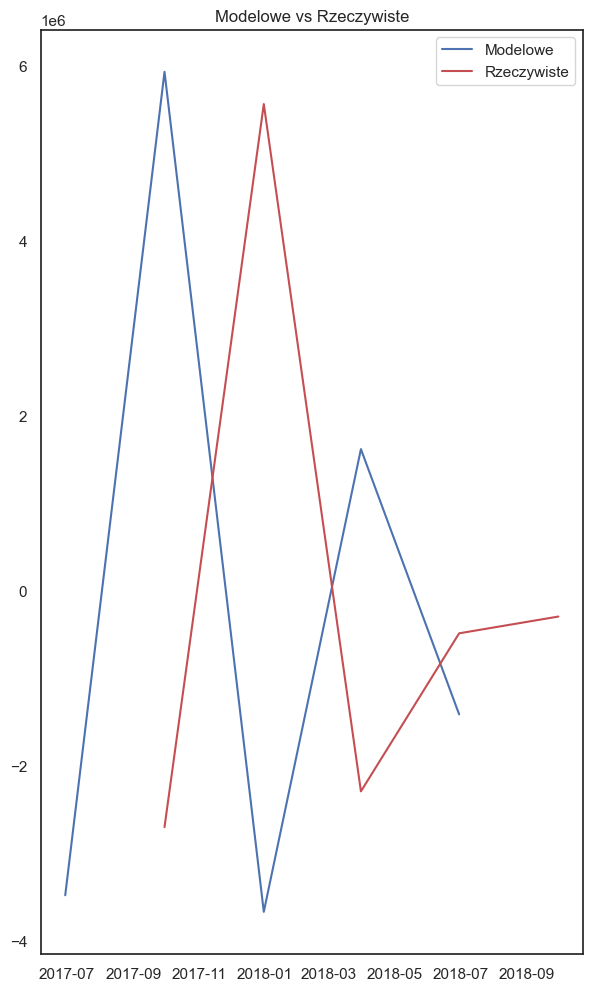

Błąd średniokwadratowy (MSE):  1662532069327.6707
MAPE:  181.04 %
                                     SARIMAX Results                                      
Dep. Variable:                             EBITDA   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -375.965
Date:                            Mon, 27 May 2024   AIC                            767.930
Time:                                    20:22:56   BIC                            777.355
Sample:                                06-30-2011   HQIC                           770.431
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0244      0.013    -78.529     

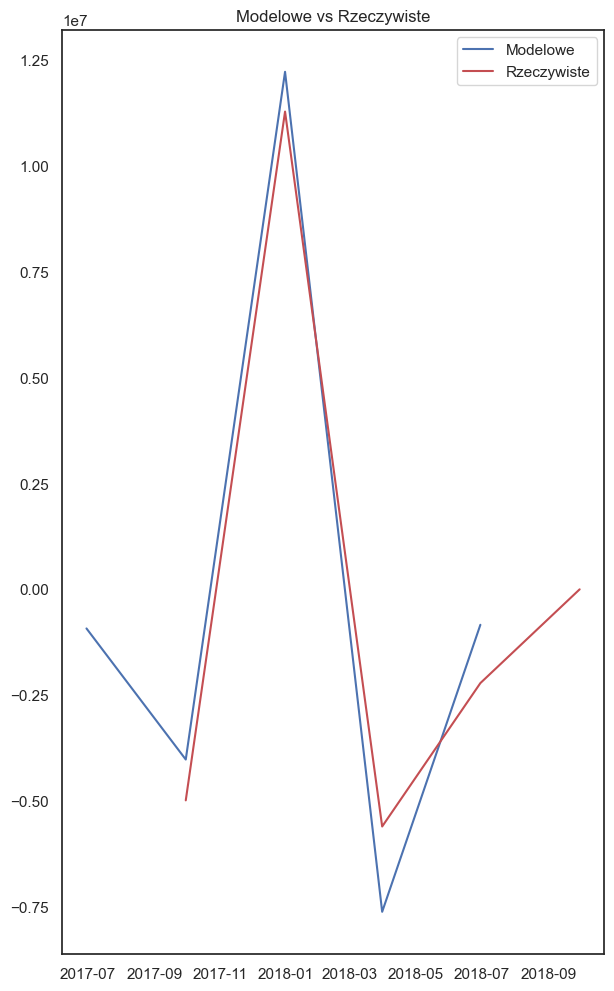

Błąd średniokwadratowy (MSE):  119586654149987.25
MAPE:  inf %
                                     SARIMAX Results                                      
Dep. Variable:                Przychody finansowe   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -311.044
Date:                            Mon, 27 May 2024   AIC                            638.087
Time:                                    20:22:57   BIC                            647.512
Sample:                                06-30-2011   HQIC                           640.588
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -2.3708      0.115    -20.673      0.

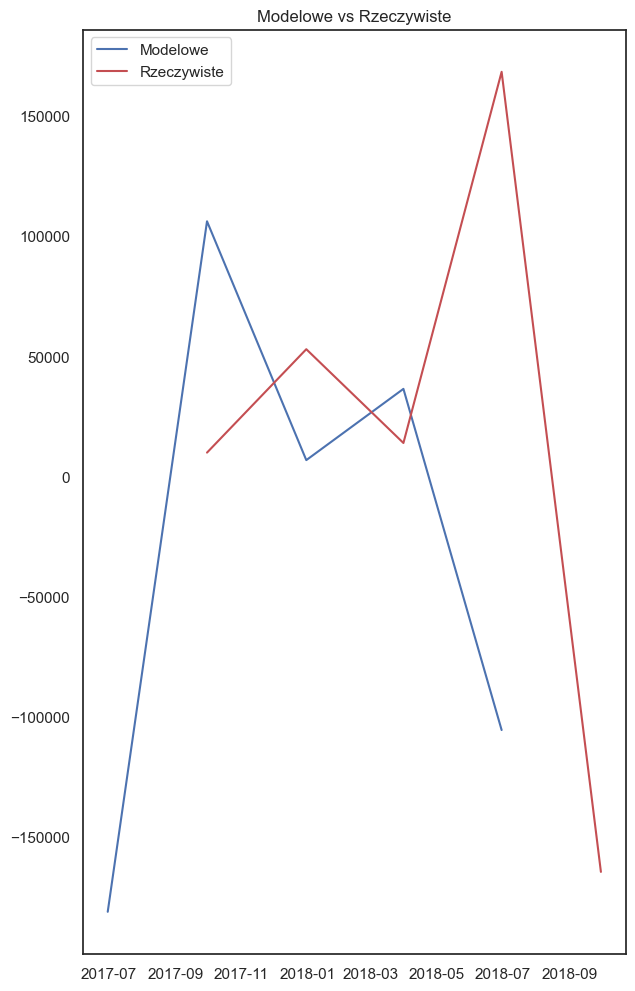

Błąd średniokwadratowy (MSE):  12042110335.8599
MAPE:  435.01 %
                                     SARIMAX Results                                      
Dep. Variable:                  Wydatki finansowe   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -306.317
Date:                            Mon, 27 May 2024   AIC                            628.634
Time:                                    20:22:58   BIC                            638.058
Sample:                                06-30-2011   HQIC                           631.134
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.6983      0.072    -23.552      0

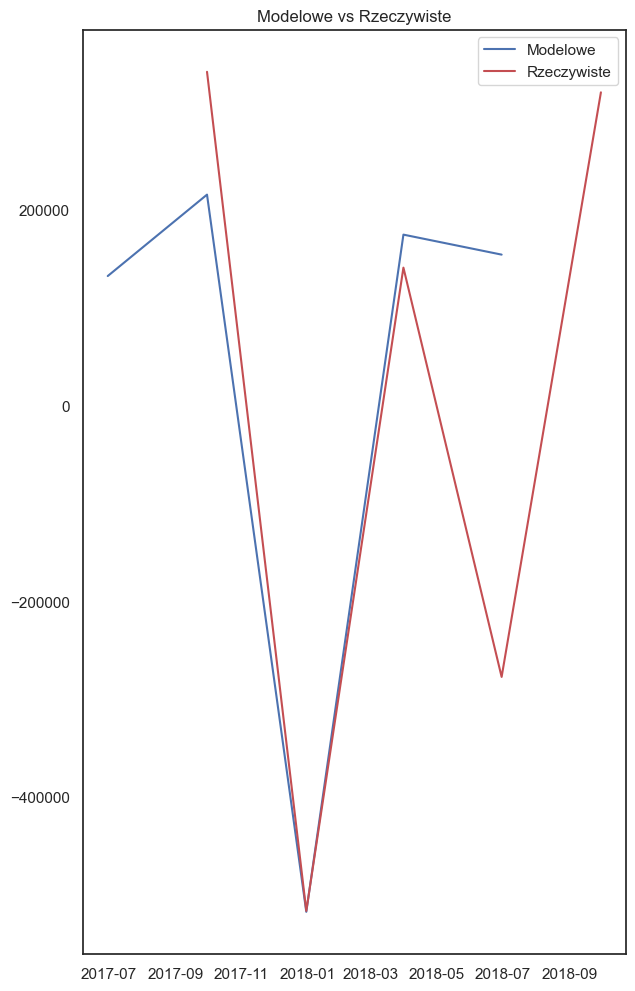

Błąd średniokwadratowy (MSE):  248618582167.65875
MAPE:  176.88 %
                                     SARIMAX Results                                      
Dep. Variable:                        Zysk brutto   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -388.511
Date:                            Mon, 27 May 2024   AIC                            793.022
Time:                                    20:22:58   BIC                            802.447
Sample:                                06-30-2011   HQIC                           795.523
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9044      1.055     -0.857     

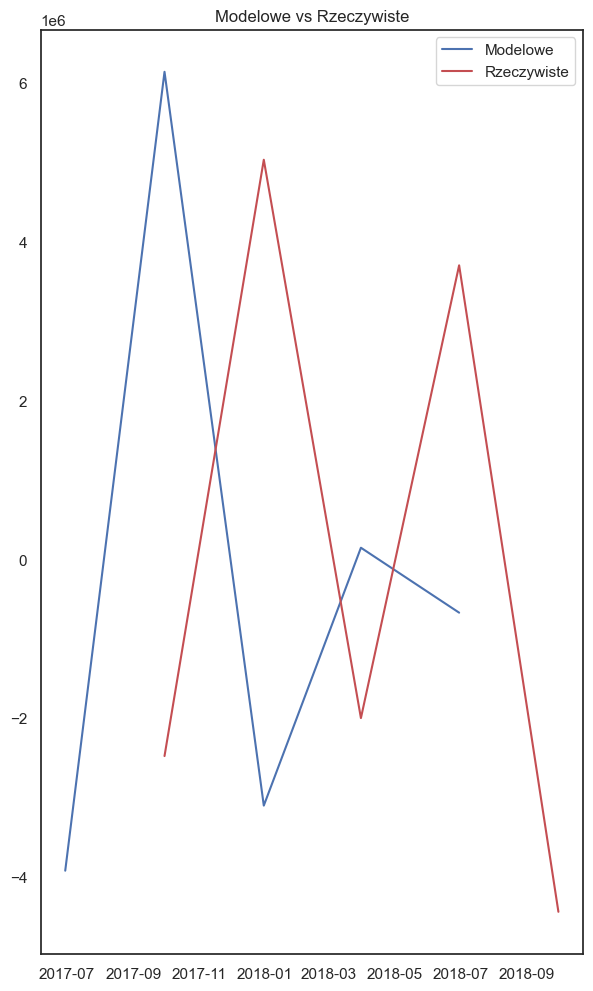

Błąd średniokwadratowy (MSE):  6270795962445.071
MAPE:  63.28 %
                                     SARIMAX Results                                      
Dep. Variable:                      Aktywa trwałe   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -470.908
Date:                            Mon, 27 May 2024   AIC                            957.815
Time:                                    20:22:59   BIC                            967.239
Sample:                                06-30-2011   HQIC                           960.315
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.5221      0.058    -26.260      0

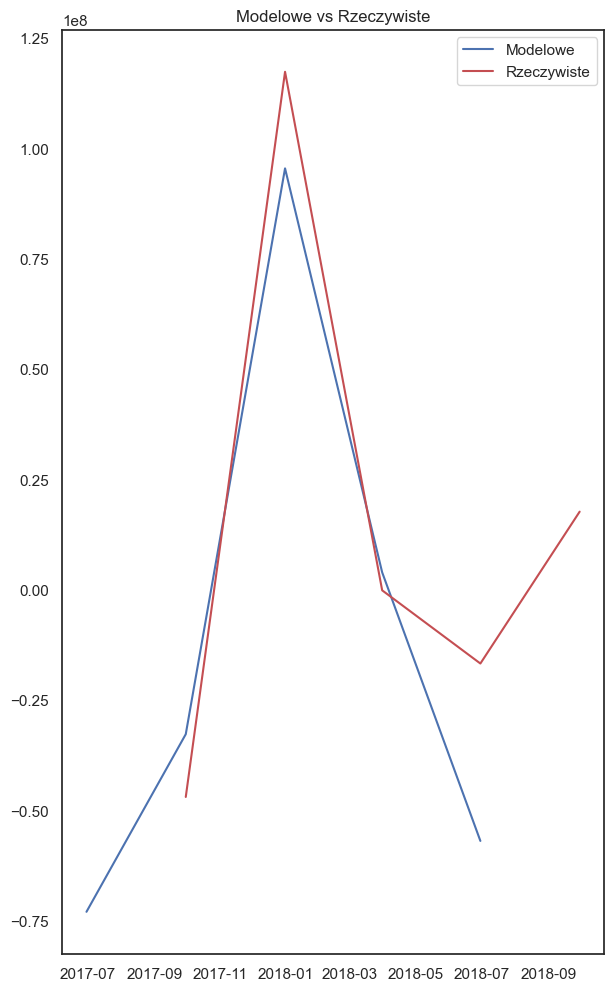

Błąd średniokwadratowy (MSE):  7663215973222154.0
MAPE:  25299.99 %
                                     SARIMAX Results                                      
Dep. Variable:                    Aktywa obrotowe   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -440.430
Date:                            Mon, 27 May 2024   AIC                            896.860
Time:                                    20:23:00   BIC                            906.285
Sample:                                06-30-2011   HQIC                           899.361
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -2.3538      0.020   -116.180   

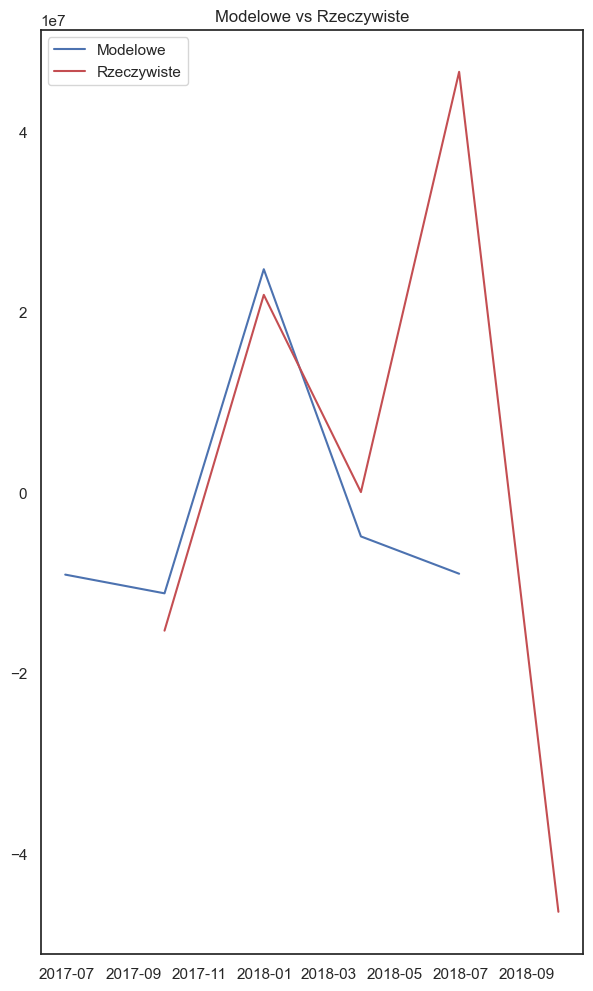

Błąd średniokwadratowy (MSE):  1158540271599640.8
MAPE:  6248.43 %
                                     SARIMAX Results                                      
Dep. Variable:              Kapitał własny ogółem   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -494.725
Date:                            Mon, 27 May 2024   AIC                           1005.450
Time:                                    20:23:01   BIC                           1014.875
Sample:                                06-30-2011   HQIC                          1007.951
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.4941      0.067    -22.207    

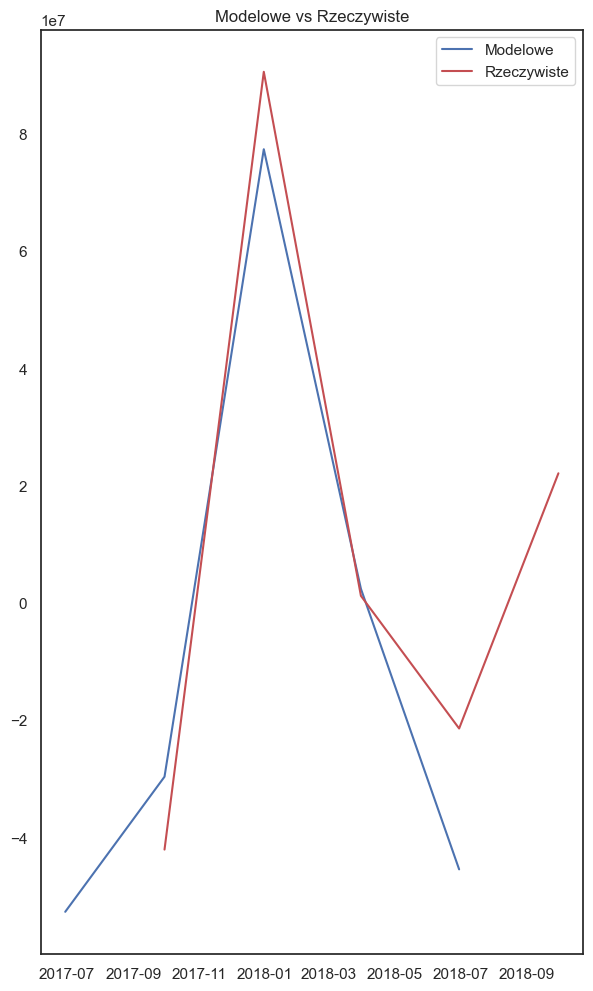

Błąd średniokwadratowy (MSE):  5098456407819323.0
MAPE:  1368.65 %
                                       SARIMAX Results                                        
Dep. Variable:      Kapitał własny spółki dominującej   No. Observations:                   24
Model:                 SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -492.226
Date:                                Mon, 27 May 2024   AIC                           1000.452
Time:                                        20:23:02   BIC                           1009.876
Sample:                                    06-30-2011   HQIC                          1002.952
                                         - 03-31-2017                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -

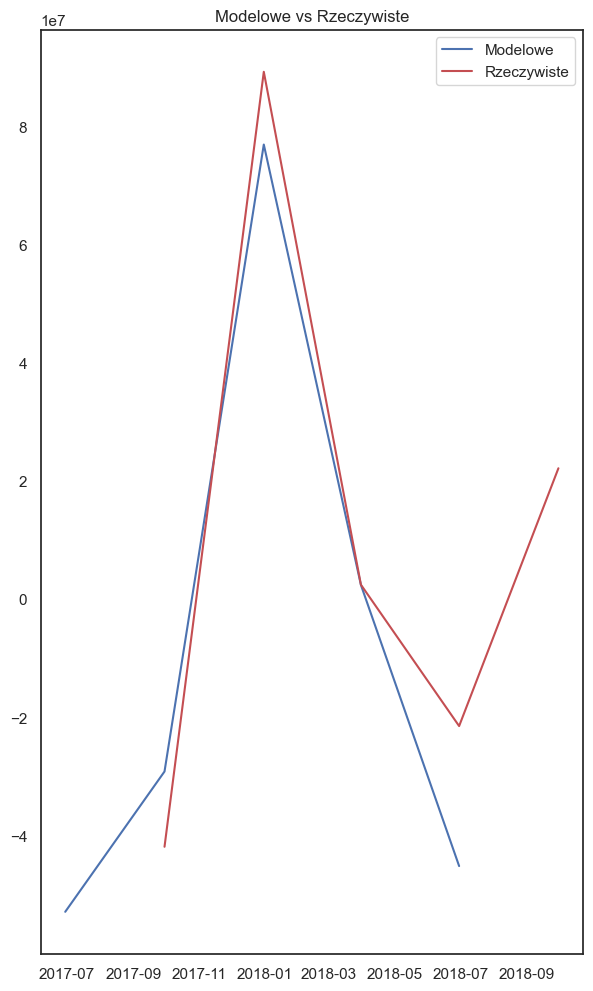

Błąd średniokwadratowy (MSE):  4956202379943178.0
MAPE:  719.02 %
                                     SARIMAX Results                                      
Dep. Variable:        Zobowiązania długoterminowe   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -397.622
Date:                            Mon, 27 May 2024   AIC                            811.245
Time:                                    20:23:03   BIC                            820.669
Sample:                                06-30-2011   HQIC                           813.745
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3833      0.570     -0.673     

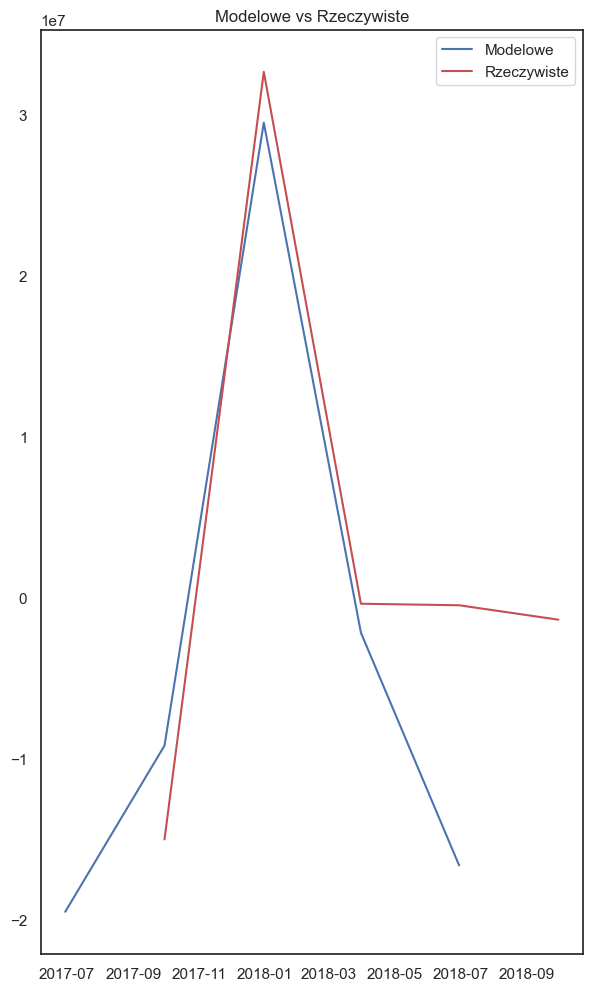

Błąd średniokwadratowy (MSE):  579565910923883.2
MAPE:  2058.44 %
                                     SARIMAX Results                                      
Dep. Variable:       Zobowiązania krótkoterminowe   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -419.579
Date:                            Mon, 27 May 2024   AIC                            855.158
Time:                                    20:23:03   BIC                            864.583
Sample:                                06-30-2011   HQIC                           857.659
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4362      0.148     -2.951     

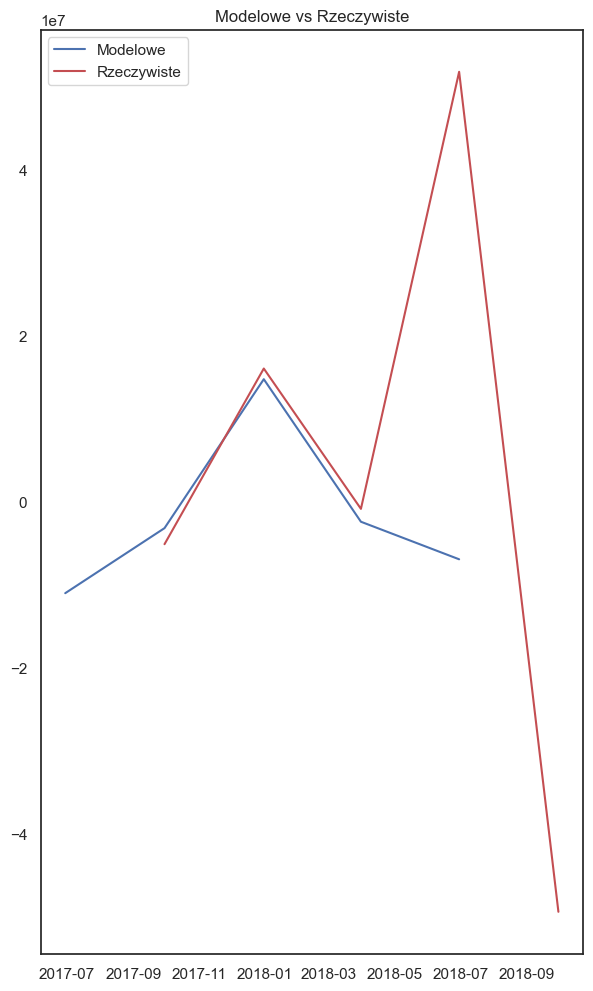

Błąd średniokwadratowy (MSE):  1079647333790907.2
MAPE:  447.01 %
                                     SARIMAX Results                                      
Dep. Variable:           Pożyczki krótkoterminowe   No. Observations:                   24
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -345.245
Date:                            Mon, 27 May 2024   AIC                            706.490
Time:                                    20:23:04   BIC                            715.915
Sample:                                06-30-2011   HQIC                           708.991
                                     - 03-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5094      0.483     -1.055     

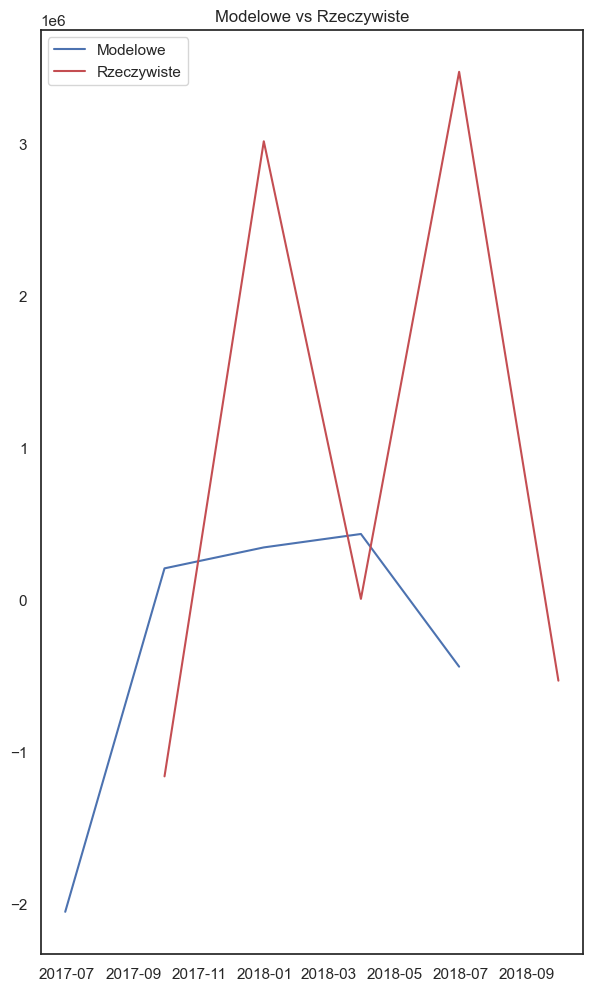

Błąd średniokwadratowy (MSE):  3607614044363.85
MAPE:  1183.09 %


In [21]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

for i in list(train.columns):
    train_t = train[f"{i}"]
    model = SARIMAX(train_t, order=(3, 0, 3), seasonal_order=(1, 0, 0, 4))
    results = model.fit()
    
    # Wyświetlenie podsumowania modelu
    print(results.summary())
    
    forecast_results = results.forecast(steps=5)
    test_t = test[:5]
    
    fig = plt.figure(figsize=(7,12))
    plt.plot(forecast_results, label="Modelowe")
    plt.plot(test_t[f"{i}"], c='r', label="Rzeczywiste")
    plt.title("Modelowe vs Rzeczywiste")
    plt.legend()
    plt.show()
    
    from sklearn.metrics import mean_squared_error
    
    mse = mean_squared_error(test_t[f"{i}"], forecast_results)
    print("Błąd średniokwadratowy (MSE): ", mse)
    
    
    import numpy as np
    
    def mean_absolute_percentage_error(y_true, y_pred):
        """
        Oblicza średnią bezwzględną błędu procentowego (MAPE).
    
        Parametry:
        y_true : array-like
            Rzeczywiste wartości.
        y_pred : array-like
            Prognozowane wartości.
    
        Zwraca:
        mape : float
            Wartość MAPE.
        """
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    
    
    
    mape = mean_absolute_percentage_error(test_t[f"{i}"], forecast_results)
    print("MAPE: ", round(mape,2),"%")

Błąd średniokwadratowy (MSE):  3248246993111387.5


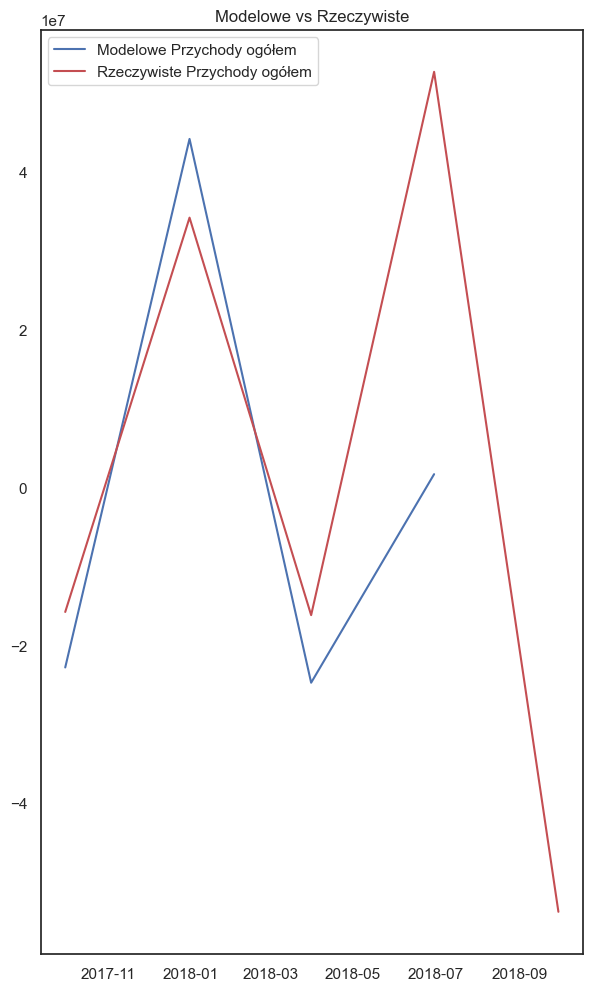

MAPE Przychody ogółem:  179.45 %


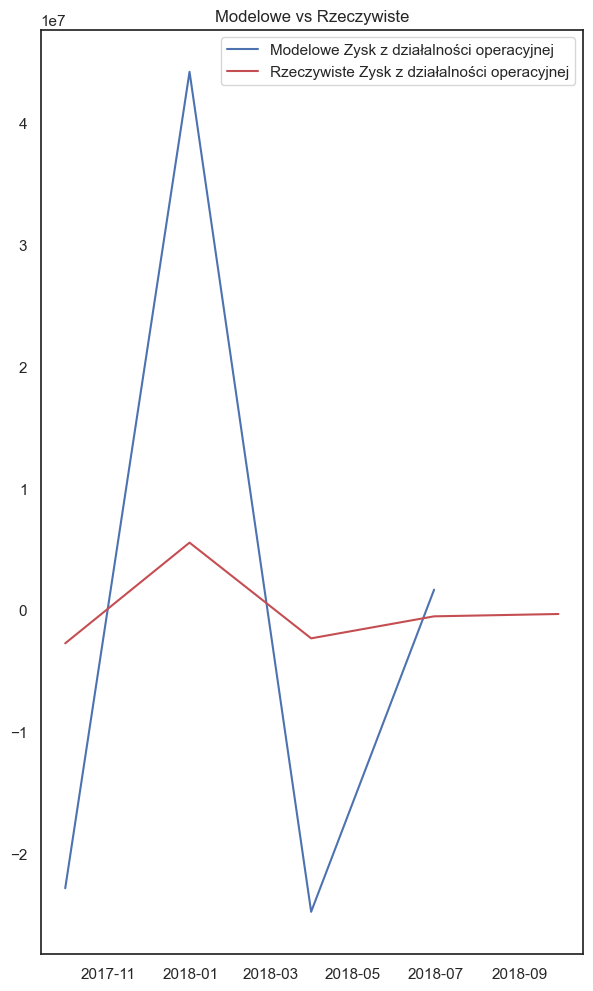

MAPE Zysk z działalności operacyjnej:  1665.36 %


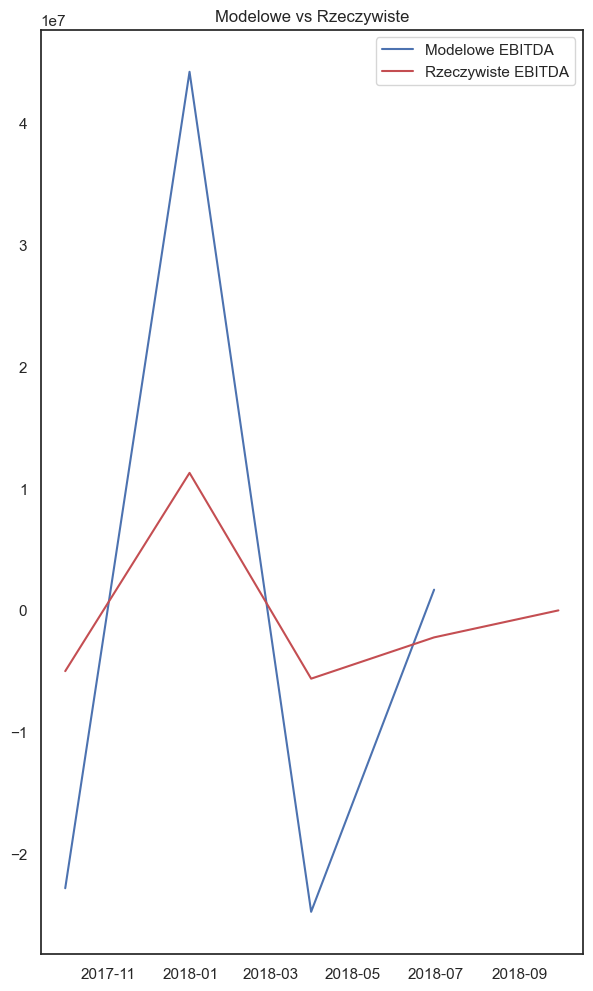

MAPE EBITDA:  inf %


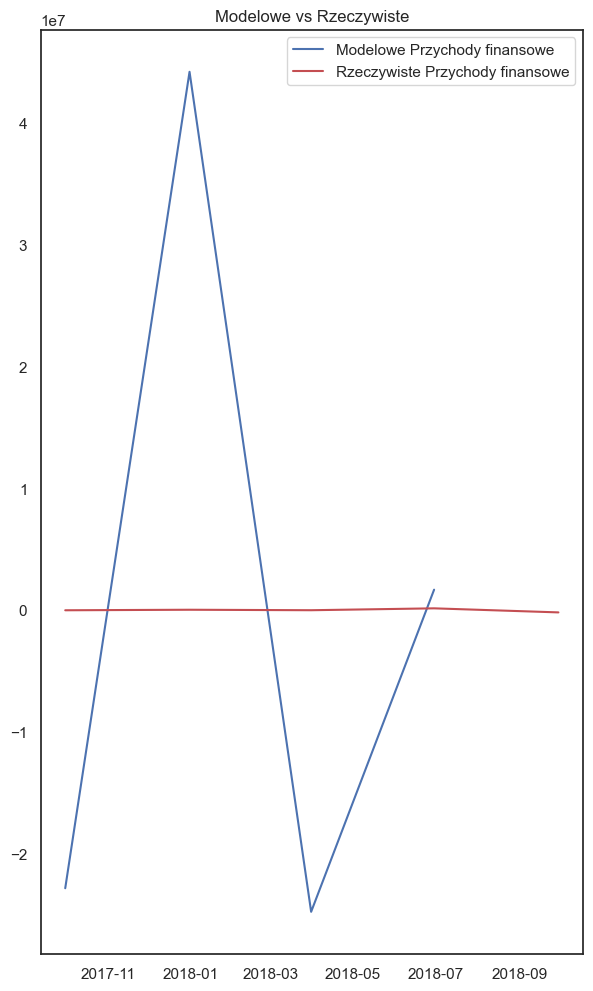

MAPE Przychody finansowe:  77141.72 %


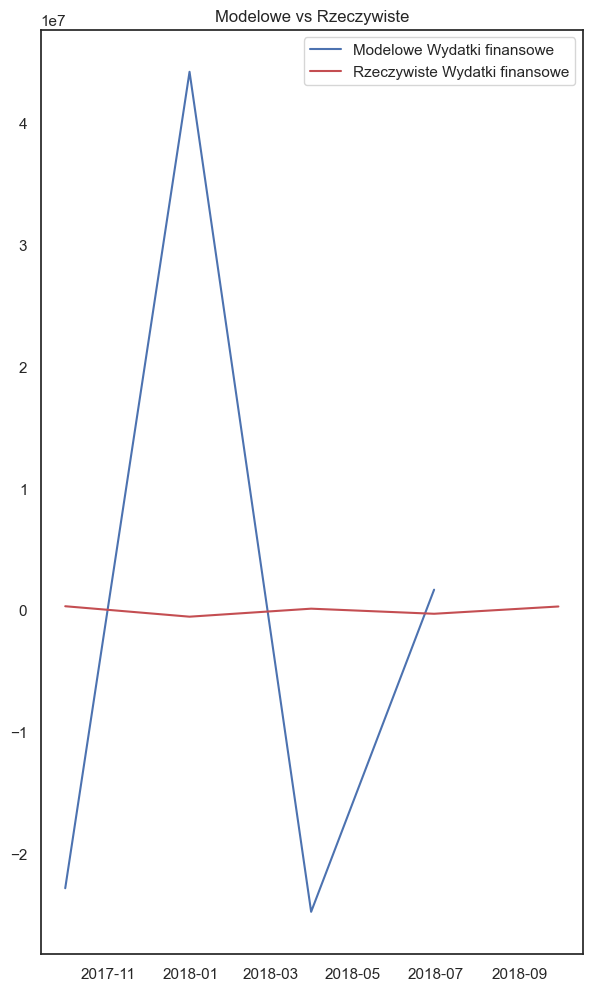

MAPE Wydatki finansowe:  9007.35 %


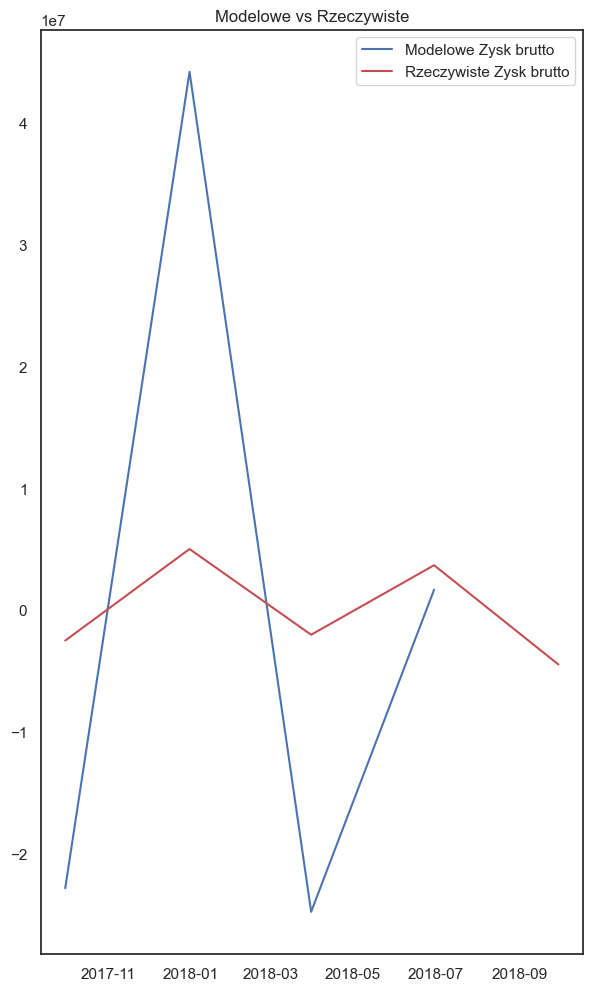

MAPE Zysk brutto:  783.33 %


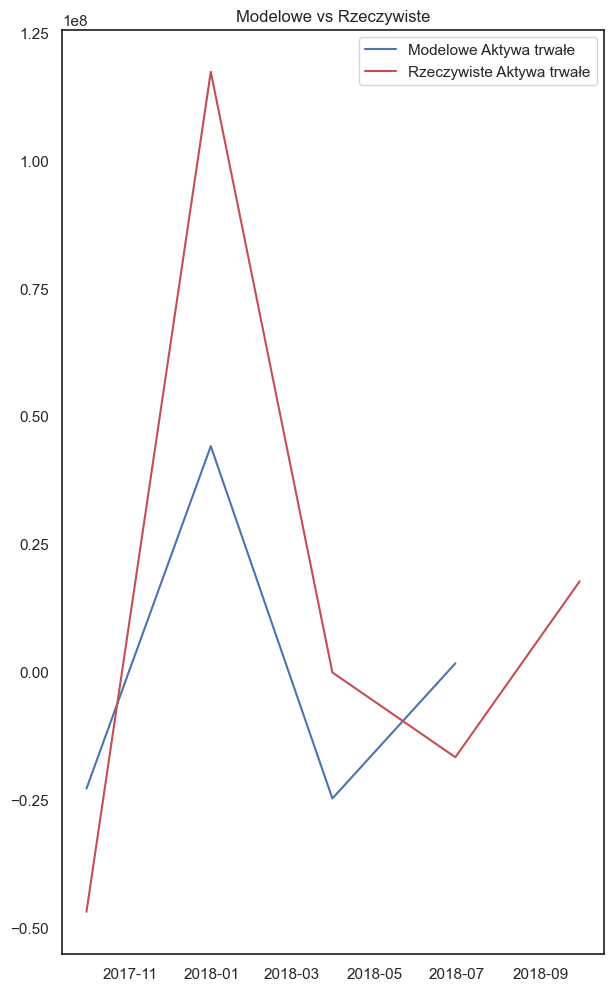

MAPE Aktywa trwałe:  11718.08 %


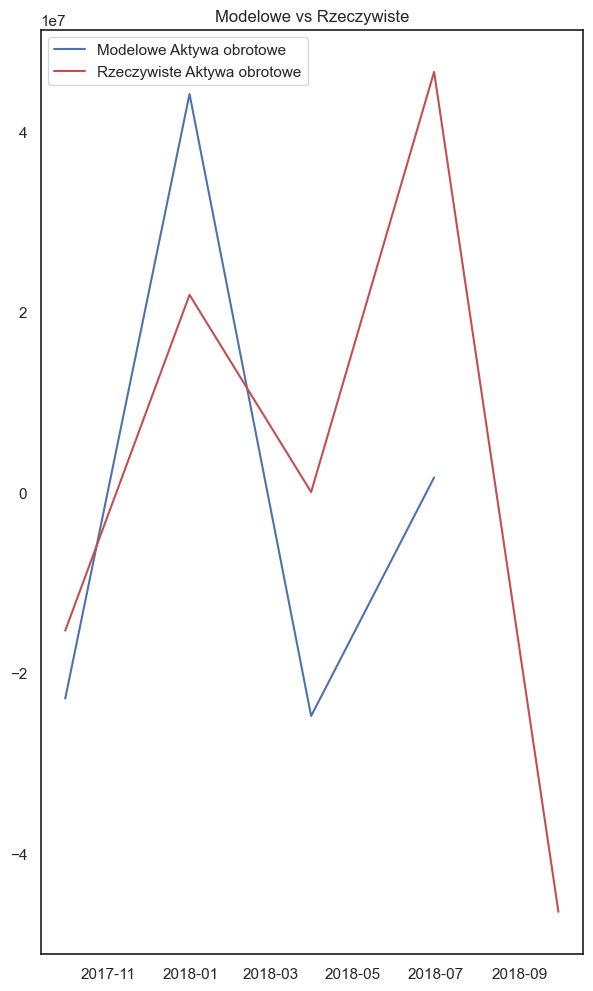

MAPE Aktywa obrotowe:  11138.24 %


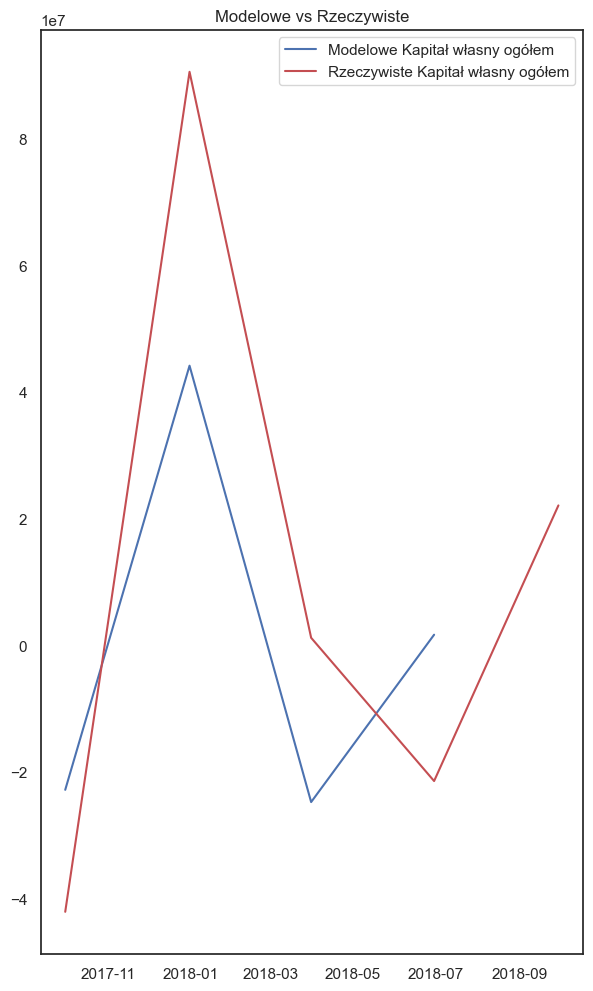

MAPE Kapitał własny ogółem:  774.35 %


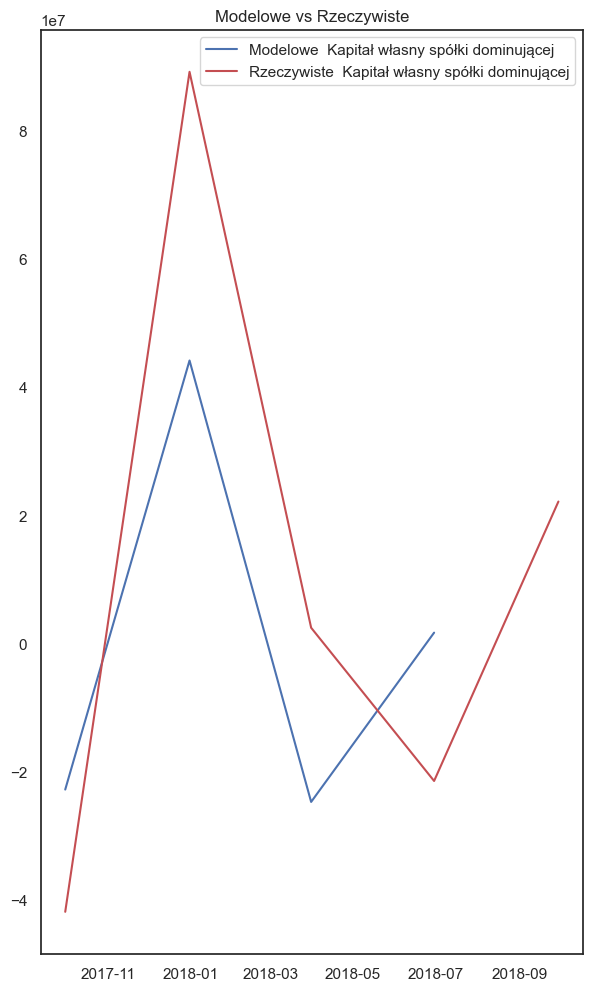

MAPE  Kapitał własny spółki dominującej:  405.61 %


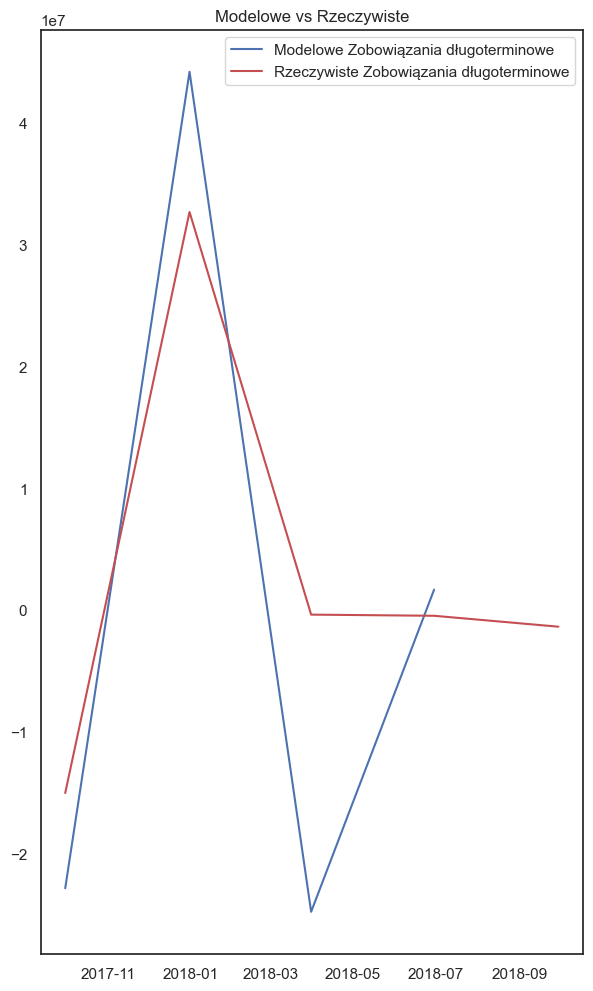

MAPE Zobowiązania długoterminowe:  3765.98 %


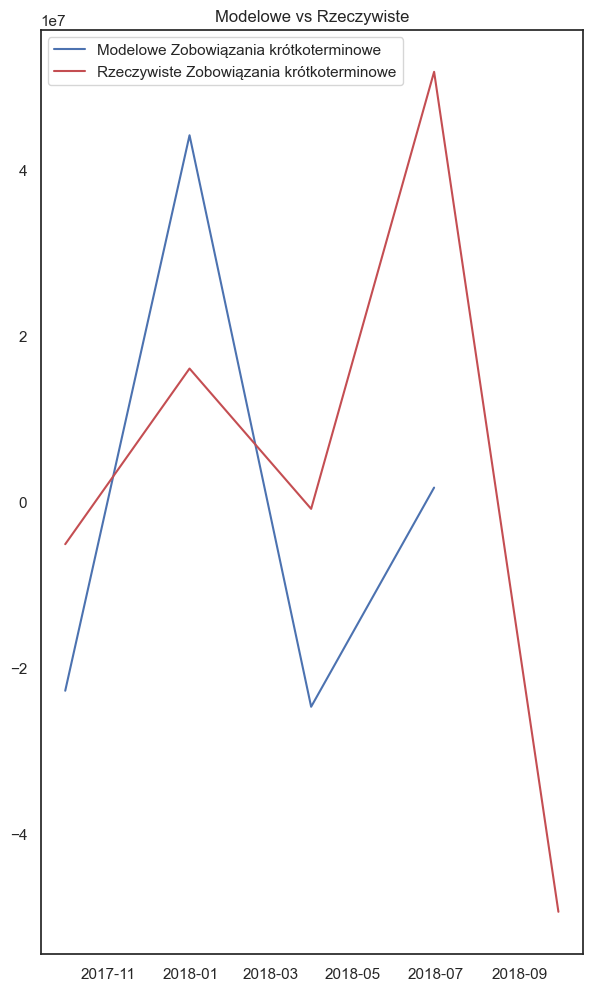

MAPE Zobowiązania krótkoterminowe:  1165.69 %


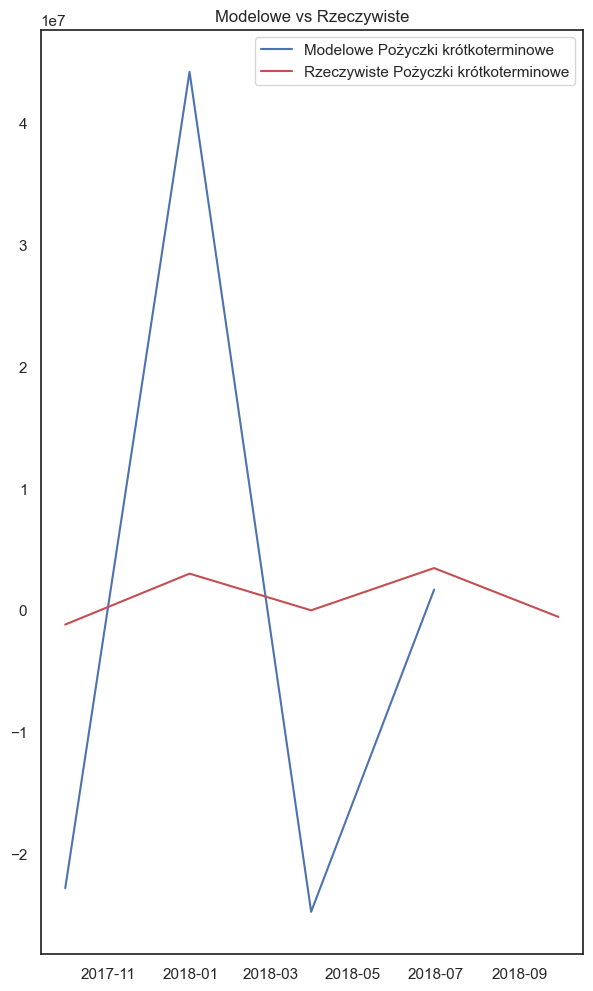

MAPE Pożyczki krótkoterminowe:  147698.85 %


In [30]:
forecast_results = results.forecast(steps=5)
forecast_result = pd.DataFrame(forecast_results, index=test[:5].index)
test_t = test[:5]

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(test_t["Przychody ogółem"], forecast_results)
print("Błąd średniokwadratowy (MSE): ", mse)


import numpy as np

def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100






for i in list(test.columns):
    
    fig = plt.figure(figsize=(7,12))
    plt.plot(forecast_result, label=f"Modelowe {i}")
    plt.plot(test_t[f"{i}"], c='r', label=f"Rzeczywiste {i}")
    plt.title("Modelowe vs Rzeczywiste")
    plt.legend()
    plt.show()
    mape = mean_absolute_percentage_error(test_t[f"{i}"], forecast_results)
    print(f"MAPE {i}: ", round(mape,2),"%")

In [22]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import numpy as np

# Assuming random_forest_mol contains your data

def RandomForest(i):
    # Extracting labels
    labels = np.array(random_forest_mol[f"{i}"])
    
    # Extracting features
    features = random_forest_mol.drop(f"{i}", axis=1)
    features_np = np.array(features)
    
    # Splitting data into training and testing sets
    train_l = labels[:60]
    test_l = labels[61:]
    
    train_f = features_np[:60]
    test_f = features_np[61:]
    
    # List of feature names
    f_list = list(features.columns)
    
    # Initialize RandomForestRegressor
    rf = RandomForestRegressor(n_estimators=1000, random_state=42)
    
    # Perform cross-validation
    scores = cross_val_score(rf, train_f, train_l, cv=5)
    
    # Fit the model
    rf.fit(train_f, train_l)
    
    # Print average accuracy obtained from cross-validation
    print("----------------------------------------")
    print(f'Random Forest for {i}')
    print("Cross-validation scores:", scores)
    print("Mean accuracy:", scores.mean())
    print("Standard deviation of accuracy:", scores.std())


vars = list(mol_diff.columns)

for i in vars:
    RandomForest(i)

----------------------------------------
Random Forest for Przychody ogółem
Cross-validation scores: [ 0.8268137   0.65426276  0.82599761  0.7689655  -0.25338372]
Mean accuracy: 0.5645311718193626
Standard deviation of accuracy: 0.4137600138967786
----------------------------------------
Random Forest for Zysk z działalności operacyjnej
Cross-validation scores: [0.97837256 0.8382402  0.38201264 0.96573579 0.98184802]
Mean accuracy: 0.8292418424125139
Standard deviation of accuracy: 0.22989308034854894
----------------------------------------
Random Forest for EBITDA
Cross-validation scores: [ 0.94056609  0.48058691  0.22681511 -1.98599829 -4.54993752]
Mean accuracy: -0.9775935417548517
Standard deviation of accuracy: 2.0510850024947347
----------------------------------------
Random Forest for Przychody finansowe
Cross-validation scores: [ 0.55610787  0.75009794 -0.90205628  0.43861368 -6.03590651]
Mean accuracy: -1.03862866125592
Standard deviation of accuracy: 2.565790729696868
-----

MAPE Przychody ogółem:  35.01 %


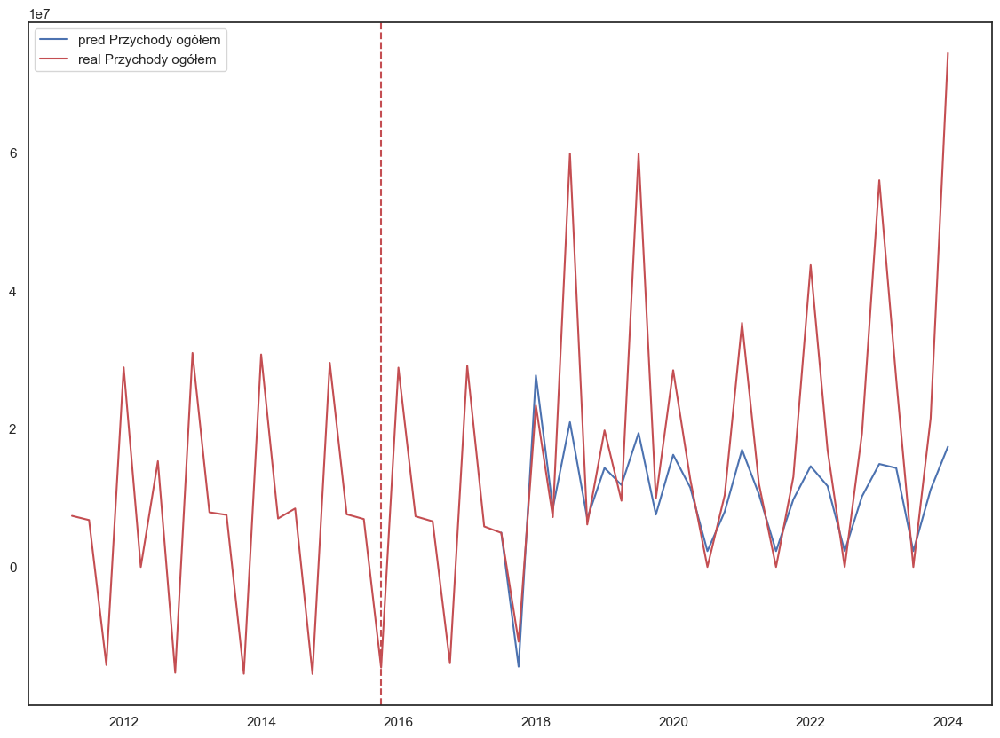

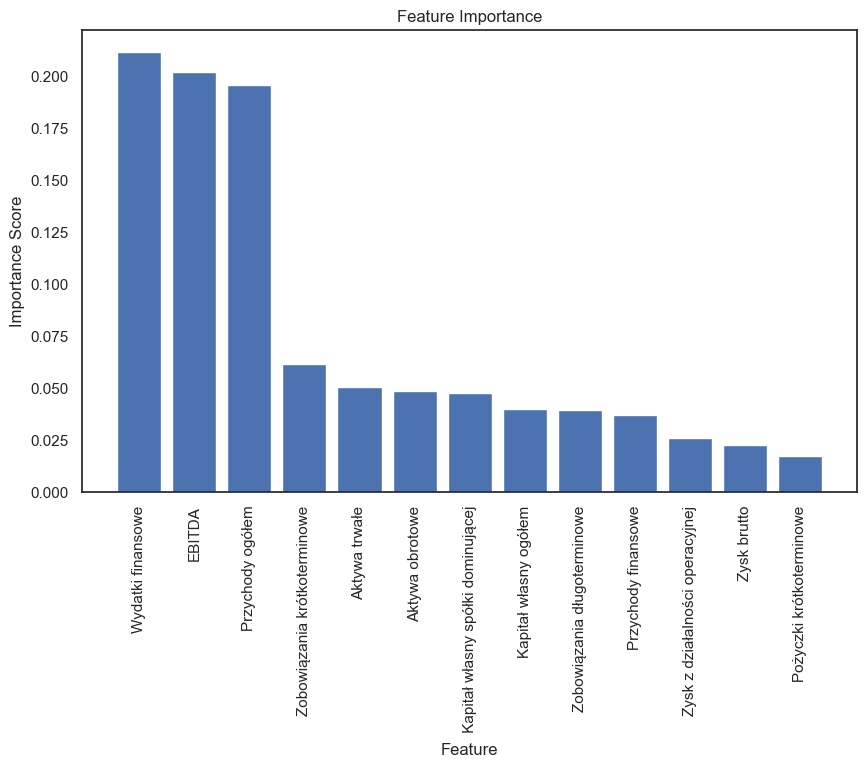

MAPE Zysk z działalności operacyjnej:  45.22 %


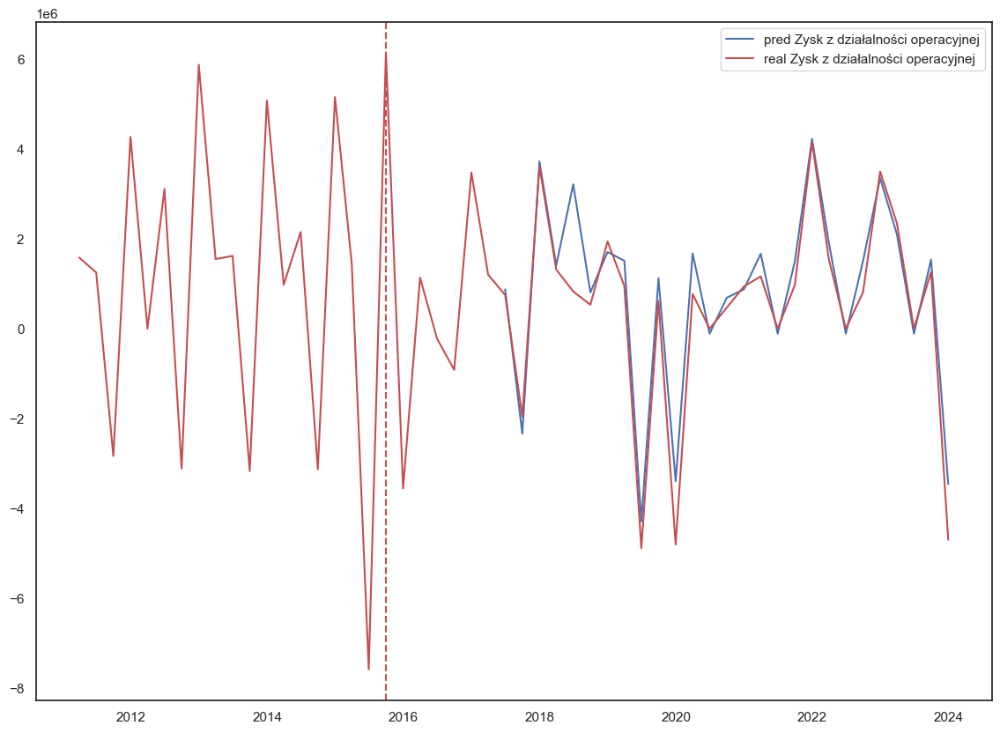

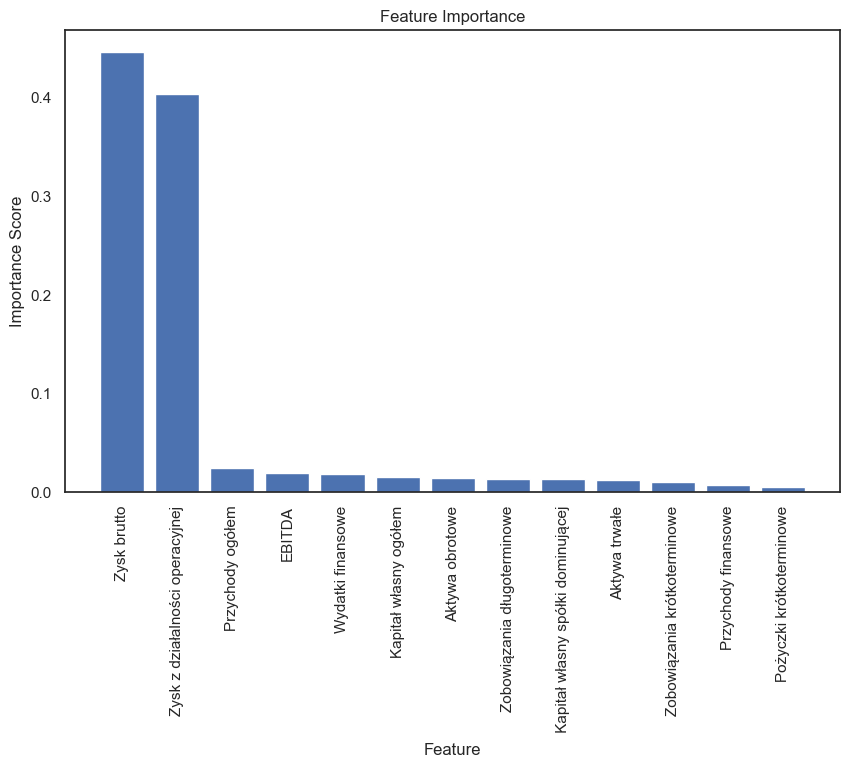

MAPE EBITDA:  49.59 %


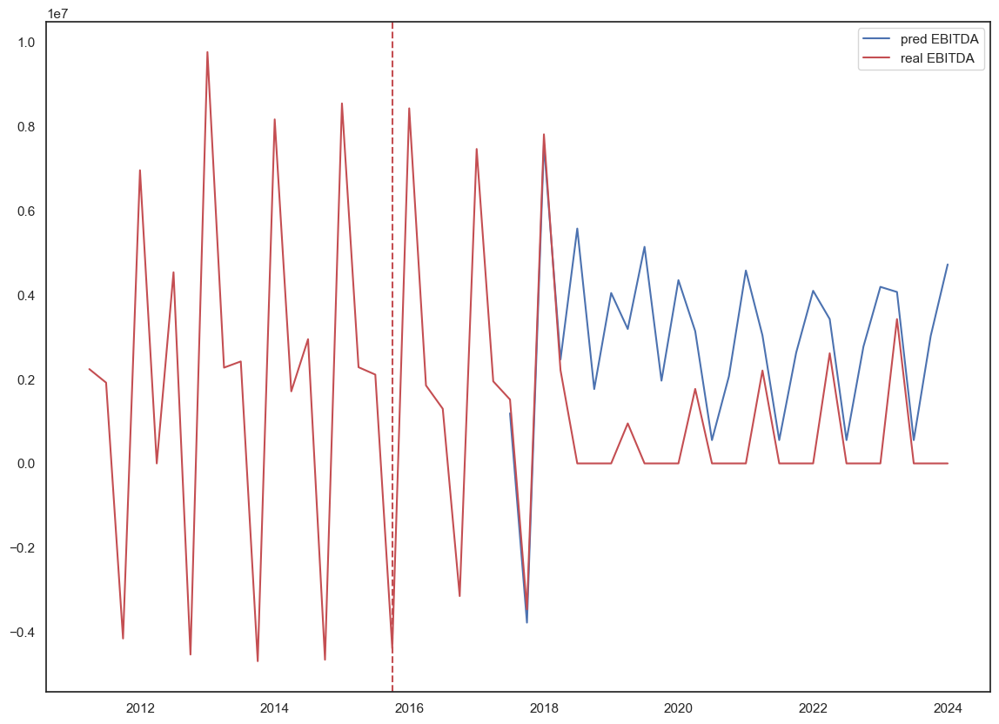

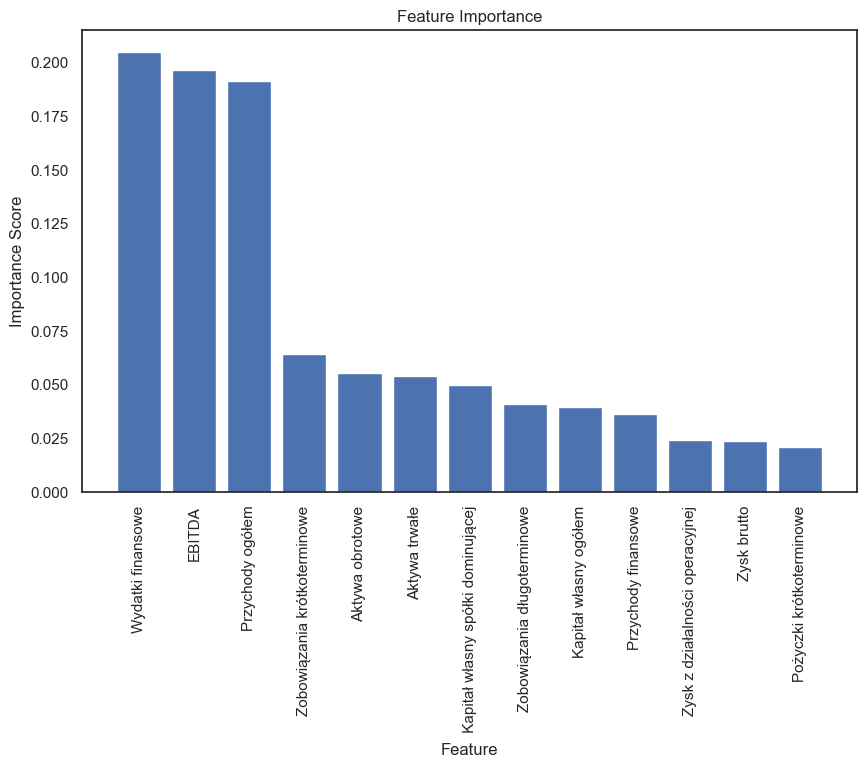

MAPE Przychody finansowe:  660.52 %


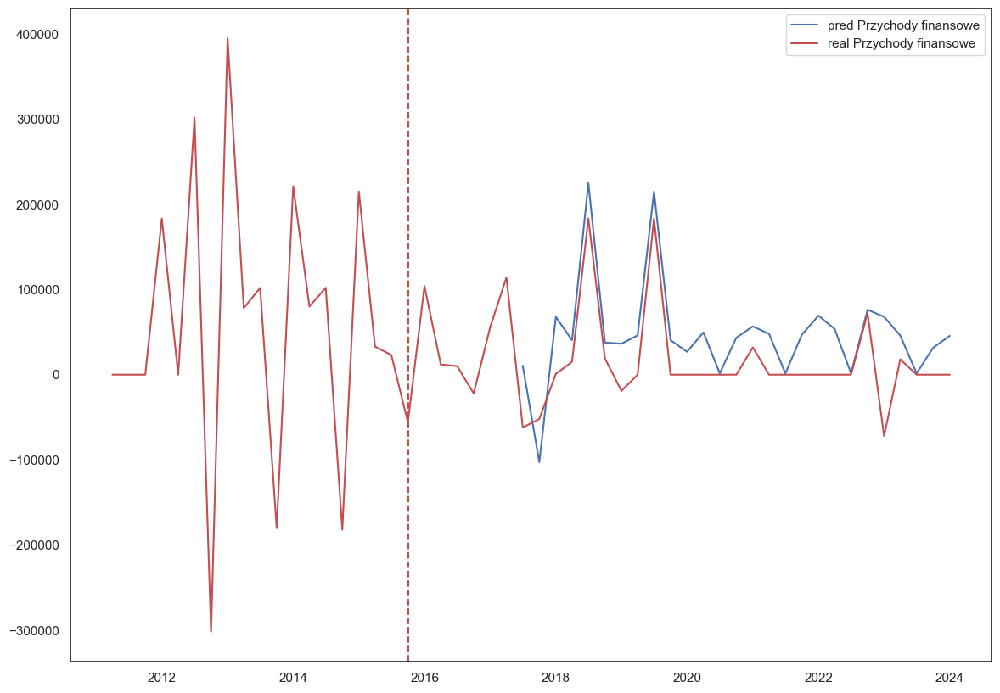

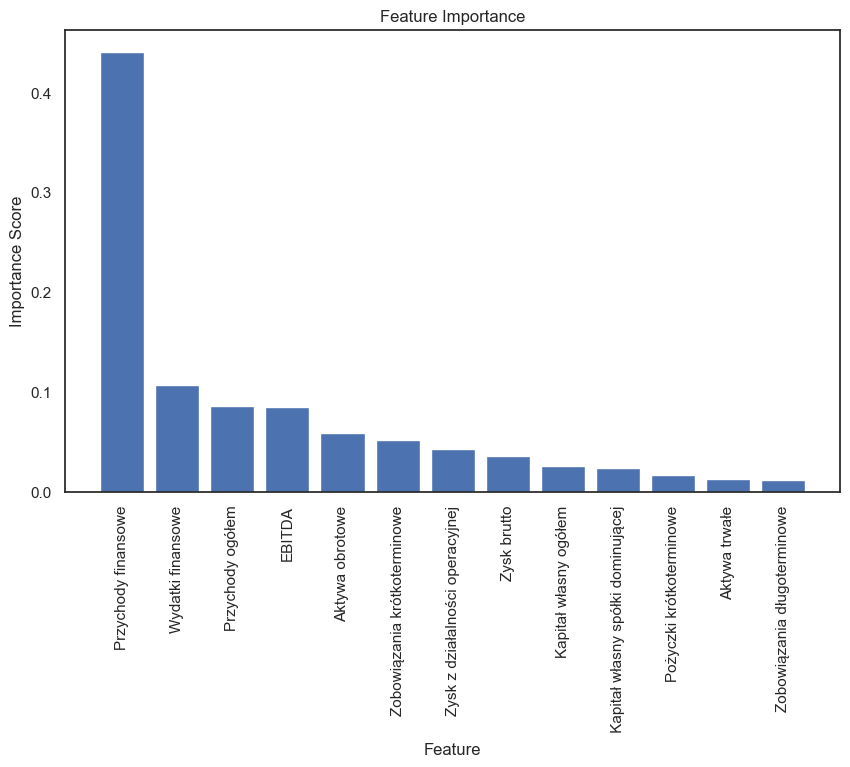

MAPE Wydatki finansowe:  39.49 %


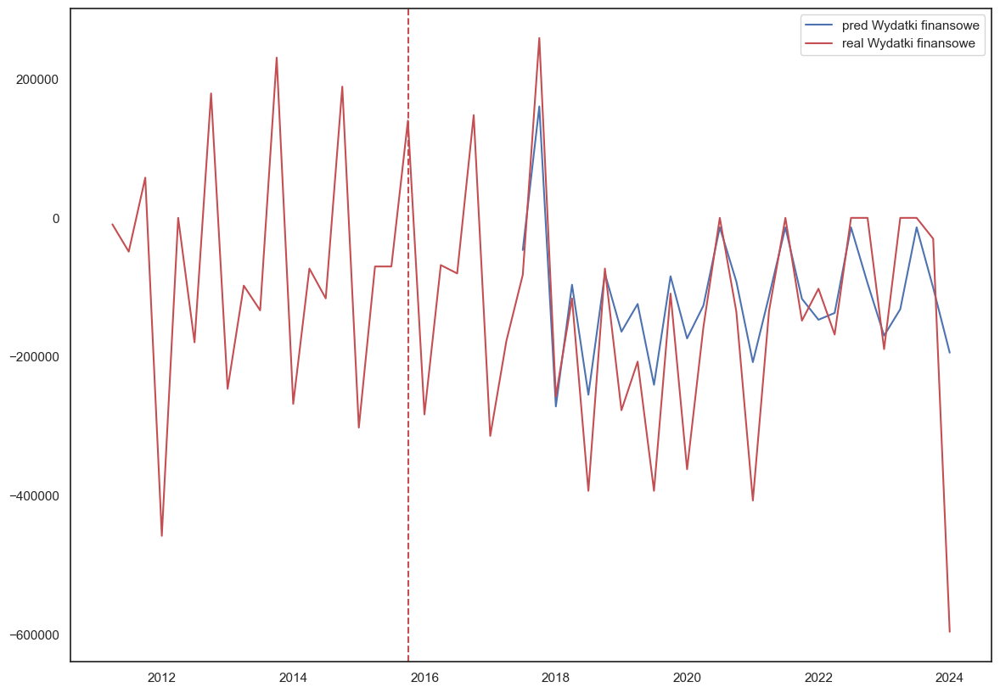

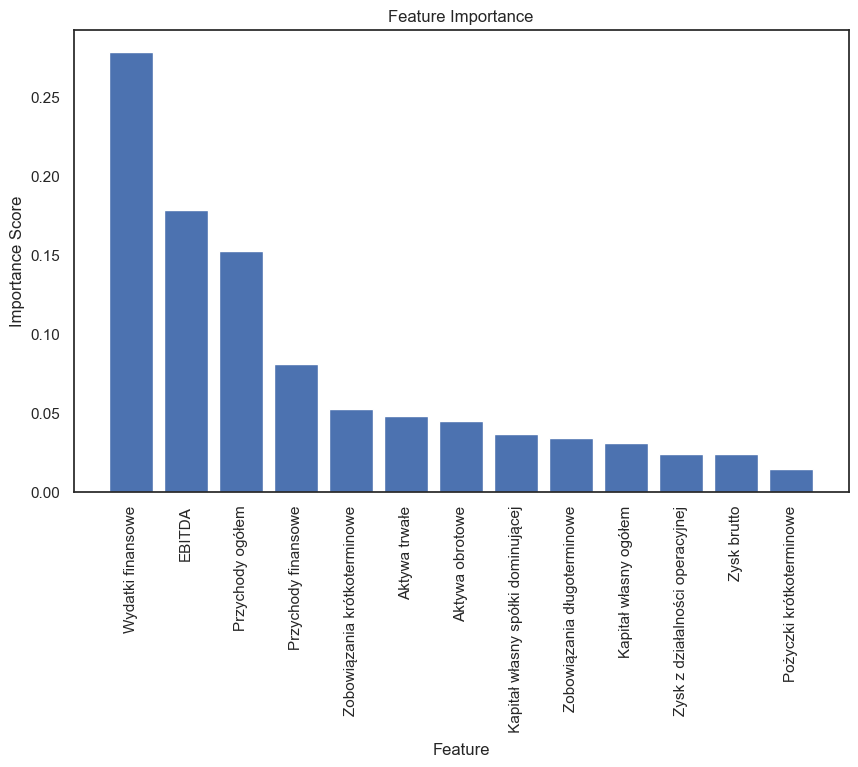

MAPE Zysk brutto:  234.56 %


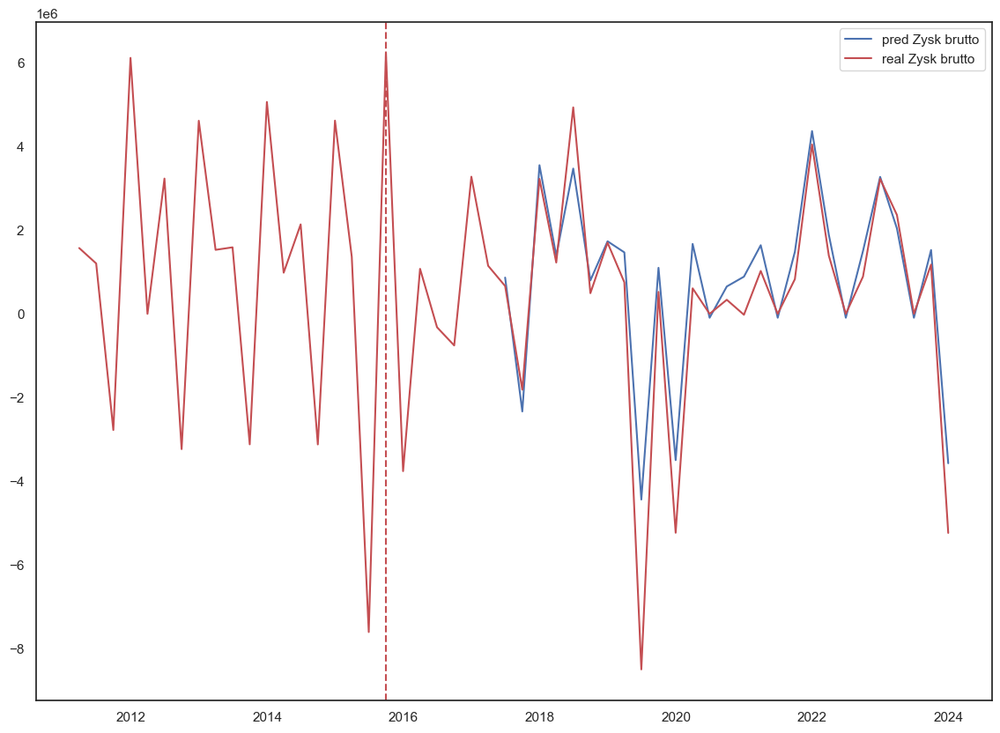

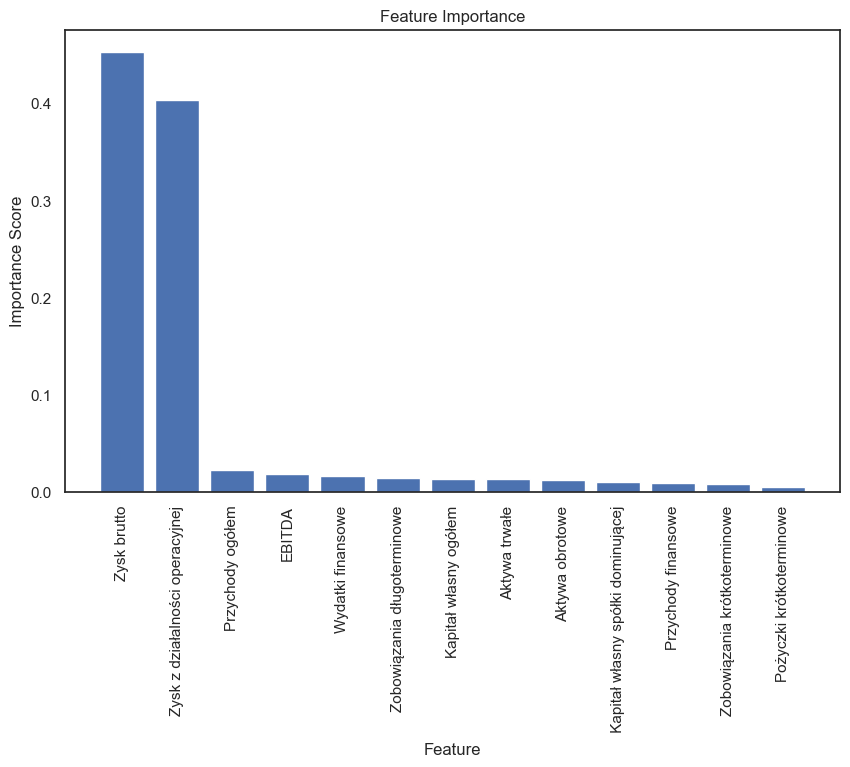

MAPE Aktywa trwałe:  47.63 %


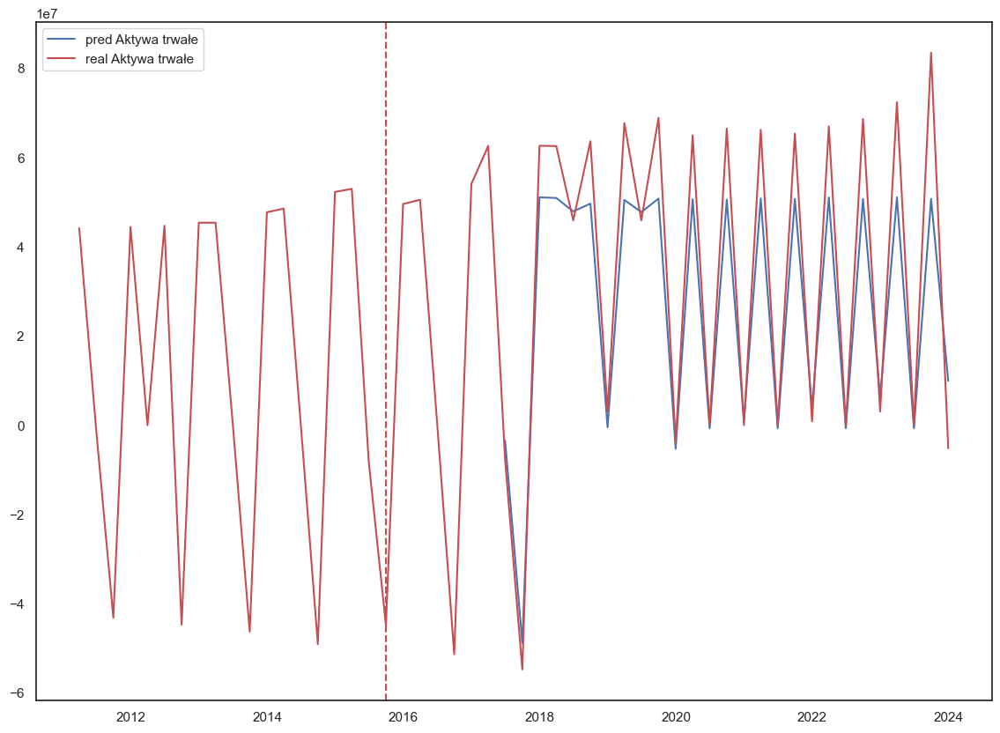

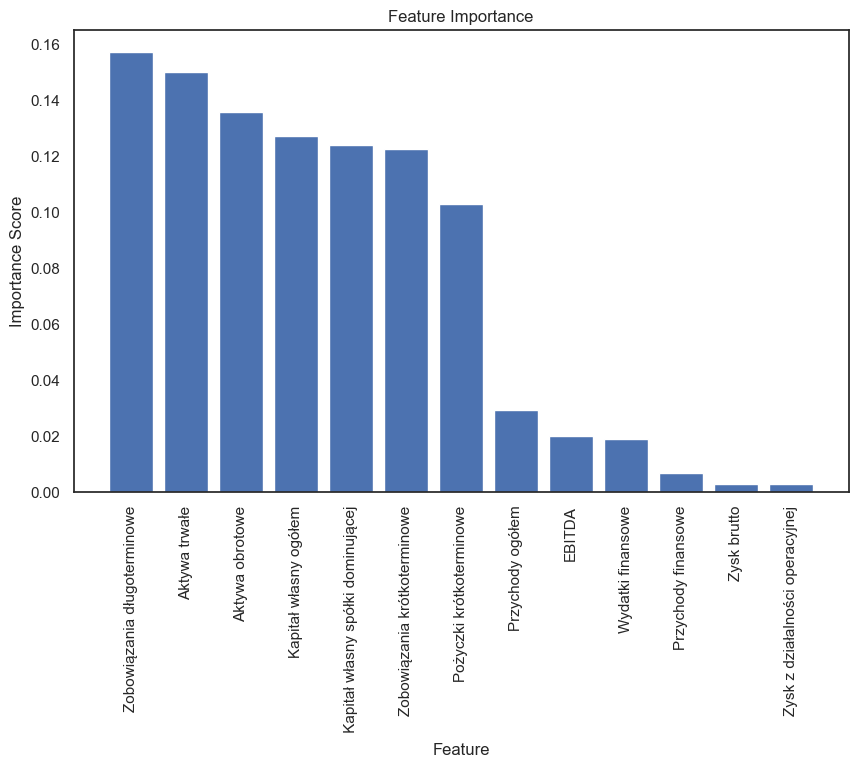

MAPE Aktywa obrotowe:  44.62 %


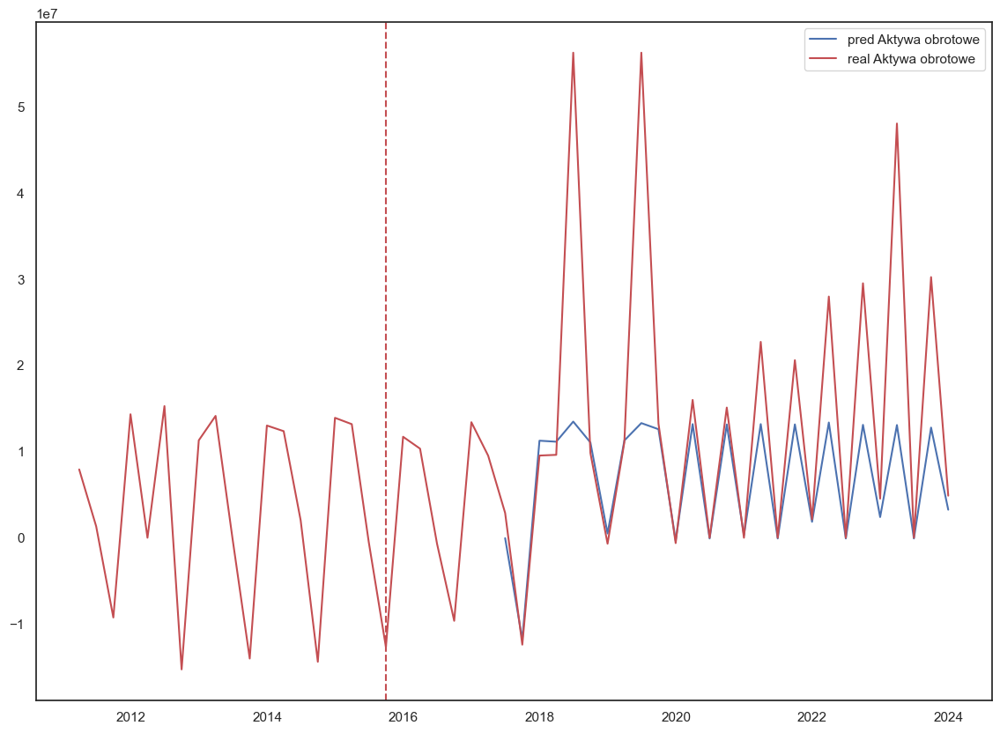

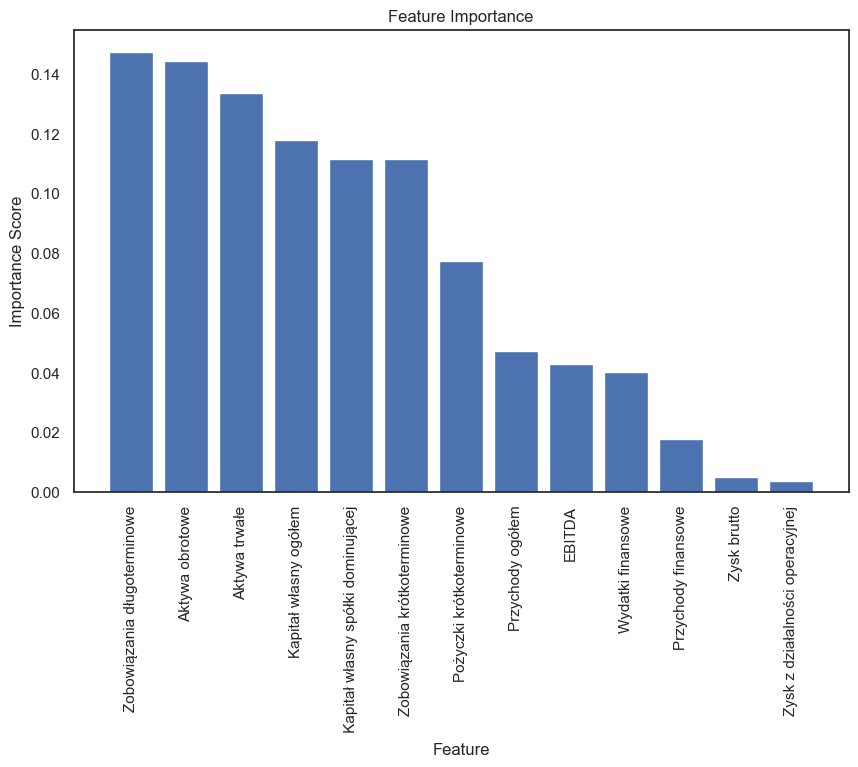

MAPE Kapitał własny ogółem:  42.96 %


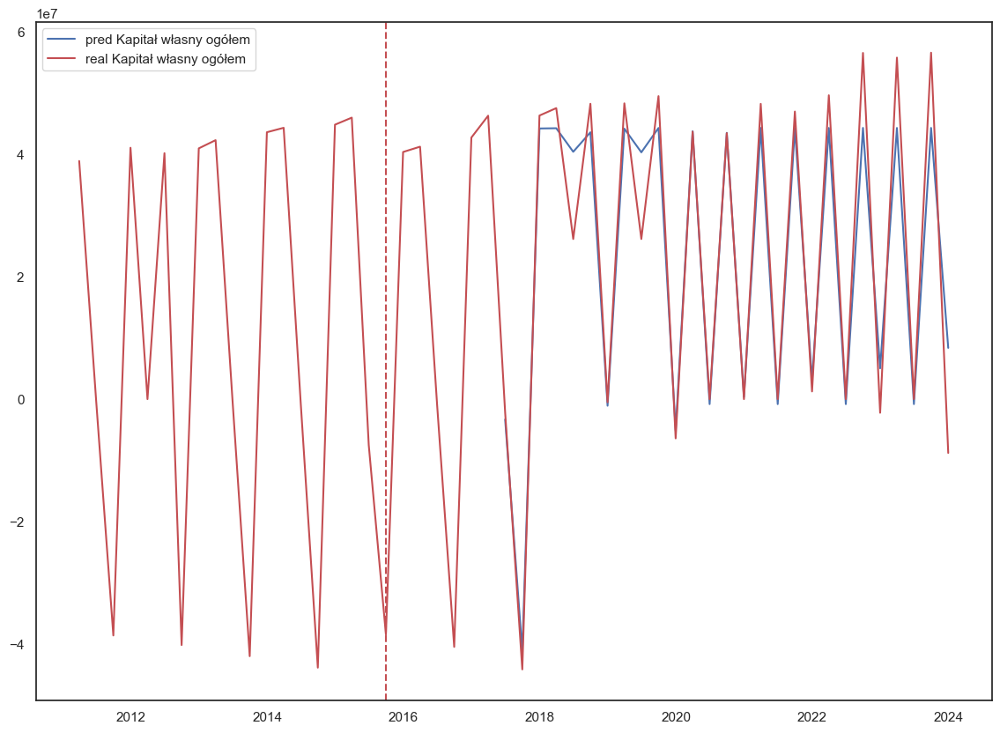

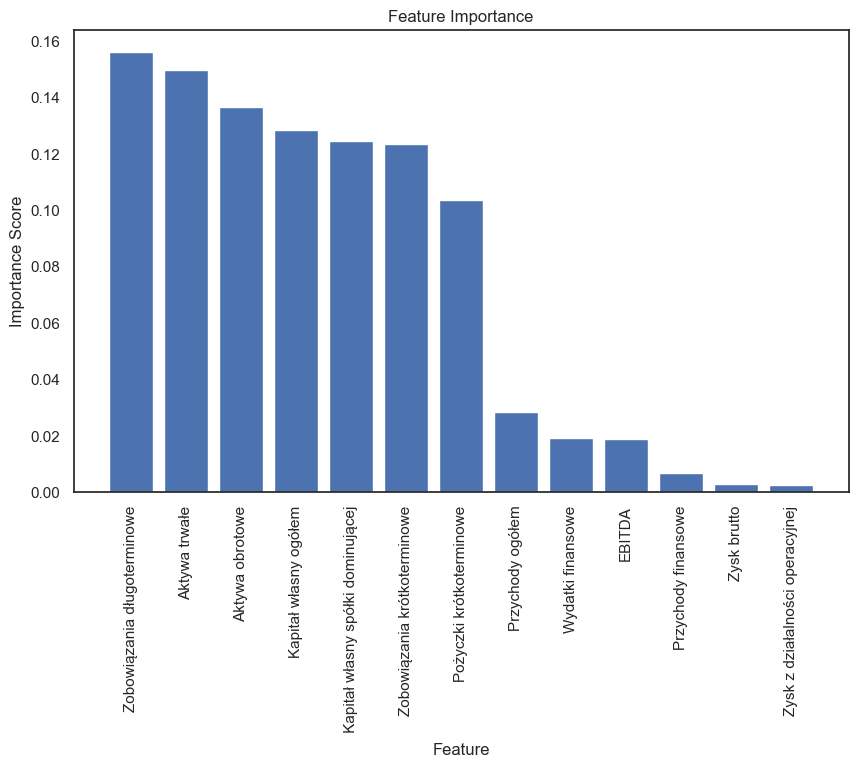

MAPE  Kapitał własny spółki dominującej:  42.23 %


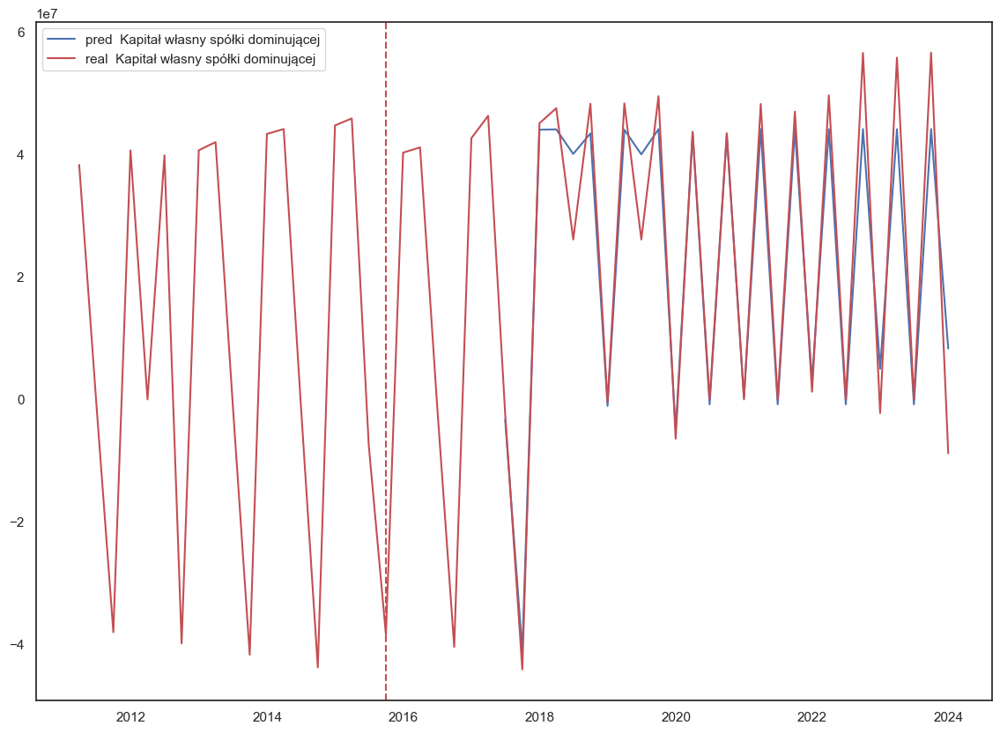

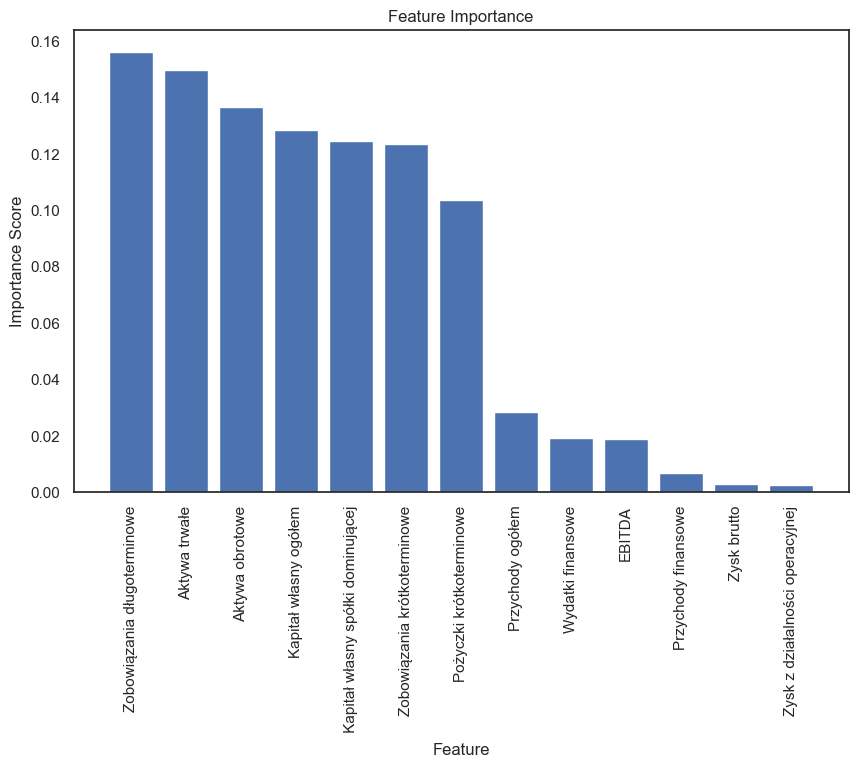

MAPE Zobowiązania długoterminowe:  78.32 %


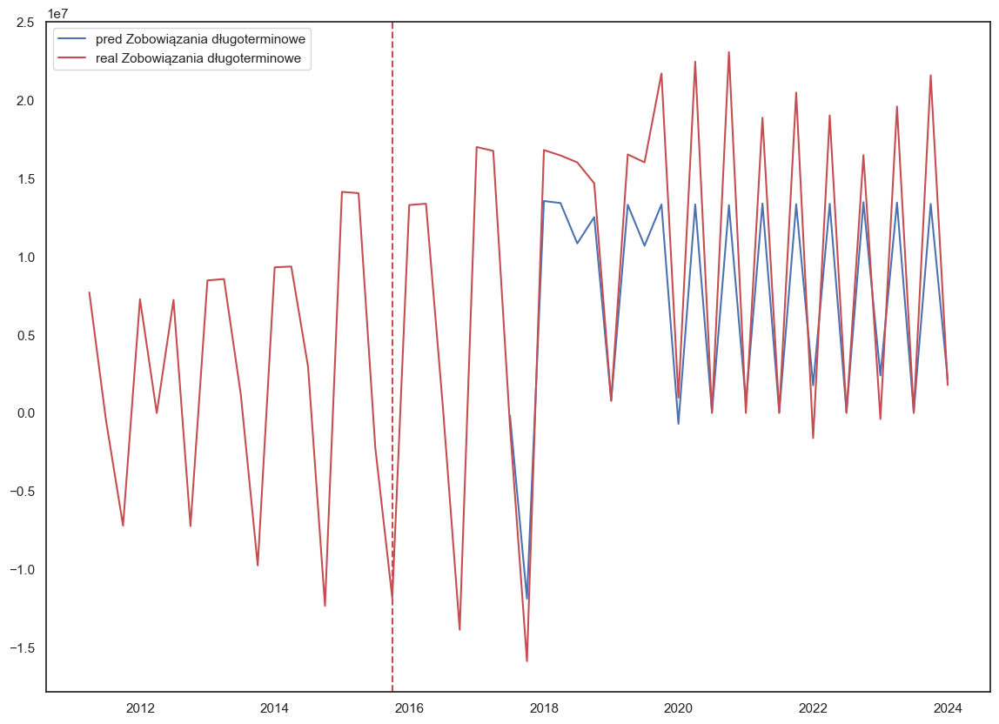

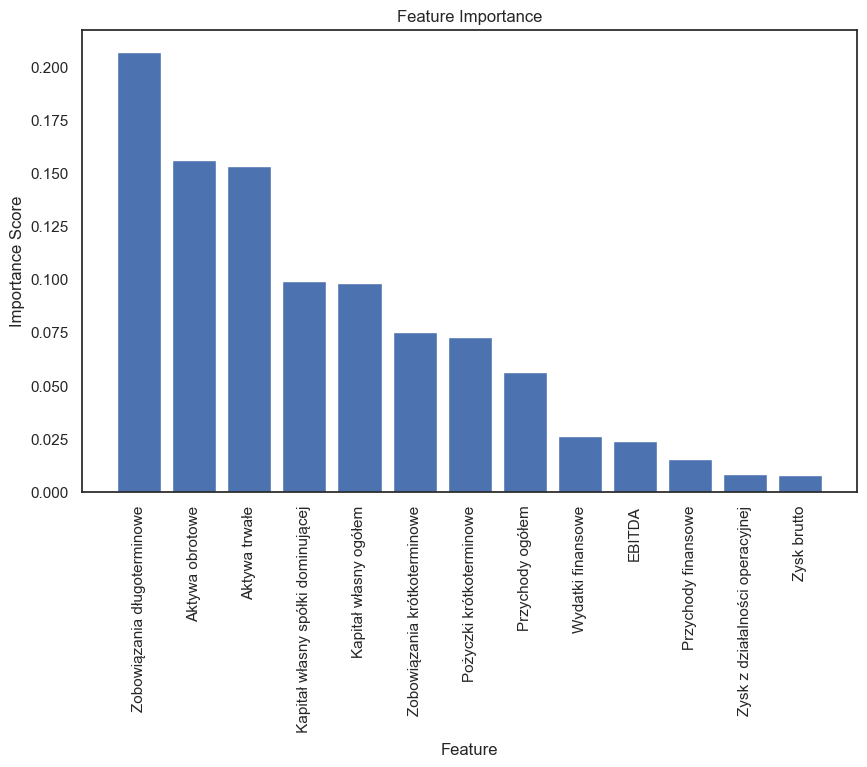

MAPE Zobowiązania krótkoterminowe:  55.02 %


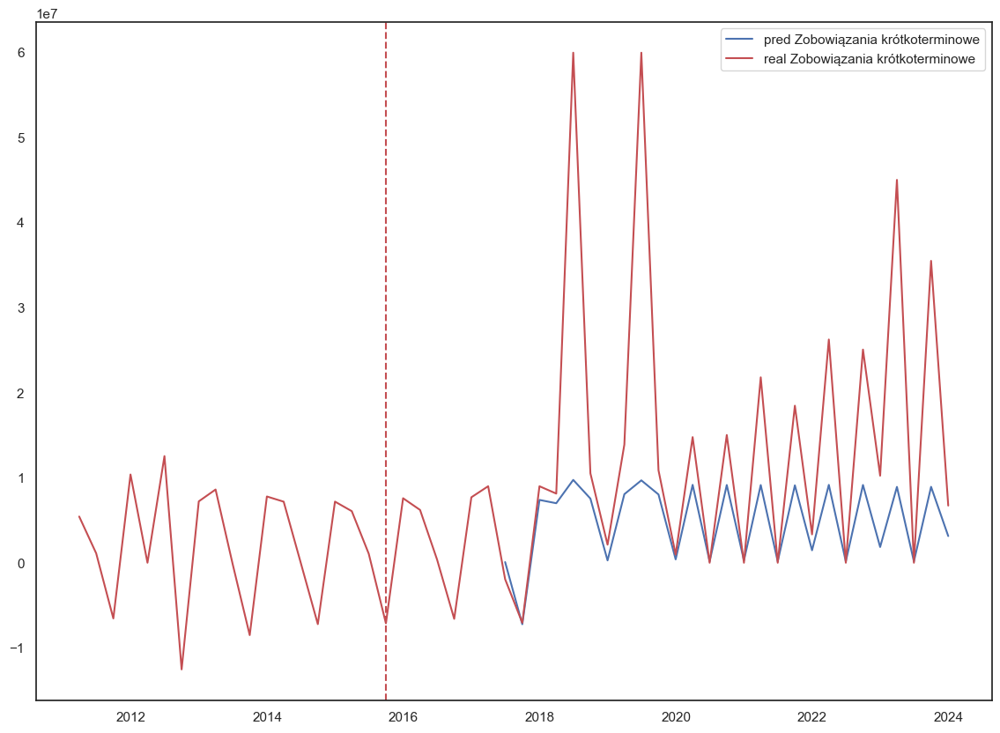

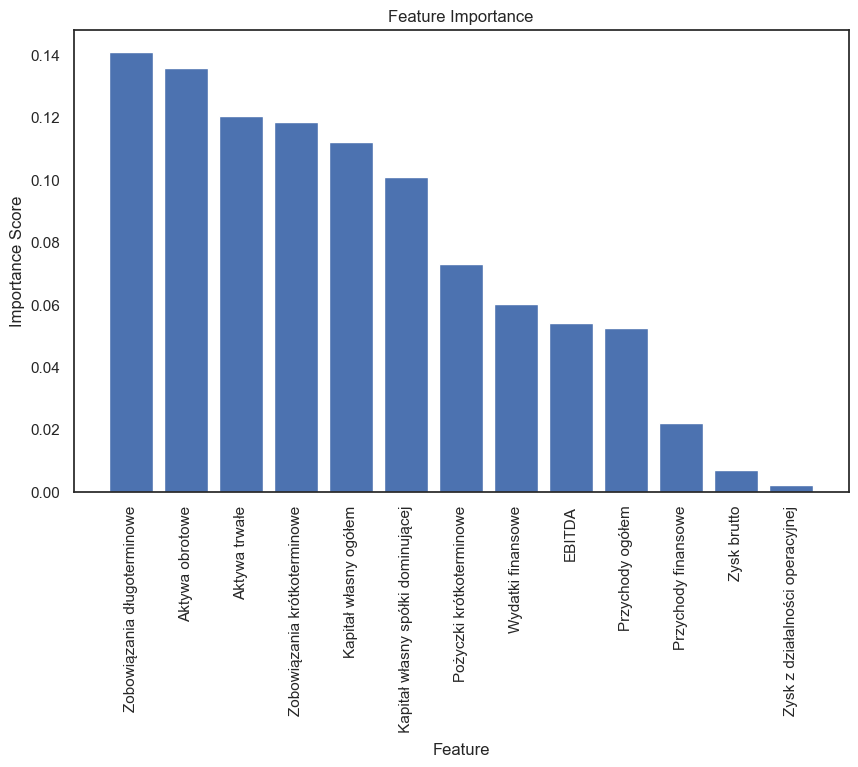

MAPE Pożyczki krótkoterminowe:  71.73 %


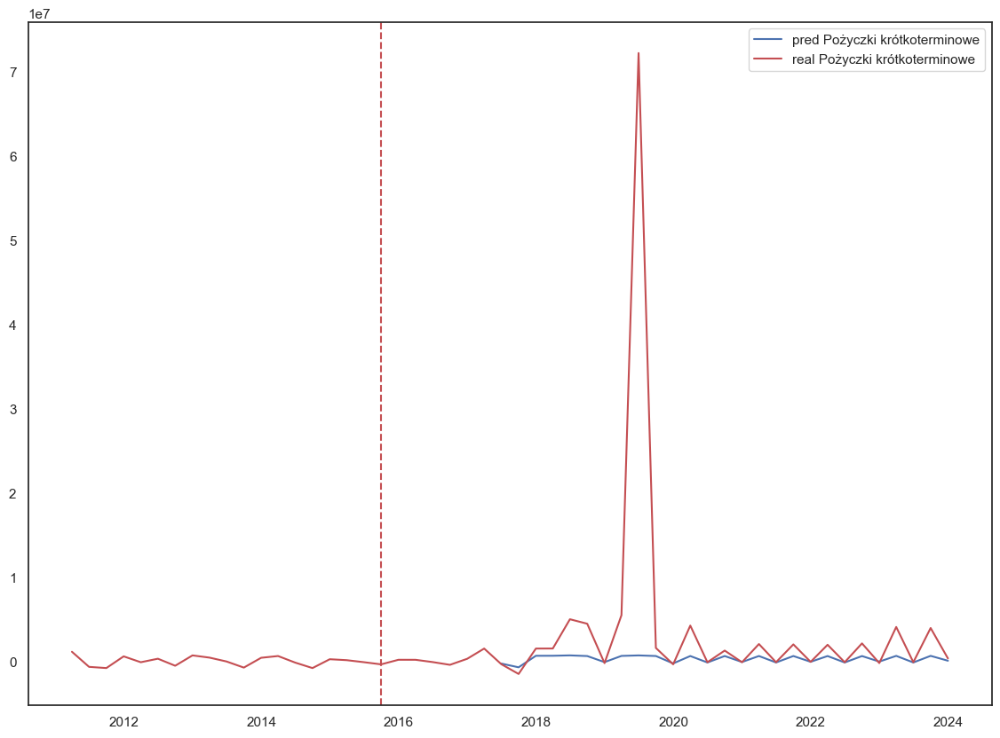

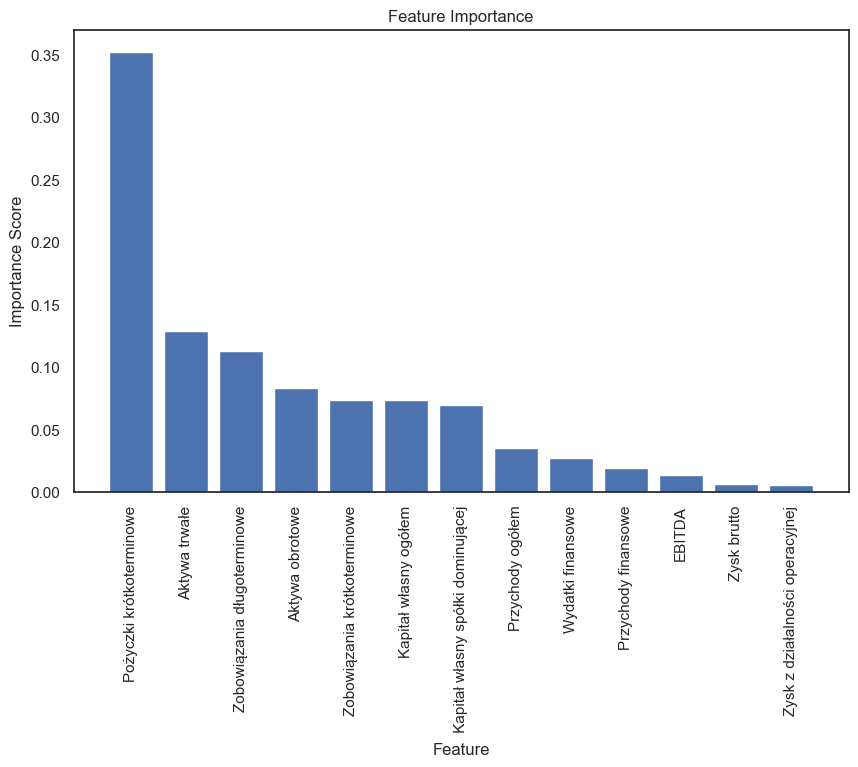

In [23]:
from sklearn.ensemble import RandomForestRegressor
from datetime import datetime

def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """

    df = pd.DataFrame(data={"y_true":y_true[0],"y_pred":y_pred[0]}, index=y_true.index)
    df_filtered = df[df['y_true'] != 0]
    y_true, y_pred = np.array(df_filtered['y_true']), np.array(df_filtered['y_pred'])
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

rf = RandomForestRegressor(n_estimators=1000, random_state=42)
best = list(random_forest_mol.columns)

for i in best:
    labels = np.array(random_forest_mol[f"{i}"])
        
    # Extracting features
    features = random_forest_mol
    features_np = np.array(features)
    
    
                                
    train_l = labels[:24]
    test_l = labels[25:]
        
    train_f = features_np[:24]
    test_f = features_np[25:]
    
    rf.fit(train_f, train_l)
    predictions = rf.predict(test_f)
    predictions = pd.DataFrame(predictions, index=features[25:].index)
    test_l = pd.DataFrame(test_l, random_forest_mol[f"{i}"][25:].index)
    f_list = list(features.columns)
    fig = plt.figure(figsize=(14,10))
    plt.plot(predictions, label=f"pred {i}")
    plt.plot(random_forest_mol[f"{i}"], c='r', label=f"real {i}")

    target_date = '2015-09-30'
    target_x = datetime.strptime(target_date, '%Y-%m-%d')


    plt.axvline(x=target_x, color='r', linestyle='--')
    plt.legend()
    
    mape = mean_absolute_percentage_error(test_l[:-1], predictions[:-1])
    #print("test_l:", test_l[0])
    #print("predictions:", predictions[0])
    print(f"MAPE {i}: ", round(mape,2),"%")

    feature_importances = rf.feature_importances_

    import matplotlib.pyplot as plt
    
    # Sort feature importances in descending order
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_feature_importances = feature_importances[sorted_indices]
    
    # Get the names of the features in the original order
    sorted_feature_names = np.array(f_list)[sorted_indices]
    
    # Plot feature importances
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
    plt.xticks(range(len(sorted_feature_importances)), sorted_feature_names, rotation=90)
    plt.xlabel('Feature')
    plt.ylabel('Importance Score')
    plt.title('Feature Importance')
    plt.show()

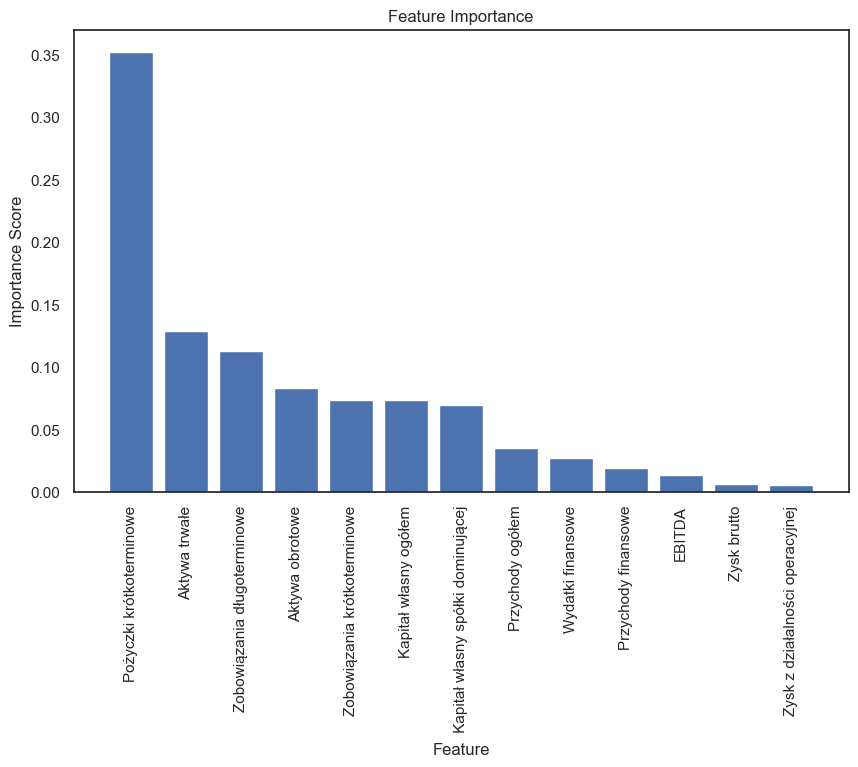

In [34]:
feature_importances = rf.feature_importances_

import matplotlib.pyplot as plt

# Sort feature importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]

# Get the names of the features in the original order
sorted_feature_names = np.array(f_list)[sorted_indices]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
plt.xticks(range(len(sorted_feature_importances)), sorted_feature_names, rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance Score')
plt.title('Feature Importance')
plt.show()

In [32]:
columns_to_drop = list(random_forest_mol.columns)
for i in columns_to_drop:
    if i.endswith("_"):
        random_forest_mol = random_forest_mol.drop(columns=i)

random_forest_mol = random_forest_mol.drop(columns=["Rok", "Q"])

KeyError: "['Rok', 'Q'] not found in axis"

In [65]:
random_forest_mol

,Przychody ogółem,Zysk z działalności operacyjnej,EBITDA,Przychody finansowe,Wydatki finansowe,Zysk brutto,Aktywa trwałe,Aktywa obrotowe,Kapitał własny ogółem,Kapitał własny spółki dominującej,Zobowiązania długoterminowe,Zobowiązania krótkoterminowe,Pożyczki krótkoterminowe
Date,,,,,,,,,,,,,
2011-03-31,7405123,1580370,2239445,0,-9277,1571093,44162539,7922450,38945337,38325164,7706020,5433632,1241806
2011-06-30,6796779,1251540,1917931,0,-48622,1202918,-1010303,1324090,-294126,-286406,-504693,1112606,-549543
2011-09-30,-14201902,-2831910,-4157376,0,57899,-2774011,-43152236,-9246540,-38651211,-38038758,-7201327,-6546238,-692263
2011-12-31,28909711,4264667,6961259,2304397,-457856,6111208,44444933,14317698,41113610,40699616,7275616,10373405,697661
2012-03-31,0,0,0,0,0,0,0,0,0,0,0,0,0
2012-06-30,15326610,3107149,4537915,301751,-179212,3229688,44723014,15265999,40222348,39890161,7230454,12536211,417626
2012-09-30,-15326610,-3107149,-4537915,-301751,179212,-3229688,-44723014,-15265999,-40222348,-39890161,-7230454,-12536211,-417626
2012-12-31,31000043,5868754,9767722,395170,-246164,4610035,45406698,11296906,41011286,40716929,8474881,7217437,811447
2013-03-31,7923278,1547521,2274309,78322,-97622,1528221,45393840,14129302,42351378,42049826,8562435,8609329,548421


Best Parameters Przychody ogółem: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 3, 'max_depth': 5, 'subsample': 0.7}
Best MSE Przychody ogółem: 2868882.429389231


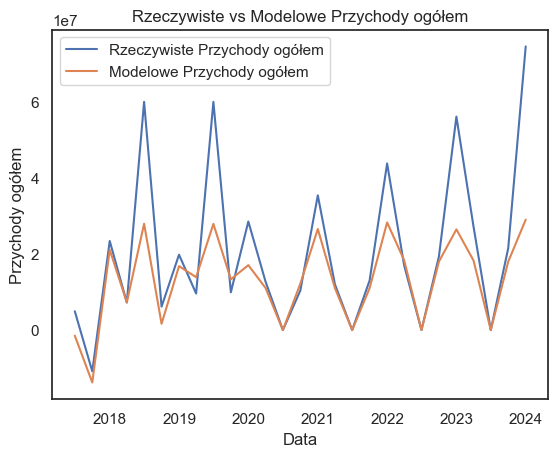

Best Parameters Zysk z działalności operacyjnej: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 4, 'subsample': 0.5}
Best MSE Zysk z działalności operacyjnej: 1563555.0786501896


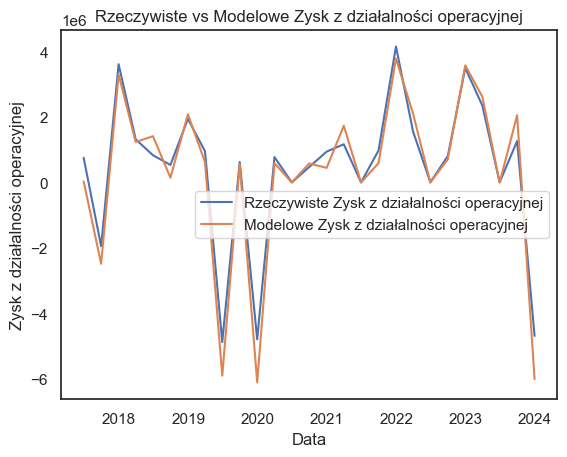

Best Parameters EBITDA: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 3, 'max_depth': 5, 'subsample': 0.7}
Best MSE EBITDA: 943369.9277943164


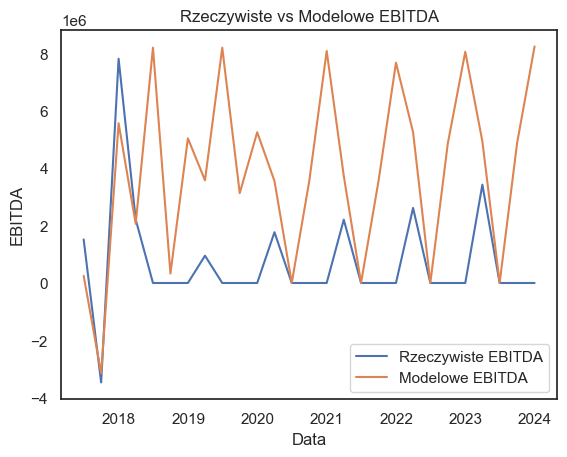

Best Parameters Przychody finansowe: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 5, 'max_depth': 3, 'subsample': 0.7}
Best MSE Przychody finansowe: 58888.714376461074


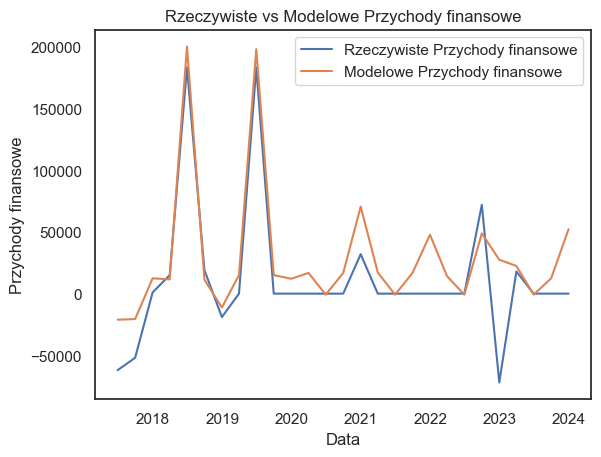

Best Parameters Wydatki finansowe: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 5, 'max_depth': 4, 'subsample': 0.7}
Best MSE Wydatki finansowe: 55979.666511557516


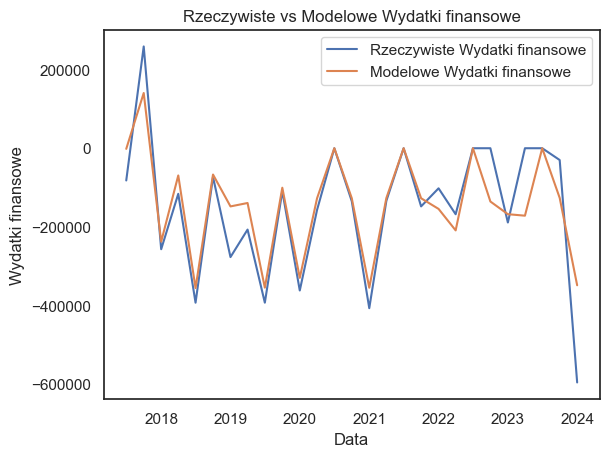

Best Parameters Zysk brutto: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 3, 'max_depth': 3, 'subsample': 0.6}
Best MSE Zysk brutto: 1698273.671475035


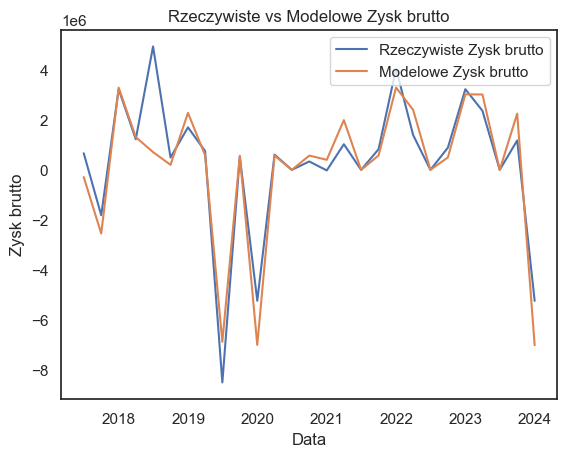

Best Parameters Aktywa trwałe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 1, 'max_depth': 3, 'subsample': 0.8}
Best MSE Aktywa trwałe: 8485811.364710798


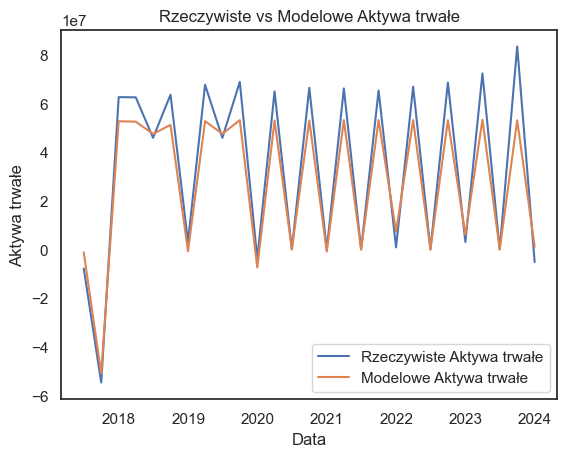

Best Parameters Aktywa obrotowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 5, 'subsample': 0.8}
Best MSE Aktywa obrotowe: 2033165.8336350669


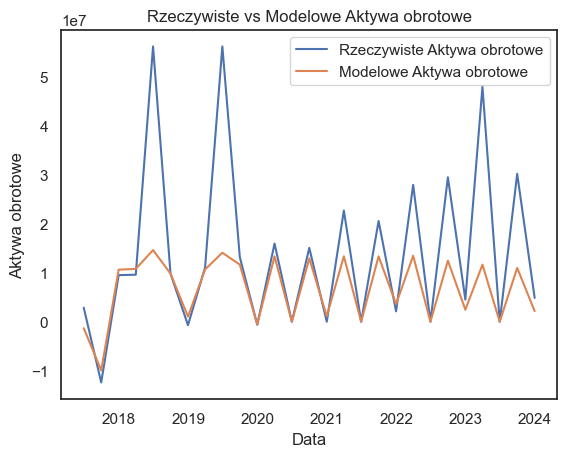

Best Parameters Kapitał własny ogółem: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 0, 'max_depth': 3, 'subsample': 0.8}
Best MSE Kapitał własny ogółem: 7128744.640587871


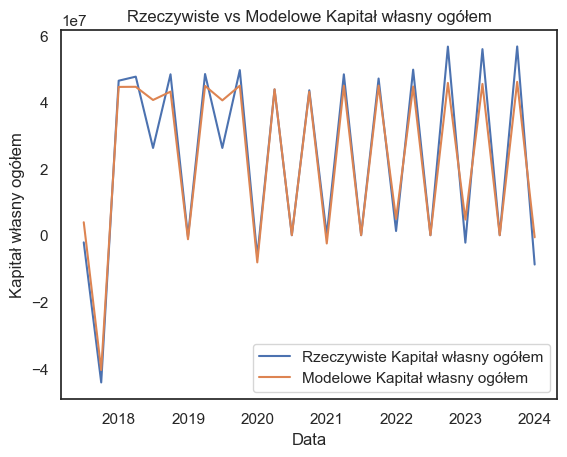

Best Parameters  Kapitał własny spółki dominującej: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 0, 'max_depth': 3, 'subsample': 0.8}
Best MSE  Kapitał własny spółki dominującej: 7189138.248551066


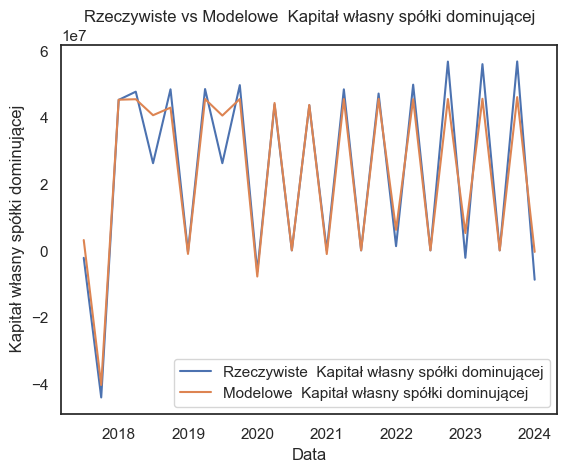

Best Parameters Zobowiązania długoterminowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 1, 'max_depth': 4, 'subsample': 0.8}
Best MSE Zobowiązania długoterminowe: 2240272.4275022675


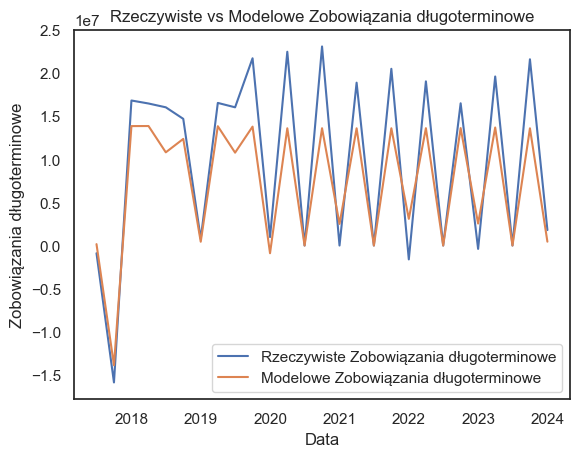

Best Parameters Zobowiązania krótkoterminowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 3, 'subsample': 0.8}
Best MSE Zobowiązania krótkoterminowe: 2273227.2922148798


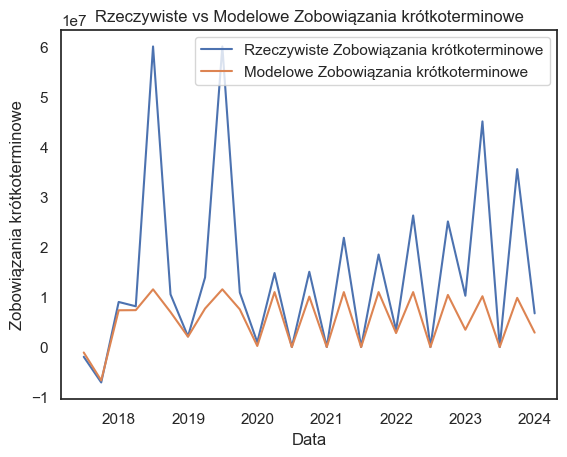

Best Parameters Pożyczki krótkoterminowe: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 0, 'max_depth': 3, 'subsample': 0.8}
Best MSE Pożyczki krótkoterminowe: 175675.51259606265


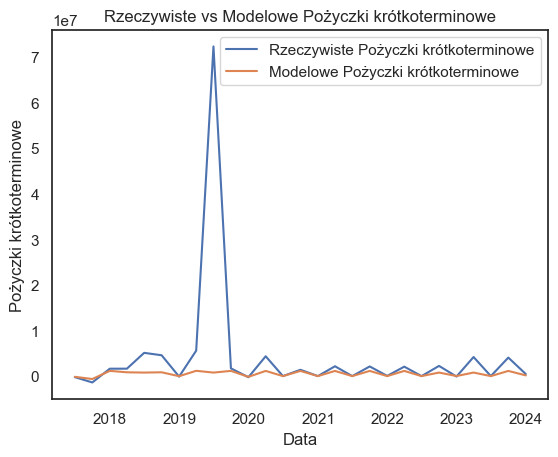

In [35]:
#eXtreme Gradient Boost

#Wydzielam dane na zbiory testowe i treningowe
#W nastepnym kroku stosuje metode krzyzowej walidacji, aby ustalić dla jakich parametrów model ma najlepsze dopasowanie
#za parametr oceny stosuje ujemny pierwiastek ze średniego błędu kwadratowego


import xgboost as xgb
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt

#random_forest_mol = random_forest_mol.drop(columns=["Rok", "Q"], axis=1)
for i in list(random_forest_mol.columns):
    labels = random_forest_mol[f"{i}"]
        
    features = random_forest_mol
    train_l = labels[:24]
    test_l = labels[25:]
        
    train_f = features[:24]
    test_f = features[25:]
        
    
    dtrain = xgb.DMatrix(train_f, label=train_l.to_numpy().reshape(-1,1))
    dtest = xgb.DMatrix(test_f, label=test_l.to_numpy().reshape(-1,1))
    
    param_grid = {
        'max_depth': [3,4,5,6,7,8,9,10],
        'eta': [0.01, 0.2],
        'subsample': [0.5,0.6,0.7,0.8,],
        'colsample_bytree': [0.8, 1.0],
        'lambda' : [0, 1, 3, 5]
    }
    
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror')
    
    grid_search = GridSearchCV(estimator=xgb_regressor, param_grid=param_grid, scoring='neg_root_mean_squared_error', cv=5)
    grid_search.fit(train_f, train_l)
    
    best_params = grid_search.best_params_
    
    print(f"Best Parameters {i}:", grid_search.best_params_)
    print(f"Best MSE {i}:", -grid_search.best_score_)

    num_rounds = 100
    model = xgb.train(best_params, dtrain, num_rounds)


    predictions_train = model.predict(dtrain)
    forecast_train = pd.DataFrame(predictions_train, columns=[f"{i}"])
    forecast_train.index = features[:24].index
    
    predictions_test = model.predict(dtest)
    forecast_test = pd.DataFrame(predictions_test, columns=[f"{i}"])
    forecast_test.index = features[25:].index

    actual_values = labels[25:]

    plt.plot(actual_values, label=f'Rzeczywiste {i}')
    plt.plot(forecast_test, label=f'Modelowe {i}')
        
    plt.xlabel('Data')
    plt.ylabel(f'{i}')
    plt.title(f'Rzeczywiste vs Modelowe {i}')
    plt.legend()
        
    plt.show()


#Zgodnie z metodą wychodzi, że powinnienem ustawić model na anstępujące parametry:
#- colsample_bytree: 1
#- eta: 0.2
#- lambda: 0.1
#- max_depth: 4
#- subsample: 0.6
#Dla podanych parametrów dopasowany model osiąga średni błąd kwadratowy 437309727.4168719


Przychody ogółem
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 125211559067648.0000 - mae: 9683621.0000 - val_loss: 648923924398080.0000 - val_mae: 15493449.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 101460809351168.0000 - mae: 9030903.0000 - val_loss: 623284378927104.0000 - val_mae: 15313412.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 82650429652992.0000 - mae: 8382321.5000 - val_loss: 604387663675392.0000 - val_mae: 15589388.0000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 68586701848576.0000 - mae: 7832229.5000 - val_loss: 591262646272000.0000 - val_mae: 15954622.0000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 58720037896192.0000 - mae: 7320818.5000 - val_loss: 582445749501952.0000 - val_mae: 16257157.0000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 52189712089088.0000 - mae: 6821298.5000 - val_loss: 575511591911424.0000 - val_mae: 16418738.0000
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

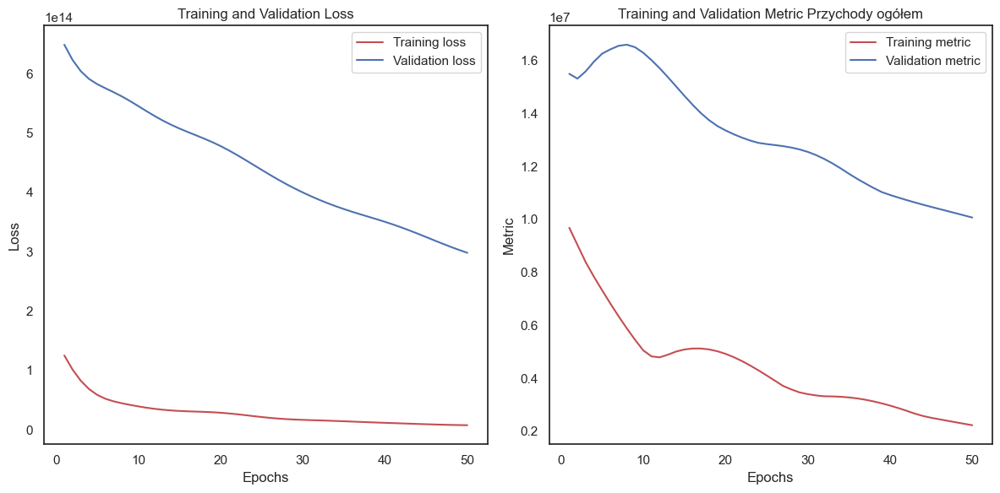

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 7363750789120.0000 - mae: 2180942.5000
Test accuracy: 2180942.5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


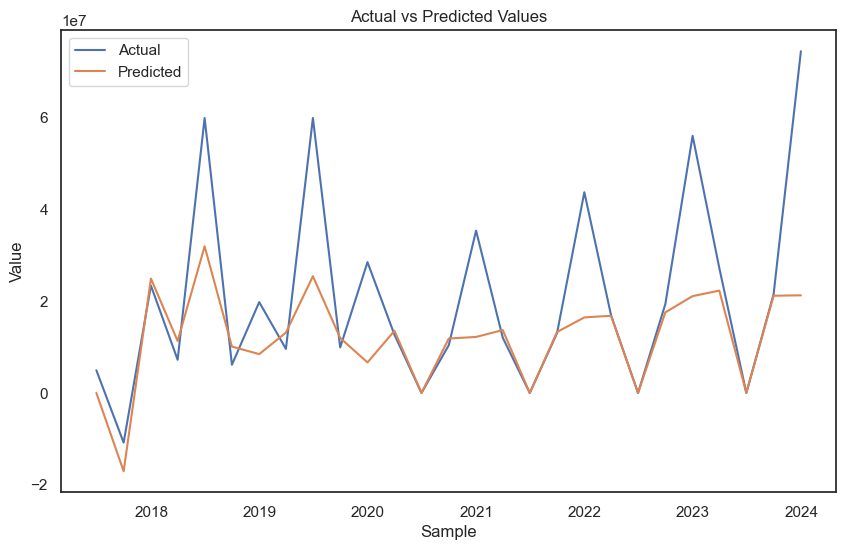

MAPE Przychody ogółem:  inf %
Zysk z działalności operacyjnej
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 22792288337920.0000 - mae: 3695514.7500 - val_loss: 8547007987712.0000 - val_mae: 1916479.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 14281501310976.0000 - mae: 3125200.0000 - val_loss: 10983217037312.0000 - val_mae: 2386535.7500
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 9339824766976.0000 - mae: 2439847.2500 - val_loss: 18202786529280.0000 - val_mae: 3349282.0000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 7149328007168.0000 - mae: 2011015.0000 - val_loss: 28072451506176.0000 - val_mae: 4242527.5000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 7306132062208.0000 - mae: 1953156.5000 - val_loss: 37235596460032.0000 - val_mae: 4899517.0000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 8560983932928.0000 - mae: 2048409.1250 - val_loss: 42855556972544.0000 - val_mae: 5247755.5000
Epoch 6: early stopping
Res

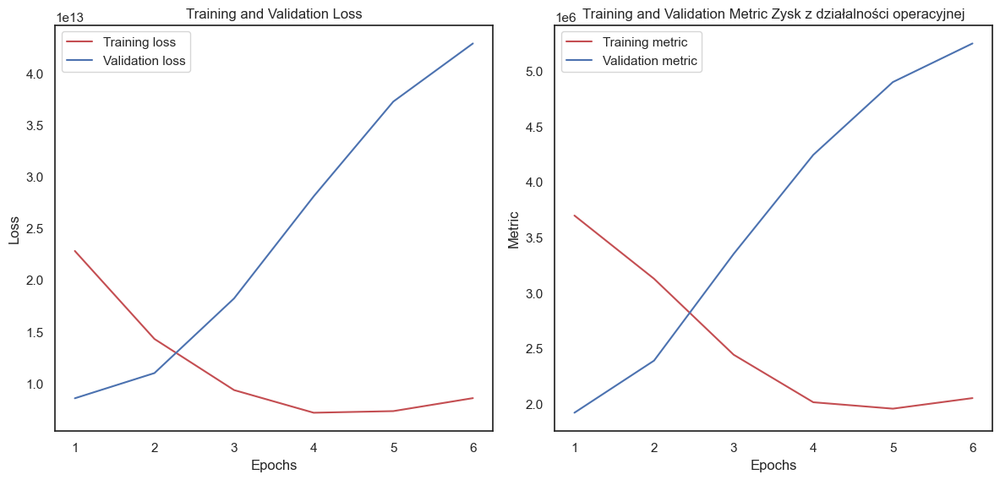

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 14281501310976.0000 - mae: 3125199.7500
Test accuracy: 3125199.75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


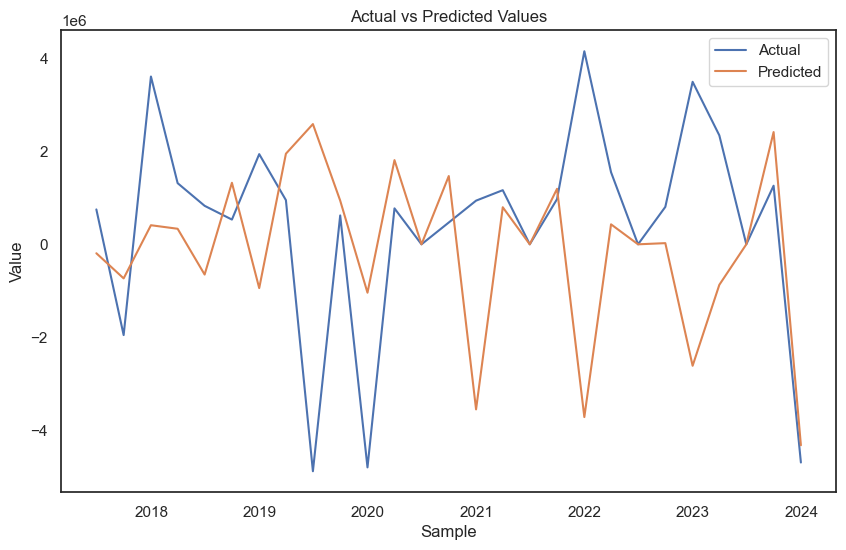

MAPE Zysk z działalności operacyjnej:  inf %
EBITDA
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 94598441467904.0000 - mae: 7639064.5000 - val_loss: 50826403905536.0000 - val_mae: 5758952.5000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 67325843734528.0000 - mae: 6175854.5000 - val_loss: 33778237964288.0000 - val_mae: 4929255.5000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 45715824836608.0000 - mae: 5123676.5000 - val_loss: 25017062522880.0000 - val_mae: 4113004.5000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 29044995260416.0000 - mae: 4306654.0000 - val_loss: 23683336765440.0000 - val_mae: 3414099.2500
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 16453544706048.0000 - mae: 3345447.2500 - val_loss: 28857316933632.0000 - val_mae: 3326691.0000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 7724359745536.0000 - mae: 2311484.0000 - val_loss: 39504337436672.0000 - val_mae: 4205278.0000
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━

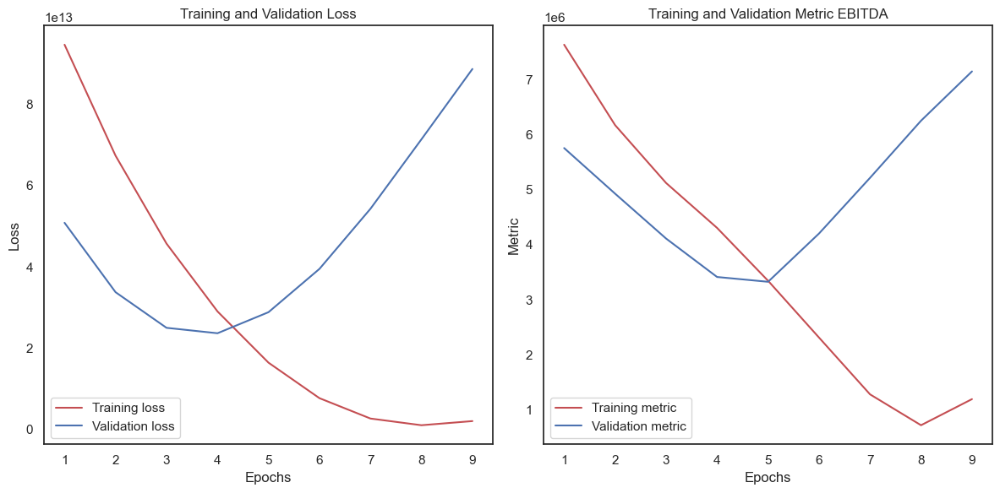

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 16453544706048.0000 - mae: 3345447.2500
Test accuracy: 3345447.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


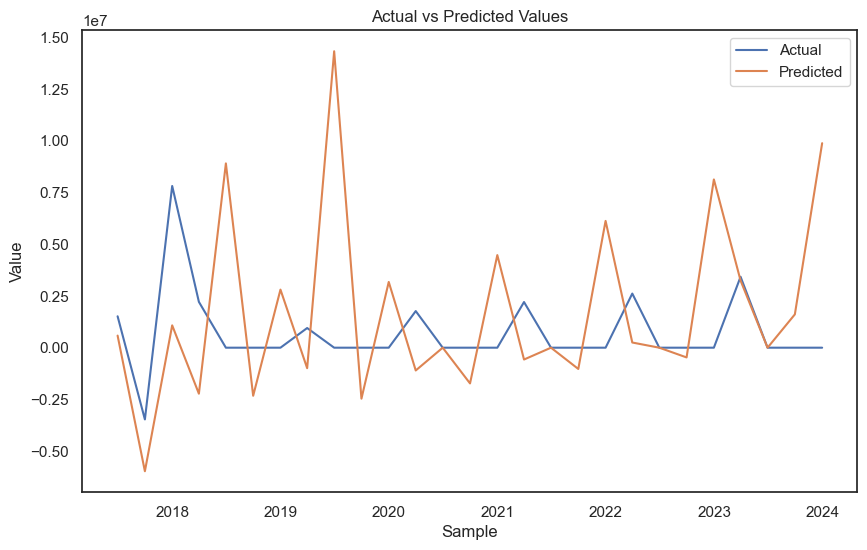

MAPE EBITDA:  inf %
Przychody finansowe
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 57173392490496.0000 - mae: 6484521.5000 - val_loss: 48392096972800.0000 - val_mae: 5181231.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 34944424345600.0000 - mae: 5007916.5000 - val_loss: 39421176971264.0000 - val_mae: 4317638.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 18654502584320.0000 - mae: 3552517.7500 - val_loss: 38379135696896.0000 - val_mae: 3622666.0000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 8225372504064.0000 - mae: 2147500.0000 - val_loss: 44159134072832.0000 - val_mae: 3336999.0000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 3170605727744.0000 - mae: 1057504.8750 - val_loss: 54992736092160.0000 - val_mae: 3663643.5000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 2444677611520.0000 - mae: 1278331.8750 - val_loss: 68116201603072.0000 - val_mae: 4372426.5000
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/st

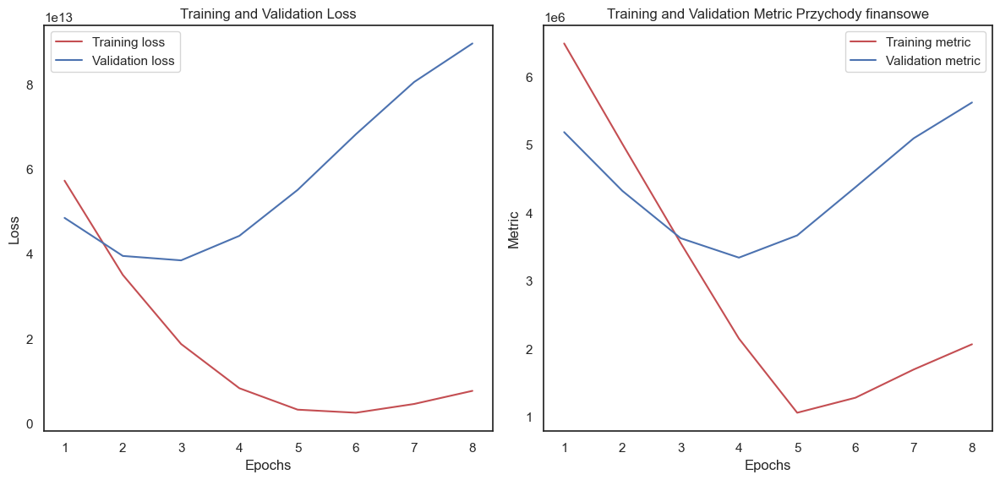

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 8225373552640.0000 - mae: 2147499.7500
Test accuracy: 2147499.75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


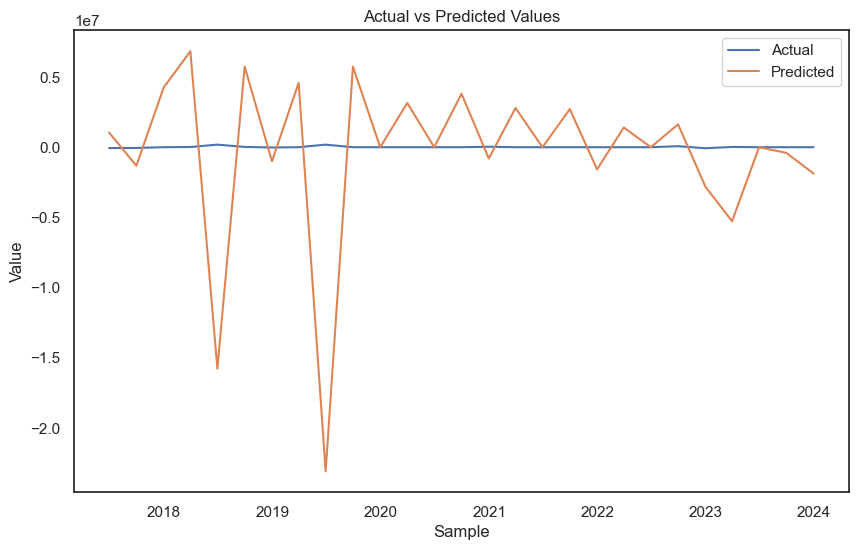

MAPE Przychody finansowe:  inf %
Wydatki finansowe
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 7247790342144.0000 - mae: 2355682.7500 - val_loss: 11092980924416.0000 - val_mae: 2205387.2500
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 1768542961664.0000 - mae: 1130605.3750 - val_loss: 12941856342016.0000 - val_mae: 1989405.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 1002583949312.0000 - mae: 639696.3125 - val_loss: 15826506743808.0000 - val_mae: 2477046.5000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 2372963401728.0000 - mae: 1259377.8750 - val_loss: 16067850141696.0000 - val_mae: 2563523.7500
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 3005480960000.0000 - mae: 1462019.1250 - val_loss: 14176295583744.0000 - val_mae: 2270658.5000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 2464150454272.0000 - mae: 1285182.8750 - val_loss: 11742661836800.0000 - val_mae: 1916854.2500
Epoch 6: early stopping
Restoring model 

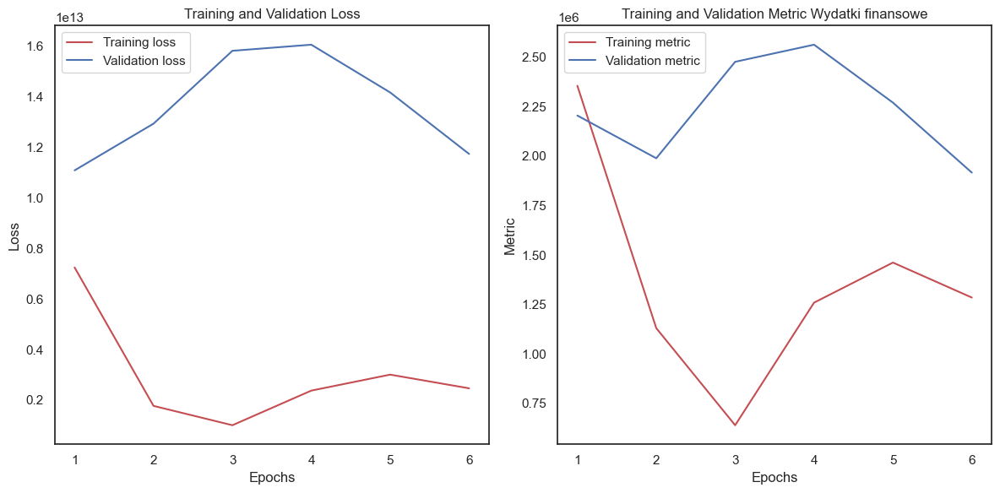

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 1768542961664.0000 - mae: 1130605.3750
Test accuracy: 1130605.375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


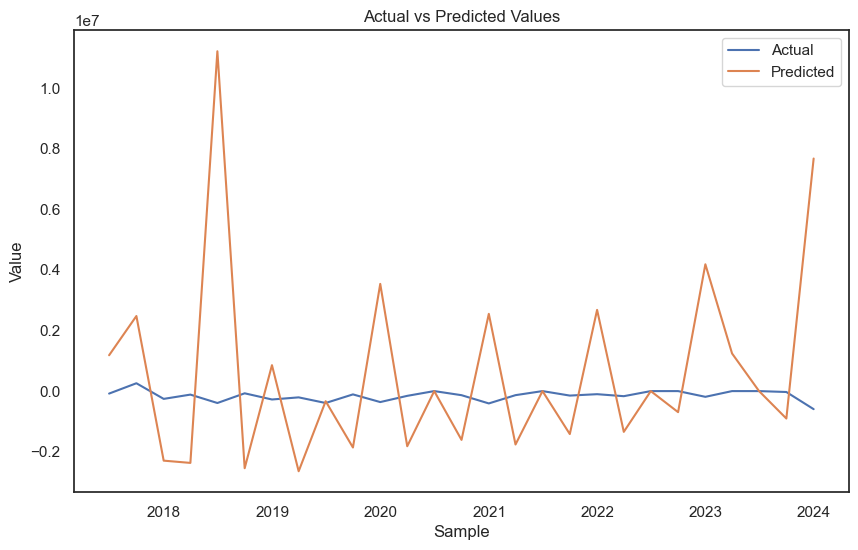

MAPE Wydatki finansowe:  inf %
Zysk brutto
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 50045416112128.0000 - mae: 6126106.5000 - val_loss: 57058623750144.0000 - val_mae: 6166674.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 33447106052096.0000 - mae: 4958700.5000 - val_loss: 36380138799104.0000 - val_mae: 4883292.5000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 21523630915584.0000 - mae: 3820820.7500 - val_loss: 21561398525952.0000 - val_mae: 3663033.7500
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 14073525698560.0000 - mae: 2963123.2500 - val_loss: 12180038615040.0000 - val_mae: 2687629.7500
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 10653011017728.0000 - mae: 2617844.7500 - val_loss: 7439533998080.0000 - val_mae: 2008618.3750
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 10331555364864.0000 - mae: 2422330.0000 - val_loss: 6039514644480.0000 - val_mae: 1697396.7500
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms

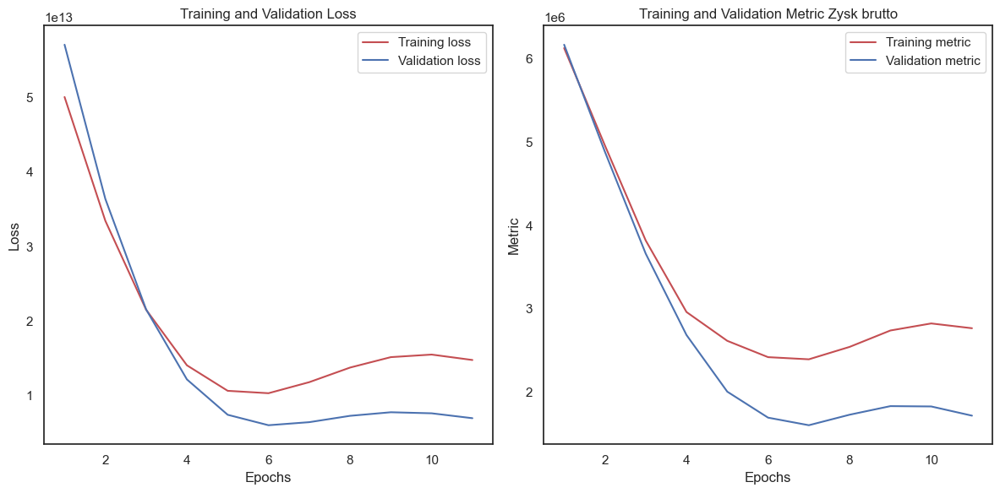

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 11814556401664.0000 - mae: 2396434.7500
Test accuracy: 2396434.75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


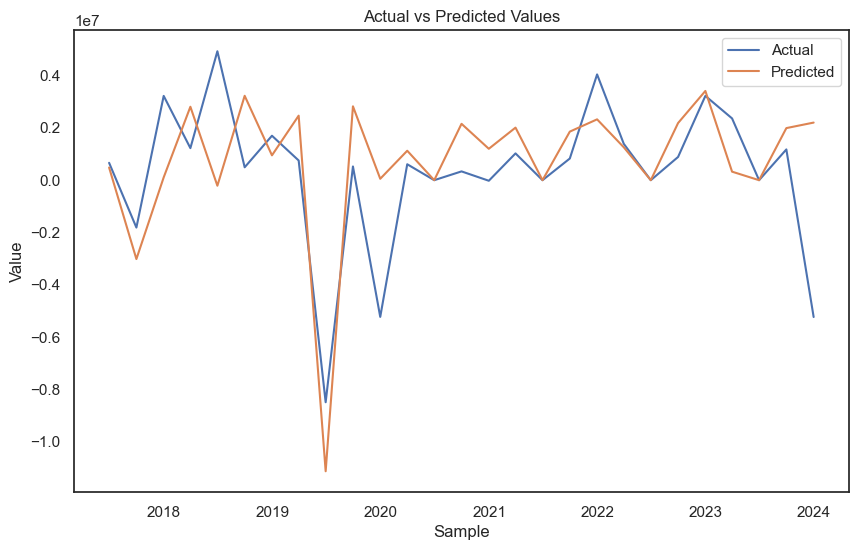

MAPE Zysk brutto:  inf %
Aktywa trwałe
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1913814744301568.0000 - mae: 37727644.0000 - val_loss: 2105329215078400.0000 - val_mae: 36331768.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 1781290575593472.0000 - mae: 36364720.0000 - val_loss: 1950909571530752.0000 - val_mae: 35038860.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 1654104245927936.0000 - mae: 35016932.0000 - val_loss: 1802888892383232.0000 - val_mae: 33746600.0000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 1532035369795584.0000 - mae: 33672204.0000 - val_loss: 1661429581086720.0000 - val_mae: 32456648.0000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 1415040863305728.0000 - mae: 32329550.0000 - val_loss: 1526909997416448.0000 - val_mae: 31173072.0000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 1303627532599296.0000 - mae: 30995094.0000 - val_loss: 1398973927522304.0000 - val_mae: 29902312.0000
Epoch 7/5

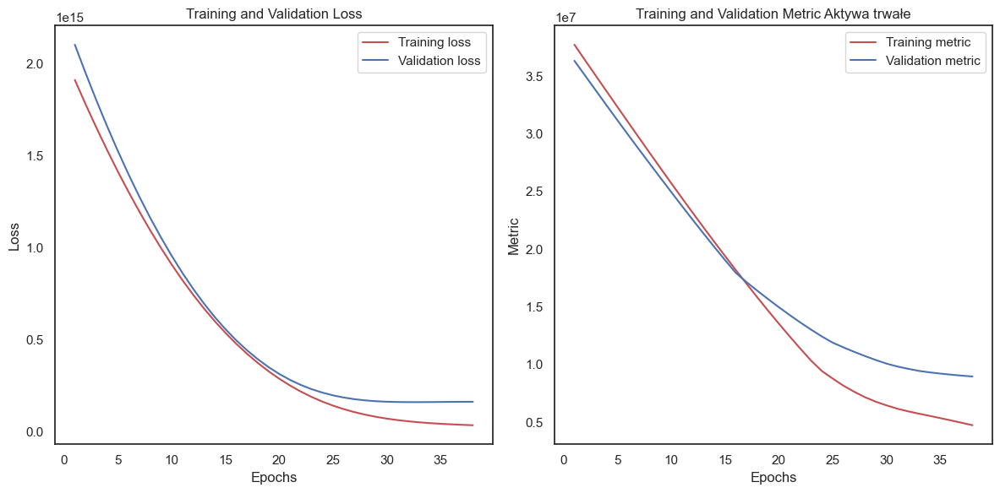

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 46944382615552.0000 - mae: 5546807.0000
Test accuracy: 5546807.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


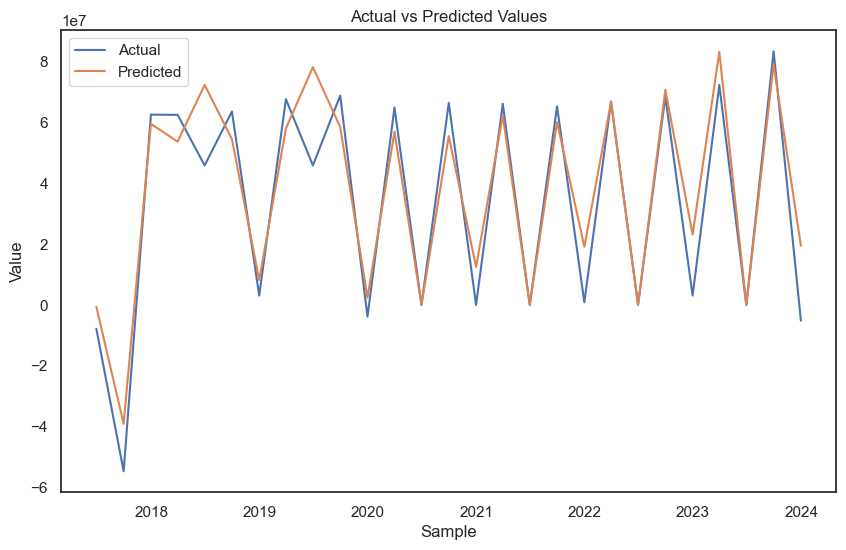

MAPE Aktywa trwałe:  inf %
Aktywa obrotowe
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 226705167876096.0000 - mae: 12112496.0000 - val_loss: 261619426787328.0000 - val_mae: 10653298.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 188221489152000.0000 - mae: 10815107.0000 - val_loss: 215752984494080.0000 - val_mae: 9385641.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 154477810155520.0000 - mae: 9522049.0000 - val_loss: 176398064943104.0000 - val_mae: 8160636.0000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 125555005456384.0000 - mae: 8246566.5000 - val_loss: 143704002134016.0000 - val_mae: 7038039.5000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 101270119514112.0000 - mae: 7004058.5000 - val_loss: 117708184092672.0000 - val_mae: 6395604.5000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 81457041113088.0000 - mae: 5807205.5000 - val_loss: 97781599436800.0000 - val_mae: 5923834.0000
Epoch 7/50
1/1 ━━━━━━━━━━━━━

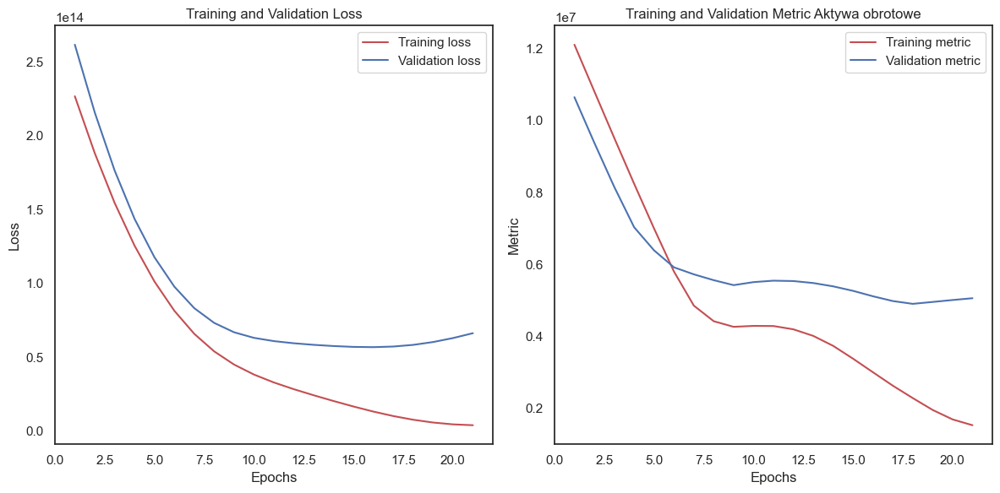

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 10183714537472.0000 - mae: 2631817.7500
Test accuracy: 2631817.75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


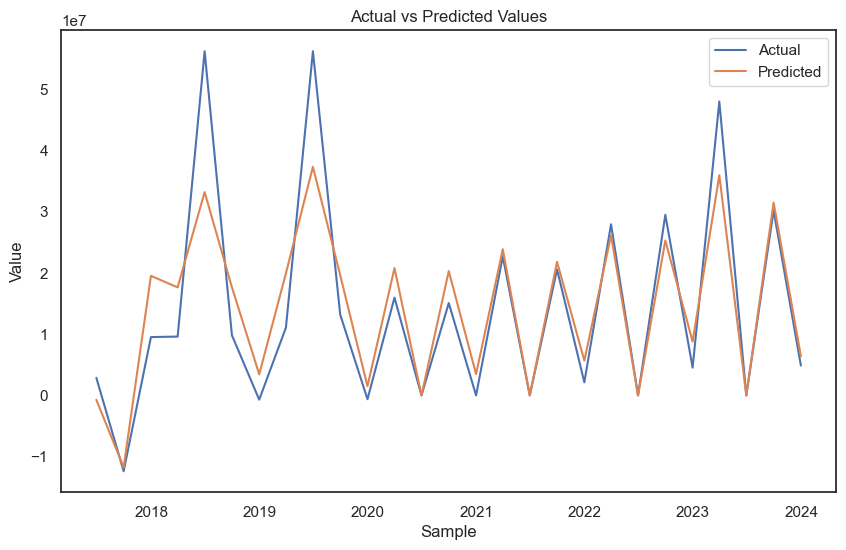

MAPE Aktywa obrotowe:  inf %
Kapitał własny ogółem
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1761314951135232.0000 - mae: 36368340.0000 - val_loss: 1883372552978432.0000 - val_mae: 33580636.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 1646200969232384.0000 - mae: 35106196.0000 - val_loss: 1756556798459904.0000 - val_mae: 32410816.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 1535667301515264.0000 - mae: 33849188.0000 - val_loss: 1634531140435968.0000 - val_mae: 31240912.0000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 1429956076765184.0000 - mae: 32603472.0000 - val_loss: 1517455432220672.0000 - val_mae: 30083082.0000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 1328997233328128.0000 - mae: 31366992.0000 - val_loss: 1405102711635968.0000 - val_mae: 28930768.0000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 1232955993227264.0000 - mae: 30152886.0000 - val_loss: 1297698867118080.0000 - val_mae: 27800486

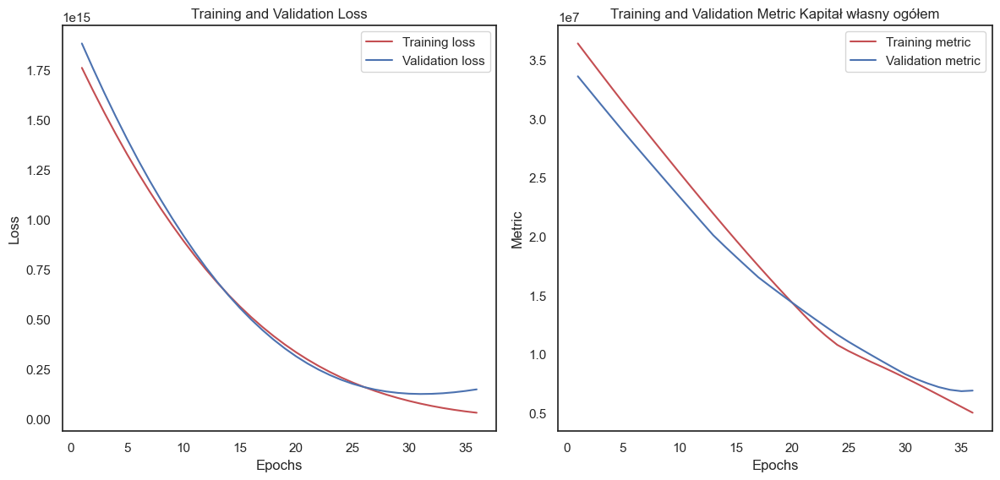

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 65883355480064.0000 - mae: 7018628.0000
Test accuracy: 7018628.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


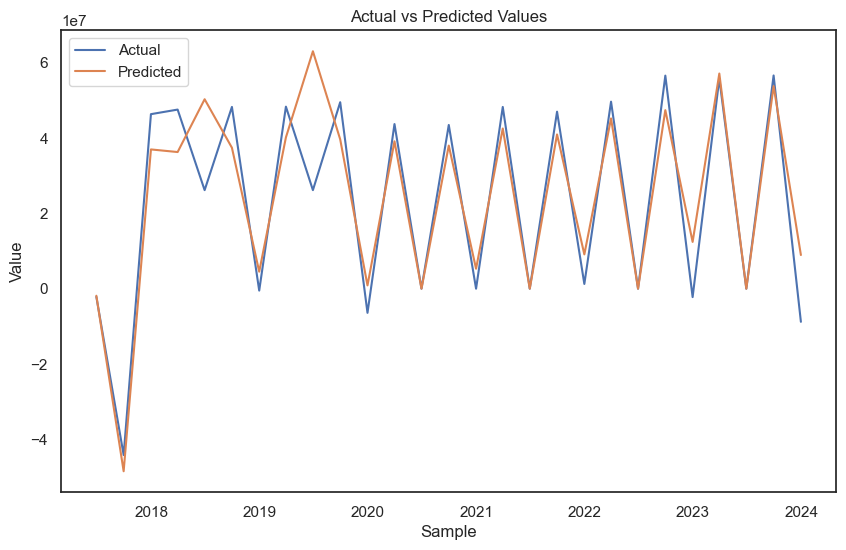

MAPE Kapitał własny ogółem:  inf %
 Kapitał własny spółki dominującej
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1251195377156096.0000 - mae: 30847150.0000 - val_loss: 1354976014106624.0000 - val_mae: 29054262.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 1150074264485888.0000 - mae: 29576266.0000 - val_loss: 1240189523460096.0000 - val_mae: 27850254.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 1053048470241280.0000 - mae: 28302198.0000 - val_loss: 1131706031538176.0000 - val_mae: 26651204.0000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 960275230490624.0000 - mae: 27025680.0000 - val_loss: 1029425814568960.0000 - val_mae: 25457502.0000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 872308059144192.0000 - mae: 25755094.0000 - val_loss: 933251833135104.0000 - val_mae: 24269224.0000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 789165679575040.0000 - mae: 24490648.0000 - val_loss: 843141473107968.0000 - val_ma

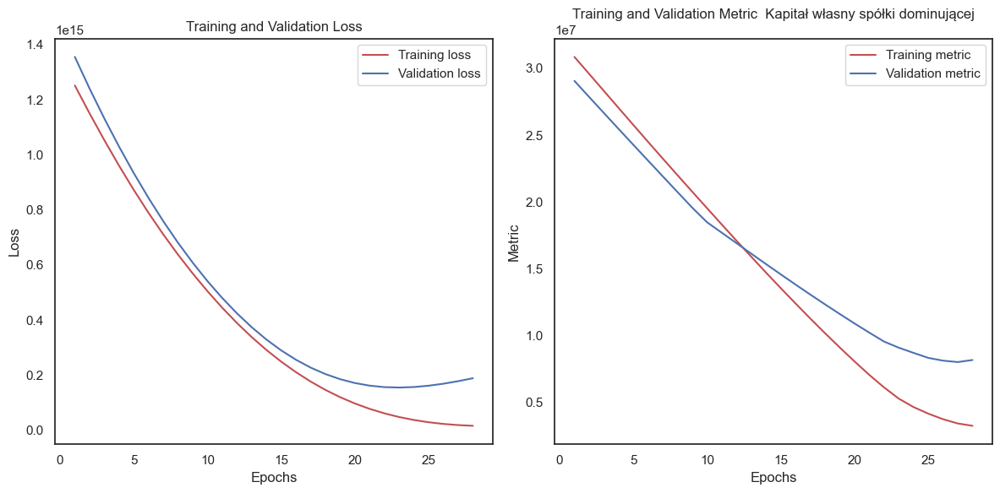

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 38019201499136.0000 - mae: 4663107.5000
Test accuracy: 4663107.5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


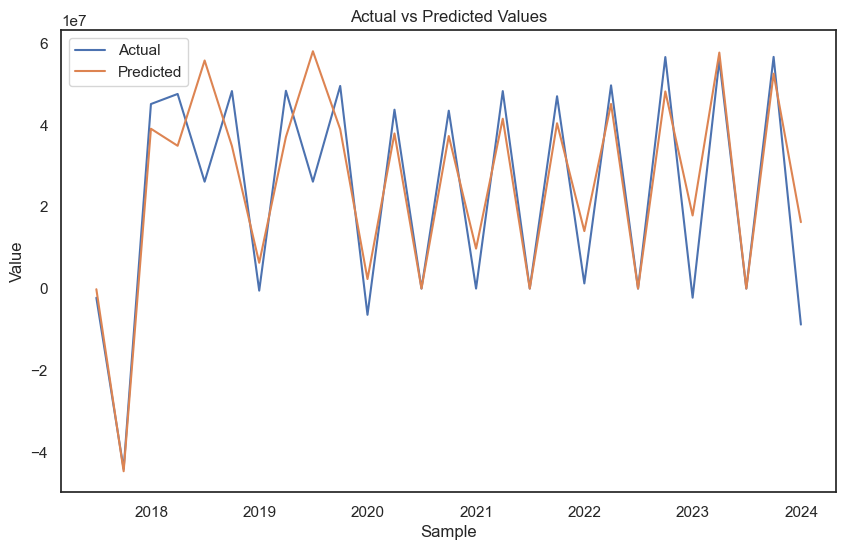

MAPE  Kapitał własny spółki dominującej:  inf %
Zobowiązania długoterminowe
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 83813979914240.0000 - mae: 6757688.5000 - val_loss: 187708978757632.0000 - val_mae: 10904679.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 60006200246272.0000 - mae: 5565527.5000 - val_loss: 153839504195584.0000 - val_mae: 9925019.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 41890481176576.0000 - mae: 4553143.0000 - val_loss: 128517115215872.0000 - val_mae: 9099061.0000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 28427899895808.0000 - mae: 3733320.7500 - val_loss: 111428849631232.0000 - val_mae: 8441087.0000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 19153169678336.0000 - mae: 3231936.2500 - val_loss: 101485245366272.0000 - val_mae: 7823773.5000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 13943599792128.0000 - mae: 2877710.7500 - val_loss: 97501143105536.0000 - val_mae: 7405097.0000
Ep

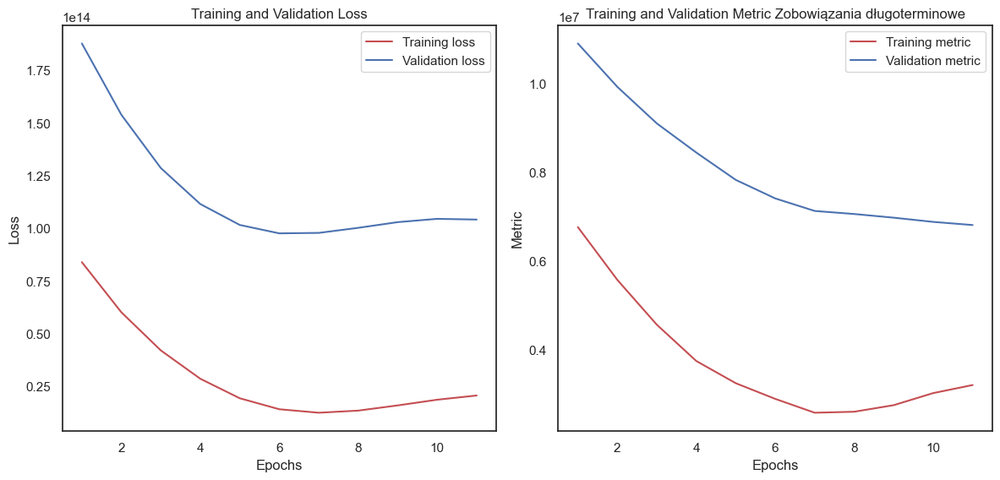

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 12282054574080.0000 - mae: 2565006.7500
Test accuracy: 2565006.75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


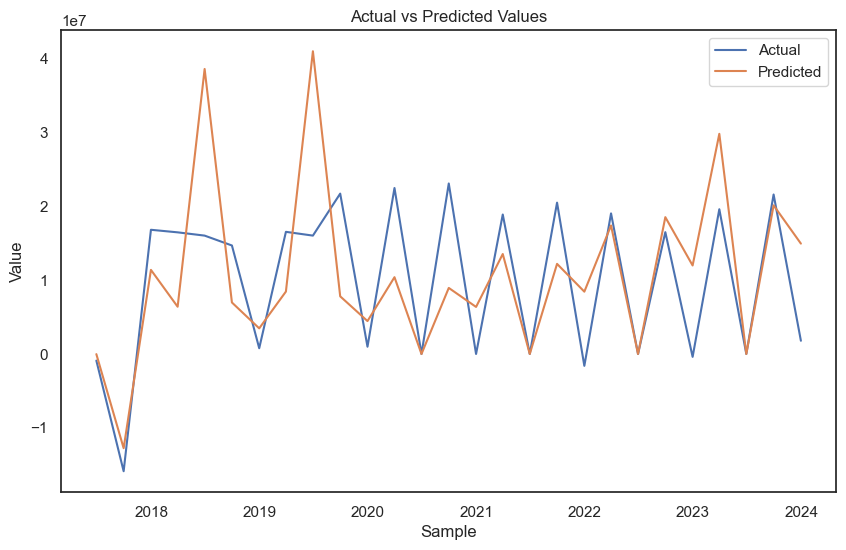

MAPE Zobowiązania długoterminowe:  inf %
Zobowiązania krótkoterminowe
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 89985780809728.0000 - mae: 8174776.0000 - val_loss: 409427890929664.0000 - val_mae: 14338951.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 63087734423552.0000 - mae: 6817864.0000 - val_loss: 340101750063104.0000 - val_mae: 12908229.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 41469821845504.0000 - mae: 5473522.0000 - val_loss: 279720818114560.0000 - val_mae: 11510081.0000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 25126865207296.0000 - mae: 4146089.7500 - val_loss: 228469812232192.0000 - val_mae: 10163454.0000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 14001126768640.0000 - mae: 2866633.7500 - val_loss: 186302058201088.0000 - val_mae: 8904247.0000
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 7743558123520.0000 - mae: 2064594.0000 - val_loss: 153313773355008.0000 - val_mae: 7847842.5000
Epoch

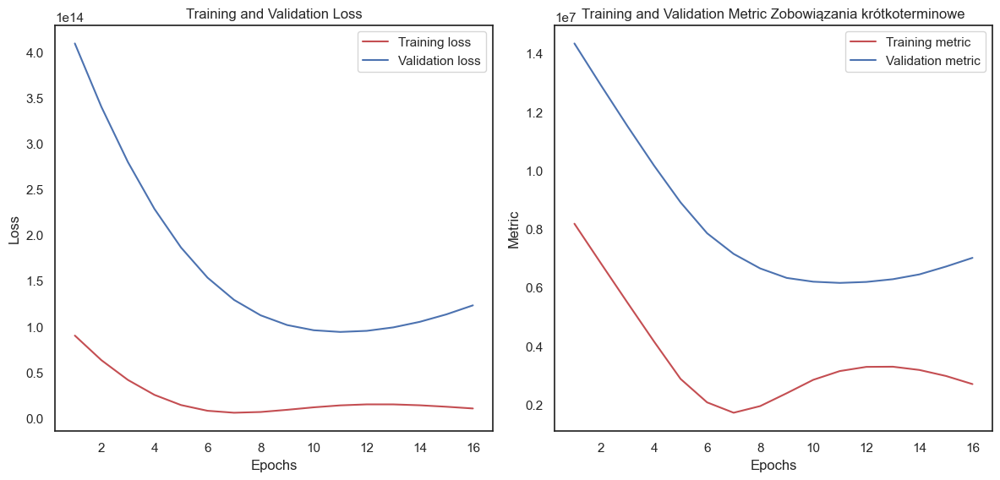

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 14738714001408.0000 - mae: 3278730.0000
Test accuracy: 3278730.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


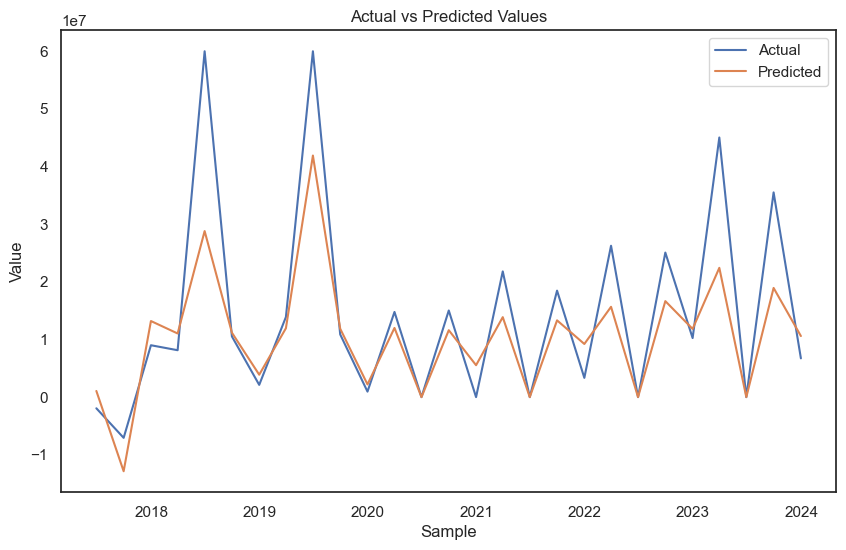

MAPE Zobowiązania krótkoterminowe:  inf %
Pożyczki krótkoterminowe
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 70230600581120.0000 - mae: 6083548.0000 - val_loss: 139395814391808.0000 - val_mae: 8062019.0000
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step - loss: 47263845974016.0000 - mae: 5046340.5000 - val_loss: 118471841021952.0000 - val_mae: 6695634.0000
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 29020238381056.0000 - mae: 3874044.0000 - val_loss: 106840608210944.0000 - val_mae: 5437929.5000
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 16059766669312.0000 - mae: 2949604.0000 - val_loss: 102859727175680.0000 - val_mae: 4281158.0000
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 7557272305664.0000 - mae: 1953118.6250 - val_loss: 105462074703872.0000 - val_mae: 3285689.2500
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 3075725852672.0000 - mae: 1167676.0000 - val_loss: 113152238813184.0000 - val_mae: 3117926.7500
Epoch 7/50
1

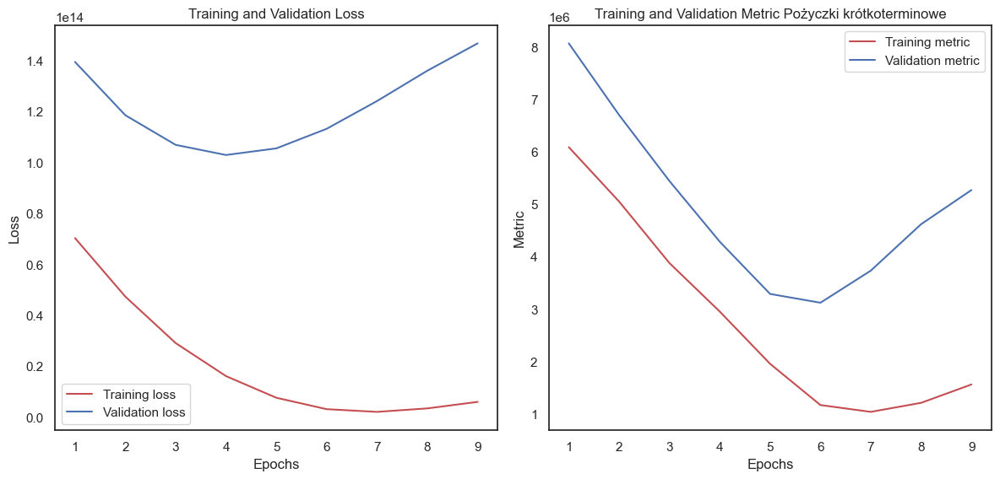

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 7557272305664.0000 - mae: 1953118.6250
Test accuracy: 1953118.625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


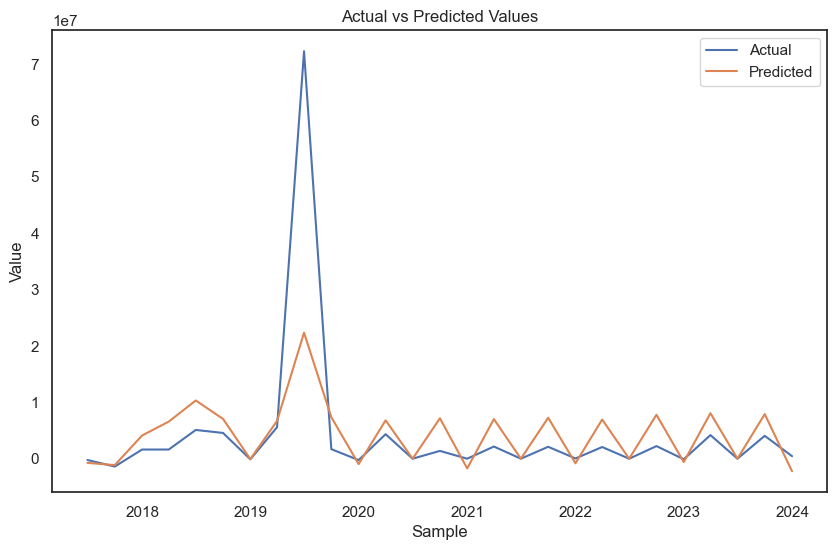

MAPE Pożyczki krótkoterminowe:  inf %


In [39]:
#Sieć neuronowa
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping



for i in list(random_forest_mol.columns):
    print(f"{i}")
    labels = random_forest_mol[f"{i}"]
            
    features = random_forest_mol
    train_l = labels[:24]
    test_l = labels[25:]
            
    train_f = features[:24]
    test_f = features[25:]
    
    
    early_stopping = EarlyStopping(monitor='val_loss', # Metryka monitorowana (wartość funkcji straty na zbiorze walidacyjnym)
                                   patience=5, # Liczba epok bez poprawy, po których trenowanie zostanie zatrzymane
                                   verbose=1, # Poziom szczegółowości komunikatów
                                   restore_best_weights=True)
    
    model = keras.Sequential([
        keras.layers.Dense(128, activation='relu', input_shape=(features.shape[1],)), # Warstwa ukryta z 128 neuronami
        keras.layers.Dense(1) ])
    
    
    model.compile(optimizer='adam',
                  loss='mean_squared_error',
                  metrics=['mae'])
    
    
    
    history = model.fit(train_f, train_l, epochs=50, callbacks=[early_stopping], validation_data=(test_f, test_l))
    
    def plot_learning_curves(history):
        # Pobranie wartości funkcji straty dla zbioru treningowego i walidacyjnego
        train_loss = history.history['loss']
        val_loss = history.history['val_loss']
        
        # Pobranie wartości metryki (np. dokładności) dla zbioru treningowego i walidacyjnego (jeśli dostępne)
        if 'accuracy' in history.history:
            train_metric = history.history['accuracy']
            val_metric = history.history['val_accuracy']
        elif 'mae' in history.history:
            train_metric = history.history['mae']
            val_metric = history.history['val_mae']
        else:
            print("Nie można znaleźć metryki. Sprawdź, czy model jest skonfigurowany do monitorowania odpowiednich metryk.")
            return
        
        # Wygenerowanie krzywych uczenia się
        epochs = range(1, len(train_loss) + 1)
        plt.figure(figsize=(12, 6))
        
        # Wykres funkcji straty
        plt.subplot(1, 2, 1)
        plt.plot(epochs, train_loss, 'r-', label='Training loss')
        plt.plot(epochs, val_loss, 'b-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        
        # Wykres metryki
        plt.subplot(1, 2, 2)
        plt.plot(epochs, train_metric, 'r-', label='Training metric')
        plt.plot(epochs, val_metric, 'b-', label='Validation metric')
        plt.title(f'Training and Validation Metric {i}')
        plt.xlabel('Epochs')
        plt.ylabel('Metric')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
        
    plot_learning_curves(history)
    
    
    # Ocena modelu
    test_loss, test_acc = model.evaluate(train_f, train_l)
    print('Test accuracy:', test_acc)

    # Rzeczywiste wartości
    actual_values = test_l[:34]

    # Przewidywane wartości
    predictions = model.predict(test_f[-34:])
    predictions = pd.DataFrame(predictions, index=actual_values.index)
    
    
    # Wykres prognoz vs rzeczywistość
    plt.figure(figsize=(10, 6))
    plt.plot(actual_values, label='Actual')
    plt.plot(predictions, label='Predicted')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title('Actual vs Predicted Values')
    plt.legend()
    plt.show()

    def mean_absolute_percentage_error(y_true, y_pred):
        """
        Oblicza średnią bezwzględną błędu procentowego (MAPE).
    
        Parametry:
        y_true : array-like
            Rzeczywiste wartości.
        y_pred : array-like
            Prognozowane wartości.
    
        Zwraca:
        mape : float
            Wartość MAPE.
        """
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    
    mape = mean_absolute_percentage_error(actual_values[:-1], predictions[:-1])
    print(f"MAPE {i}: ", round(mape,2),"%")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


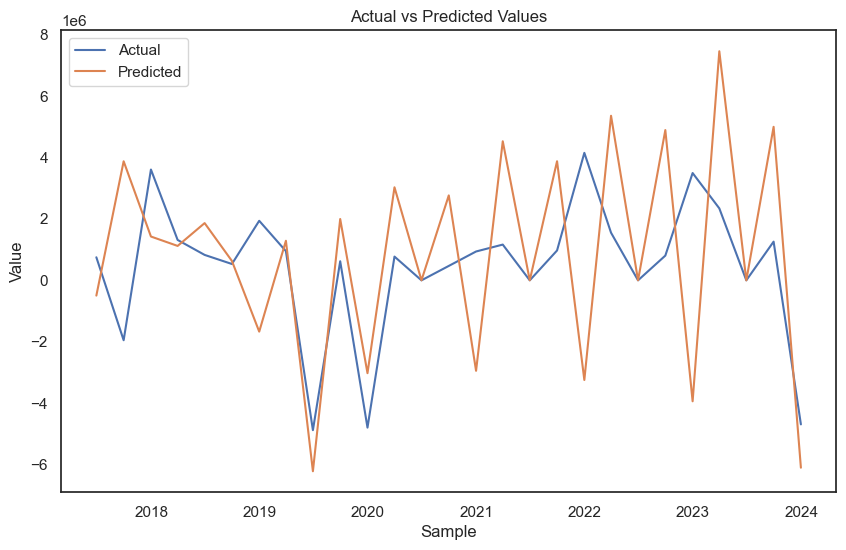

In [52]:
import matplotlib.pyplot as plt

# Przewidywane wartości
predictions = model.predict(test_f[-34:])
predictions = pd.DataFrame(predictions, index=actual_values.index)

# Rzeczywiste wartości
actual_values = test_l[:34]

# Wykres prognoz vs rzeczywistość
plt.figure(figsize=(10, 6))
plt.plot(actual_values, label='Actual')
plt.plot(predictions, label='Predicted')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()

In [51]:
train_f

,Przychody ogółem,Zysk z działalności operacyjnej,EBITDA,Przychody finansowe,Wydatki finansowe,Zysk brutto,Aktywa trwałe,Aktywa obrotowe,Kapitał własny ogółem,Kapitał własny spółki dominującej,Zobowiązania długoterminowe,Zobowiązania krótkoterminowe,Pożyczki krótkoterminowe
Date,,,,,,,,,,,,,
2011-03-31,7405123.0,1580370.0,2239445.0,0.000000,-9277.0,1571093.0,44162539.0,7922450.0,38945337.0,38325164.0,7706020.0,5433632.0,1241806.0
2011-06-30,6796779.0,1251540.0,1917931.0,0.000000,-48622.0,1202918.0,-1010303.0,1324090.0,-294126.0,-286406.0,-504693.0,1112606.0,-549543.0
2011-09-30,-14201902.0,-2831910.0,-4157376.0,0.000000,57899.0,-2774011.0,-43152236.0,-9246540.0,-38651211.0,-38038758.0,-7201327.0,-6546238.0,-692263.0
2011-12-31,28909711.0,4264667.0,6961259.0,183358.826923,-457856.0,6111208.0,44444933.0,14317698.0,41113610.0,40699616.0,7275616.0,10373405.0,697661.0
2012-03-31,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-06-30,15326610.0,3107149.0,4537915.0,301751.000000,-179212.0,3229688.0,44723014.0,15265999.0,40222348.0,39890161.0,7230454.0,12536211.0,417626.0
2012-09-30,-15326610.0,-3107149.0,-4537915.0,-301751.000000,179212.0,-3229688.0,-44723014.0,-15265999.0,-40222348.0,-39890161.0,-7230454.0,-12536211.0,-417626.0
2012-12-31,31000043.0,5868754.0,9767722.0,395170.000000,-246164.0,4610035.0,45406698.0,11296906.0,41011286.0,40716929.0,8474881.0,7217437.0,811447.0
2013-03-31,7923278.0,1547521.0,2274309.0,78322.000000,-97622.0,1528221.0,45393840.0,14129302.0,42351378.0,42049826.0,8562435.0,8609329.0,548421.0


In [ ]:
def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """

    df = pd.DataFrame(data={"y_true":y_true[0],"y_pred":y_pred[0]}, index=y_true.index)
    df_filtered = df[df['y_true'] != 0]
    y_true, y_pred = np.array(df_filtered['y_true']), np.array(df_filtered['y_pred'])
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(actual_values[:-1], predictions[:-1])
print(f"MAPE {i}: ", round(mape,2),"%")